In [1]:
import os
import numpy as np
import torch, torchvision
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import TensorDataset, DataLoader
from pathlib import Path
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from matplotlib import colors
import sys
from tqdm import tqdm
import numpy as np
from numpy.fft import fft2, fftshift
import matplotlib.pyplot as plt
import sys
import os
import importlib

plt.rcParams["image.cmap"] = "jet"

In [20]:
# Setting path
# path = Path("Y:/ptychosaxs")  # /net/micdata/data2/12IDC mounted windows drive
#path = Path("/net/micdata/data2/12IDC/ptychosaxs/")
path = Path("/scratch/")
# Join paths
MODEL_SAVE_PATH = path / 'trained_model/' # Automatically adds the correct separator
if (not os.path.isdir(MODEL_SAVE_PATH)):
    os.mkdir(MODEL_SAVE_PATH)
print(MODEL_SAVE_PATH)

/scratch/trained_model


In [21]:
# Load preprocessed data
directory='LatticeSC_Probe256x256_ZCB_9_3D__Noise_sim_ZCB_9_3D_S5065_N600_steps4_dp256'
directory='LatticeClathII_Probe256x256_ZCB_9_3D__Noise_sim_ZCB_9_3D_S5065_N600_steps4_dp256'
#num='July2025_TEST'#17
numDPs=9600#11025#8820

# Load the data
#data_path = os.path.abspath(os.path.join(os.getcwd(), f'../../data/processed/preprocessed_dir_July2025_{directory}_{numDPs}dps.npz'))
#data_path = os.path.abspath(os.path.join(os.getcwd(), f'/scratch/preprocessed_dir_July2025_{directory}_{numDPs}dps.npz'))
data_path = os.path.abspath(os.path.join(os.getcwd(), f'/scratch/preprocessed_sim_{directory}.npz'))
data = np.load(data_path)

# Extract the arrays
amp_conv_red = data['amp_conv_red']
amp_ideal_red = data['amp_ideal_red']
amp_probe_red = data['amp_probe_red']

KeyboardInterrupt: 

In [ ]:
# Set the number of patterns in test, train or validation set
NTEST = amp_conv_red.shape[0]//4
NTRAIN = amp_conv_red.shape[0]-NTEST
NVALID = NTEST//2 # NTRAIN//

print(NTRAIN,NTEST,NVALID)

7200 2400 1200


In [ ]:
EPOCHS = 25
# Specify which GPUs to use (e.g. GPUs 1 and 2)
selected_gpus = [1,3]  # Yes, this will use the first 3 GPUs (0, 1, and 2)
NGPUS = len(selected_gpus)
#NGPUS = torch.cuda.device_count()#1
BATCH_SIZE = NGPUS*16
LR = NGPUS * 1e-3
print("GPUs:", NGPUS, "Batch size:", BATCH_SIZE, "Learning rate:", LR)

no_probe=True
H,W=amp_ideal_red[0].shape[0],amp_ideal_red[0].shape[1]
print(H,W)

GPUs: 2 Batch size: 32 Learning rate: 0.002
256 256


In [ ]:
#separate data and convert to tensors and shuffle
no_probe=True

tst_start = amp_conv_red.shape[0]-NTEST

X_train = amp_conv_red[:NTRAIN].reshape(-1,H,W)[:,np.newaxis,:,:]
X_test = amp_conv_red[tst_start:].reshape(-1,H,W)[:,np.newaxis,:,:]

Xp_train = amp_probe_red[:NTRAIN].reshape(-1,H,W)[:,np.newaxis,:,:]
Xp_test = amp_probe_red[tst_start:].reshape(-1,H,W)[:,np.newaxis,:,:]

Y_I_train = amp_ideal_red[:NTRAIN].reshape(-1,H,W)[:,np.newaxis,:,:]
Y_I_test = amp_ideal_red[tst_start:].reshape(-1,H,W)[:,np.newaxis,:,:]

ntrain=X_train.shape[0]
ntest=X_test.shape[0]

X_train, Xp_train, Y_I_train = shuffle(X_train, Xp_train, Y_I_train, random_state=0)

#Training data
X_train_tensor = torch.Tensor(X_train)
Xp_train_tensor = torch.Tensor(Xp_train) 
Y_I_train_tensor = torch.Tensor(Y_I_train) 

#Test data
X_test_tensor = torch.Tensor(X_test)
Xp_test_tensor = torch.Tensor(Xp_test) 
Y_I_test_tensor = torch.Tensor(Y_I_test) 

print(X_train_tensor.shape,Xp_train_tensor.shape, Y_I_train_tensor.shape)


if no_probe:
    train_data = TensorDataset(X_train_tensor,Y_I_train_tensor)
    test_data = TensorDataset(X_test_tensor,Xp_test_tensor)
else:
    train_data = TensorDataset(X_train_tensor,Xp_train_tensor,Y_I_train_tensor)
    test_data = TensorDataset(X_test_tensor,Xp_test_tensor)


N_TRAIN = X_train_tensor.shape[0]

train_data2, valid_data = torch.utils.data.random_split(train_data,[N_TRAIN-NVALID,NVALID])
print(len(train_data2),len(train_data2[0]),len(valid_data),len(test_data))


#download and load training data
trainloader = DataLoader(train_data2, batch_size=BATCH_SIZE, shuffle=True, num_workers=4)

validloader = DataLoader(valid_data, batch_size=BATCH_SIZE, shuffle=True, num_workers=4)

#same for test
#download and load training data
testloader = DataLoader(test_data, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

torch.Size([7200, 1, 256, 256]) torch.Size([7200, 1, 256, 256]) torch.Size([7200, 1, 256, 256])
6000 2 1200 2400


In [ ]:


# Add the models directory to the path
sys.path.append(os.path.abspath(os.path.join(os.getcwd(), '../../src/models/')))

# # First, try to import the module
# try:
#     import encoder1_no_Unet
#     # Force reload the module
#     importlib.reload(encoder1_no_Unet)
#     # Now import the class from the freshly reloaded module
#     from encoder1_no_Unet import recon_model
#     print("Successfully imported recon_model")
#     unet_status = "no_Unet"
#     loss_function = "L2"
# except Exception as e:
#     print(f"Import error: {e}")
    
#First, try to import the module
try:
    import encoder1
    importlib.reload(encoder1)
    # Now import the class from the freshly reloaded module
    from encoder1 import recon_model
    print("Successfully imported recon_model")
    unet_status = "Unet"
    loss_function = "pearson_loss"
    #loss_function = "L2"
except Exception as e:
    print(f"Import error: {e}")


model = recon_model()
load_prev_model=False

Successfully imported recon_model


In [ ]:
if no_probe:
    for ampsI,ampsO in trainloader:
        print("batch size:", ampsI.shape)
        amp = model(ampsI)#,ampsP)
        print(amp.shape)
        print(amp.dtype)
        break
else:
    for ampsI,ampsP,ampsO in trainloader:
        print("batch size:", ampsI.shape)
        amp = model(ampsI,ampsP)
        print(amp.shape)
        print(amp.dtype)
        break    


device = torch.device(f"cuda:{selected_gpus[0]}" if torch.cuda.is_available() else "cpu")
device_ids = selected_gpus  # This will use only the specified GPUs

# if torch.cuda.device_count() > 1:
#     print("Let's use", torch.cuda.device_count(), "GPUs!")
#     # dim = 0 [30, xxx] -> [10, ...], [10, ...], [10, ...] on 3 GPUs
#     #model = nn.parallel.DistributedDataParallel(model) #Default all devices
#     model = nn.DataParallel(model)

if load_prev_model:
    MODEL_LOAD_PATH = '/scratch/trained_model/best_model_ZCB_9_3D_S5065_N1200_steps3_dp256_Unet_epoch_500_pearson_loss.pth'
    model.load_state_dict(torch.load(MODEL_LOAD_PATH))
    print("Loaded previous model")

if NGPUS > 1:
    print("Let's use", NGPUS, "GPUs!")
    # dim = 0 [30, xxx] -> [10, ...], [10, ...], [10, ...] on 3 GPUs
    #model = nn.parallel.DistributedDataParallel(model) #Default all devices
    model = nn.DataParallel(model, device_ids=device_ids)  # Explicitly specify which GPUs to use

model = model.to(device)
print(model)

batch size: torch.Size([32, 1, 256, 256])
torch.Size([32, 1, 256, 256])
torch.float32
Let's use 2 GPUs!
DataParallel(
  (module): recon_model(
    (encoder1): Sequential(
      (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU()
    )
    (encoder2): Sequential(
      (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU()
    )
    (encoder3): Sequential(
      (0): Co

In [ ]:
# NO SYMMETRY PENALTY
# def pearson_loss(output, target):
#     """
#     Compute 1 - Pearson correlation coefficient as a loss function.
#     Args:
#         output: Predicted values (B, C, H, W)
#         target: Target values (B, C, H, W)
#     Returns:
#         loss: 1 - correlation (to minimize)
#     """
#     # Flatten the spatial dimensions
#     output_flat = output.view(output.size(0), -1)
#     target_flat = target.view(target.size(0), -1)
    
#     # Mean of each image
#     output_mean = output_flat.mean(dim=1, keepdim=True)
#     target_mean = target_flat.mean(dim=1, keepdim=True)
    
#     # Centered variables
#     output_centered = output_flat - output_mean
#     target_centered = target_flat - target_mean
    
#     # Correlation
#     numerator = (output_centered * target_centered).sum(dim=1)
#     denominator = torch.sqrt((output_centered**2).sum(dim=1) * (target_centered**2).sum(dim=1))
    
#     # Avoid division by zero
#     correlation = numerator / (denominator + 1e-8)
    
#     # Average over batch and convert to loss (1 - correlation)
#     loss = 1 - correlation.mean()
    
#     #Negaive pearson loss
#     #loss = 1 + correlation.mean()
    
#     return loss

In [ ]:
#SYMMETRY PENALTY
symmetry_weight = 0.0
def pearson_loss(output, target):
    """
    Compute 1 - Pearson correlation coefficient as a loss function, with additional
    penalty for breaking inversion symmetry outside central 64x64 circle.
    Args:
        output: Predicted values (B, C, H, W)
        target: Target values (B, C, H, W)
    Returns:
        loss: Combined loss of correlation and symmetry terms
    """
    # Create circular mask for central 64x64 region
    h, w = output.shape[2:]
    y, x = torch.meshgrid(torch.arange(h), torch.arange(w))
    center_y, center_x = h // 2, w // 2
    radius = 32  # 64/2 for 64x64 circle
    mask = ((y - center_y)**2 + (x - center_x)**2 <= radius**2).to(output.device)
    
    # Basic Pearson correlation loss
    output_flat = output.view(output.size(0), -1)
    target_flat = target.view(target.size(0), -1)
    
    output_mean = output_flat.mean(dim=1, keepdim=True)
    target_mean = target_flat.mean(dim=1, keepdim=True)
    
    output_centered = output_flat - output_mean
    target_centered = target_flat - target_mean
    
    numerator = (output_centered * target_centered).sum(dim=1)
    denominator = torch.sqrt((output_centered**2).sum(dim=1) * (target_centered**2).sum(dim=1))
    correlation = numerator / (denominator + 1e-8)
    pearson_loss = 1 - correlation.mean()
    
    # Symmetry loss for region outside circle
    output_flipped = torch.flip(output, dims=[-2, -1])  # Flip both height and width
    outside_mask = ~mask
    symmetry_loss = torch.mean(torch.abs(output[..., outside_mask] - output_flipped[..., outside_mask]))
    
    # Combine losses - can adjust weight of symmetry term
    #symmetry_weight = 0.5
    total_loss = pearson_loss + symmetry_weight * symmetry_loss
    
    return total_loss, pearson_loss, symmetry_loss

In [ ]:
#Optimizer details
iterations_per_epoch = np.floor((NTRAIN-NVALID)/BATCH_SIZE)+1 #Final batch will be less than batch size
step_size = 6*iterations_per_epoch 
print(iterations_per_epoch)
print("LR step size is:", step_size, "which is every %d epochs" %(step_size/iterations_per_epoch))



#criterion = nn.L1Loss()
#criterion = nn.MSELoss()
    

optimizer = torch.optim.Adam(model.parameters(), lr = LR, weight_decay=1e-5)
scheduler = torch.optim.lr_scheduler.CyclicLR(optimizer, base_lr=LR/10, max_lr=LR, step_size_up=step_size,
                                              cycle_momentum=False, mode='triangular2')
                                              
                                            
#Function to update saved model if validation loss is minimum

def update_saved_model(model, path, current_epoch, best_val_loss):
    if not os.path.isdir(path):
        os.mkdir(path)
    
    # Save the best overall model
    if (NGPUS>1):    
        torch.save(model.module.state_dict(), path / f'best_model_{directory}_{unet_status}_{loss_function}_symmetry_{symmetry_weight}.pth')
    else:
        torch.save(model.state_dict(), path / f'best_model_{directory}_{unet_status}_{loss_function}_symmetry_{symmetry_weight}.pth')
    
    # Define epoch intervals (50, 100, 150, etc.)
    epoch_intervals = [2, 10, 25, 50, 100, 150, 200, 250, 300, 400, 500]
    
    # For each interval, save the best model within that interval
    for interval in epoch_intervals:
        if current_epoch <= interval:
            # Create a filename that includes the epoch interval
            interval_filename = f'best_model_{directory}_{unet_status}_epoch_{interval}_{loss_function}_symmetry_{symmetry_weight}.pth'
            interval_path = path / interval_filename
            
            # If this is the first time we're saving for this interval, save the model
            if not interval_path.exists():
                if (NGPUS>1):
                    torch.save(model.module.state_dict(), interval_path)
                else:
                    torch.save(model.state_dict(), interval_path)
                print(f"Saving best model for epoch interval {interval} at epoch {current_epoch}")
            # If we already have a model for this interval, only update if the current loss is better
            else:
                # Load the previous best loss for this interval
                prev_loss_path = path / f'best_loss_epoch_{directory}_{unet_status}_{interval}_{loss_function}_symmetry_{symmetry_weight}.txt'
                if prev_loss_path.exists():
                    with open(prev_loss_path, 'r') as f:
                        prev_best_loss = float(f.read().strip())
                    
                    # Update if current loss is better
                    if best_val_loss < prev_best_loss:
                        if (NGPUS>1):
                            torch.save(model.module.state_dict(), interval_path)
                        else:
                            torch.save(model.state_dict(), interval_path)
                        with open(prev_loss_path, 'w') as f:
                            f.write(str(best_val_loss))
                        print(f"Updating best model for epoch interval {interval} at epoch {current_epoch}")
                else:
                    # First time saving for this interval
                    if (NGPUS>1):
                        torch.save(model.module.state_dict(), interval_path)
                    else:
                        torch.save(model.state_dict(), interval_path)
                    with open(prev_loss_path, 'w') as f:
                        f.write(str(best_val_loss))
                    print(f"Saving best model for epoch interval {interval} at epoch {current_epoch}")



def train(trainloader,metrics):
    tot_loss = 0.0
    tot_loss_amp = 0.0
    tot_loss_symmetry = 0.0
    
    for i, (ft_images,amps) in tqdm(enumerate(trainloader)):
        ft_images = ft_images.to(device) #Move everything to device
        amps = amps.to(device)
        pred_amps = model(ft_images) #Forward pass
        
        #Compute losses
        #loss_a = criterion(pred_amps,amps) #Monitor amplitude loss
        loss_a,loss_pearson,loss_symmetry = pearson_loss(pred_amps,amps)
        loss = loss_a #Use equiweighted amps and phase

        #Zero current grads and do backprop
        optimizer.zero_grad() 
        loss.backward()
        optimizer.step()

        tot_loss += loss.detach().item()
        tot_loss_amp += loss_pearson.detach().item()
        tot_loss_symmetry += loss_symmetry.detach().item()

        #Update the LR according to the schedule -- CyclicLR updates each batch
        scheduler.step() 
        metrics['lrs'].append(scheduler.get_last_lr())
        
        
    #Divide cumulative loss by number of batches-- sli inaccurate because last batch is different size
    metrics['losses'].append([tot_loss/i,tot_loss_amp/i,tot_loss_symmetry/i]) 
    
def validate(validloader,metrics):
    tot_val_loss = 0.0
    tot_val_loss_amp = 0.0
    tot_val_loss_symmetry = 0.0
    for j, (ft_images,amps) in enumerate(validloader):
        ft_images = ft_images.to(device)
        amps = amps.to(device)
        pred_amps = model(ft_images) #Forward pass

        #val_loss_a = criterion(pred_amps,amps)
        val_loss_a,val_loss_pearson,val_loss_symmetry = pearson_loss(pred_amps,amps)
        val_loss = val_loss_a
    
        tot_val_loss += val_loss.detach().item()
        tot_val_loss_amp += val_loss_pearson.detach().item()
        tot_val_loss_symmetry += val_loss_symmetry.detach().item()
        
    metrics['val_losses'].append([tot_val_loss/j,tot_val_loss_amp/j,tot_val_loss_symmetry/j])
  
    #Update saved model if val loss is lower
    if(tot_val_loss/j<metrics['best_val_loss']):
        print("Saving improved model after Val Loss improved from %.5f to %.5f" %(metrics['best_val_loss'],tot_val_loss/j))
        metrics['best_val_loss'] = tot_val_loss/j
        update_saved_model(model, MODEL_SAVE_PATH, metrics['current_epoch'], tot_val_loss/j)
        
        



188.0
LR step size is: 1128.0 which is every 6 epochs


In [ ]:
# Initialize metrics dictionary with current_epoch
metrics = {
    'losses': [],
    'val_losses': [],
    'lrs': [],
    'best_val_loss': float('inf'),
    'current_epoch': 0
}

for epoch in range (EPOCHS):
    metrics['current_epoch'] = epoch  # Update current epoch in metrics
    
    #Set model to train mode
    model.train() 
    #Training loop
    train(trainloader,metrics)
    
    #Switch model to eval mode
    model.eval()
    
    #Validation loop
    validate(validloader,metrics)
    print('Epoch: %d | Total  | Train Loss: %.5f | Val Loss: %.5f' %(epoch, metrics['losses'][-1][0], metrics['val_losses'][-1][0]))
    print('Epoch: %d | Amp | Train Loss: %.5f | Val Loss: %.5f' %(epoch, metrics['losses'][-1][1], metrics['val_losses'][-1][1]))
    print('Epoch: %d | Symmetry | Train Loss: %.5f | Val Loss: %.5f' %(epoch, metrics['losses'][-1][2], metrics['val_losses'][-1][2]))
    print('Epoch: %d | Ending LR: %.6f ' %(epoch, metrics['lrs'][-1][0]))

188it [00:26,  7.20it/s]


Saving improved model after Val Loss improved from inf to 0.34768
Saving best model for epoch interval 2 at epoch 0
Saving best model for epoch interval 10 at epoch 0
Saving best model for epoch interval 25 at epoch 0
Saving best model for epoch interval 50 at epoch 0
Saving best model for epoch interval 100 at epoch 0
Saving best model for epoch interval 150 at epoch 0
Saving best model for epoch interval 200 at epoch 0
Saving best model for epoch interval 250 at epoch 0
Saving best model for epoch interval 300 at epoch 0
Saving best model for epoch interval 400 at epoch 0
Saving best model for epoch interval 500 at epoch 0
Epoch: 0 | Total  | Train Loss: 0.28588 | Val Loss: 0.34768
Epoch: 0 | Amp | Train Loss: 0.28588 | Val Loss: 0.34768
Epoch: 0 | Symmetry | Train Loss: 0.01827 | Val Loss: 0.01431
Epoch: 0 | Ending LR: 0.000500 


188it [00:25,  7.24it/s]


Saving improved model after Val Loss improved from 0.34768 to 0.24758
Saving best model for epoch interval 2 at epoch 1
Saving best model for epoch interval 10 at epoch 1
Saving best model for epoch interval 25 at epoch 1
Saving best model for epoch interval 50 at epoch 1
Saving best model for epoch interval 100 at epoch 1
Saving best model for epoch interval 150 at epoch 1
Saving best model for epoch interval 200 at epoch 1
Saving best model for epoch interval 250 at epoch 1
Saving best model for epoch interval 300 at epoch 1
Saving best model for epoch interval 400 at epoch 1
Saving best model for epoch interval 500 at epoch 1
Epoch: 1 | Total  | Train Loss: 0.23477 | Val Loss: 0.24758
Epoch: 1 | Amp | Train Loss: 0.23477 | Val Loss: 0.24758
Epoch: 1 | Symmetry | Train Loss: 0.01170 | Val Loss: 0.01437
Epoch: 1 | Ending LR: 0.000800 


188it [00:26,  7.22it/s]


Saving improved model after Val Loss improved from 0.24758 to 0.22588
Updating best model for epoch interval 2 at epoch 2
Updating best model for epoch interval 10 at epoch 2
Updating best model for epoch interval 25 at epoch 2
Updating best model for epoch interval 50 at epoch 2
Updating best model for epoch interval 100 at epoch 2
Updating best model for epoch interval 150 at epoch 2
Updating best model for epoch interval 200 at epoch 2
Updating best model for epoch interval 250 at epoch 2
Updating best model for epoch interval 300 at epoch 2
Updating best model for epoch interval 400 at epoch 2
Updating best model for epoch interval 500 at epoch 2
Epoch: 2 | Total  | Train Loss: 0.21823 | Val Loss: 0.22588
Epoch: 2 | Amp | Train Loss: 0.21823 | Val Loss: 0.22588
Epoch: 2 | Symmetry | Train Loss: 0.01224 | Val Loss: 0.01819
Epoch: 2 | Ending LR: 0.001100 


188it [00:26,  7.21it/s]


Saving improved model after Val Loss improved from 0.22588 to 0.20057
Updating best model for epoch interval 10 at epoch 3
Updating best model for epoch interval 25 at epoch 3
Updating best model for epoch interval 50 at epoch 3
Updating best model for epoch interval 100 at epoch 3
Updating best model for epoch interval 150 at epoch 3
Updating best model for epoch interval 200 at epoch 3
Updating best model for epoch interval 250 at epoch 3
Updating best model for epoch interval 300 at epoch 3
Updating best model for epoch interval 400 at epoch 3
Updating best model for epoch interval 500 at epoch 3
Epoch: 3 | Total  | Train Loss: 0.20790 | Val Loss: 0.20057
Epoch: 3 | Amp | Train Loss: 0.20790 | Val Loss: 0.20057
Epoch: 3 | Symmetry | Train Loss: 0.01231 | Val Loss: 0.01284
Epoch: 3 | Ending LR: 0.001400 


188it [00:26,  7.17it/s]


Saving improved model after Val Loss improved from 0.20057 to 0.19644
Updating best model for epoch interval 10 at epoch 4
Updating best model for epoch interval 25 at epoch 4
Updating best model for epoch interval 50 at epoch 4
Updating best model for epoch interval 100 at epoch 4
Updating best model for epoch interval 150 at epoch 4
Updating best model for epoch interval 200 at epoch 4
Updating best model for epoch interval 250 at epoch 4
Updating best model for epoch interval 300 at epoch 4
Updating best model for epoch interval 400 at epoch 4
Updating best model for epoch interval 500 at epoch 4
Epoch: 4 | Total  | Train Loss: 0.19886 | Val Loss: 0.19644
Epoch: 4 | Amp | Train Loss: 0.19886 | Val Loss: 0.19644
Epoch: 4 | Symmetry | Train Loss: 0.01287 | Val Loss: 0.01153
Epoch: 4 | Ending LR: 0.001700 


188it [00:26,  7.22it/s]


Saving improved model after Val Loss improved from 0.19644 to 0.19387
Updating best model for epoch interval 10 at epoch 5
Updating best model for epoch interval 25 at epoch 5
Updating best model for epoch interval 50 at epoch 5
Updating best model for epoch interval 100 at epoch 5
Updating best model for epoch interval 150 at epoch 5
Updating best model for epoch interval 200 at epoch 5
Updating best model for epoch interval 250 at epoch 5
Updating best model for epoch interval 300 at epoch 5
Updating best model for epoch interval 400 at epoch 5
Updating best model for epoch interval 500 at epoch 5
Epoch: 5 | Total  | Train Loss: 0.19296 | Val Loss: 0.19387
Epoch: 5 | Amp | Train Loss: 0.19296 | Val Loss: 0.19387
Epoch: 5 | Symmetry | Train Loss: 0.01310 | Val Loss: 0.01376
Epoch: 5 | Ending LR: 0.002000 


188it [00:26,  7.20it/s]


Saving improved model after Val Loss improved from 0.19387 to 0.18722
Updating best model for epoch interval 10 at epoch 6
Updating best model for epoch interval 25 at epoch 6
Updating best model for epoch interval 50 at epoch 6
Updating best model for epoch interval 100 at epoch 6
Updating best model for epoch interval 150 at epoch 6
Updating best model for epoch interval 200 at epoch 6
Updating best model for epoch interval 250 at epoch 6
Updating best model for epoch interval 300 at epoch 6
Updating best model for epoch interval 400 at epoch 6
Updating best model for epoch interval 500 at epoch 6
Epoch: 6 | Total  | Train Loss: 0.18746 | Val Loss: 0.18722
Epoch: 6 | Amp | Train Loss: 0.18746 | Val Loss: 0.18722
Epoch: 6 | Symmetry | Train Loss: 0.01316 | Val Loss: 0.01285
Epoch: 6 | Ending LR: 0.001700 


188it [00:26,  7.21it/s]


Saving improved model after Val Loss improved from 0.18722 to 0.18136
Updating best model for epoch interval 10 at epoch 7
Updating best model for epoch interval 25 at epoch 7
Updating best model for epoch interval 50 at epoch 7
Updating best model for epoch interval 100 at epoch 7
Updating best model for epoch interval 150 at epoch 7
Updating best model for epoch interval 200 at epoch 7
Updating best model for epoch interval 250 at epoch 7
Updating best model for epoch interval 300 at epoch 7
Updating best model for epoch interval 400 at epoch 7
Updating best model for epoch interval 500 at epoch 7
Epoch: 7 | Total  | Train Loss: 0.18177 | Val Loss: 0.18136
Epoch: 7 | Amp | Train Loss: 0.18177 | Val Loss: 0.18136
Epoch: 7 | Symmetry | Train Loss: 0.01286 | Val Loss: 0.01250
Epoch: 7 | Ending LR: 0.001400 


188it [00:26,  7.22it/s]


Saving improved model after Val Loss improved from 0.18136 to 0.17659
Updating best model for epoch interval 10 at epoch 8
Updating best model for epoch interval 25 at epoch 8
Updating best model for epoch interval 50 at epoch 8
Updating best model for epoch interval 100 at epoch 8
Updating best model for epoch interval 150 at epoch 8
Updating best model for epoch interval 200 at epoch 8
Updating best model for epoch interval 250 at epoch 8
Updating best model for epoch interval 300 at epoch 8
Updating best model for epoch interval 400 at epoch 8
Updating best model for epoch interval 500 at epoch 8
Epoch: 8 | Total  | Train Loss: 0.17738 | Val Loss: 0.17659
Epoch: 8 | Amp | Train Loss: 0.17738 | Val Loss: 0.17659
Epoch: 8 | Symmetry | Train Loss: 0.01281 | Val Loss: 0.01213
Epoch: 8 | Ending LR: 0.001100 


188it [00:26,  7.21it/s]


Saving improved model after Val Loss improved from 0.17659 to 0.17333
Updating best model for epoch interval 10 at epoch 9
Updating best model for epoch interval 25 at epoch 9
Updating best model for epoch interval 50 at epoch 9
Updating best model for epoch interval 100 at epoch 9
Updating best model for epoch interval 150 at epoch 9
Updating best model for epoch interval 200 at epoch 9
Updating best model for epoch interval 250 at epoch 9
Updating best model for epoch interval 300 at epoch 9
Updating best model for epoch interval 400 at epoch 9
Updating best model for epoch interval 500 at epoch 9
Epoch: 9 | Total  | Train Loss: 0.17311 | Val Loss: 0.17333
Epoch: 9 | Amp | Train Loss: 0.17311 | Val Loss: 0.17333
Epoch: 9 | Symmetry | Train Loss: 0.01270 | Val Loss: 0.01249
Epoch: 9 | Ending LR: 0.000800 


188it [00:26,  7.18it/s]


Saving improved model after Val Loss improved from 0.17333 to 0.16916
Updating best model for epoch interval 10 at epoch 10
Updating best model for epoch interval 25 at epoch 10
Updating best model for epoch interval 50 at epoch 10
Updating best model for epoch interval 100 at epoch 10
Updating best model for epoch interval 150 at epoch 10
Updating best model for epoch interval 200 at epoch 10
Updating best model for epoch interval 250 at epoch 10
Updating best model for epoch interval 300 at epoch 10
Updating best model for epoch interval 400 at epoch 10
Updating best model for epoch interval 500 at epoch 10
Epoch: 10 | Total  | Train Loss: 0.16910 | Val Loss: 0.16916
Epoch: 10 | Amp | Train Loss: 0.16910 | Val Loss: 0.16916
Epoch: 10 | Symmetry | Train Loss: 0.01255 | Val Loss: 0.01208
Epoch: 10 | Ending LR: 0.000500 


188it [00:26,  7.21it/s]


Saving improved model after Val Loss improved from 0.16916 to 0.16559
Updating best model for epoch interval 25 at epoch 11
Updating best model for epoch interval 50 at epoch 11
Updating best model for epoch interval 100 at epoch 11
Updating best model for epoch interval 150 at epoch 11
Updating best model for epoch interval 200 at epoch 11
Updating best model for epoch interval 250 at epoch 11
Updating best model for epoch interval 300 at epoch 11
Updating best model for epoch interval 400 at epoch 11
Updating best model for epoch interval 500 at epoch 11
Epoch: 11 | Total  | Train Loss: 0.16479 | Val Loss: 0.16559
Epoch: 11 | Amp | Train Loss: 0.16479 | Val Loss: 0.16559
Epoch: 11 | Symmetry | Train Loss: 0.01231 | Val Loss: 0.01173
Epoch: 11 | Ending LR: 0.000200 


188it [00:25,  7.23it/s]


Epoch: 12 | Total  | Train Loss: 0.16209 | Val Loss: 0.16708
Epoch: 12 | Amp | Train Loss: 0.16209 | Val Loss: 0.16708
Epoch: 12 | Symmetry | Train Loss: 0.01222 | Val Loss: 0.01204
Epoch: 12 | Ending LR: 0.000350 


188it [00:26,  7.23it/s]


Epoch: 13 | Total  | Train Loss: 0.16325 | Val Loss: 0.16854
Epoch: 13 | Amp | Train Loss: 0.16325 | Val Loss: 0.16854
Epoch: 13 | Symmetry | Train Loss: 0.01246 | Val Loss: 0.01264
Epoch: 13 | Ending LR: 0.000500 


188it [00:26,  7.22it/s]


Epoch: 14 | Total  | Train Loss: 0.16512 | Val Loss: 0.16956
Epoch: 14 | Amp | Train Loss: 0.16512 | Val Loss: 0.16956
Epoch: 14 | Symmetry | Train Loss: 0.01258 | Val Loss: 0.01246
Epoch: 14 | Ending LR: 0.000650 


188it [00:26,  7.20it/s]


Epoch: 15 | Total  | Train Loss: 0.16613 | Val Loss: 0.17605
Epoch: 15 | Amp | Train Loss: 0.16613 | Val Loss: 0.17605
Epoch: 15 | Symmetry | Train Loss: 0.01279 | Val Loss: 0.01576
Epoch: 15 | Ending LR: 0.000800 


188it [00:26,  7.21it/s]


Epoch: 16 | Total  | Train Loss: 0.16737 | Val Loss: 0.17275
Epoch: 16 | Amp | Train Loss: 0.16737 | Val Loss: 0.17275
Epoch: 16 | Symmetry | Train Loss: 0.01311 | Val Loss: 0.01297
Epoch: 16 | Ending LR: 0.000950 


188it [00:26,  7.21it/s]


Epoch: 17 | Total  | Train Loss: 0.16802 | Val Loss: 0.17636
Epoch: 17 | Amp | Train Loss: 0.16802 | Val Loss: 0.17636
Epoch: 17 | Symmetry | Train Loss: 0.01315 | Val Loss: 0.01433
Epoch: 17 | Ending LR: 0.001100 


188it [00:26,  7.17it/s]


Epoch: 18 | Total  | Train Loss: 0.16626 | Val Loss: 0.16985
Epoch: 18 | Amp | Train Loss: 0.16626 | Val Loss: 0.16985
Epoch: 18 | Symmetry | Train Loss: 0.01311 | Val Loss: 0.01406
Epoch: 18 | Ending LR: 0.000950 


188it [00:26,  7.16it/s]


Epoch: 19 | Total  | Train Loss: 0.16336 | Val Loss: 0.16775
Epoch: 19 | Amp | Train Loss: 0.16336 | Val Loss: 0.16775
Epoch: 19 | Symmetry | Train Loss: 0.01291 | Val Loss: 0.01264
Epoch: 19 | Ending LR: 0.000800 


188it [00:26,  7.21it/s]


Saving improved model after Val Loss improved from 0.16559 to 0.16481
Updating best model for epoch interval 25 at epoch 20
Updating best model for epoch interval 50 at epoch 20
Updating best model for epoch interval 100 at epoch 20
Updating best model for epoch interval 150 at epoch 20
Updating best model for epoch interval 200 at epoch 20
Updating best model for epoch interval 250 at epoch 20
Updating best model for epoch interval 300 at epoch 20
Updating best model for epoch interval 400 at epoch 20
Updating best model for epoch interval 500 at epoch 20
Epoch: 20 | Total  | Train Loss: 0.16061 | Val Loss: 0.16481
Epoch: 20 | Amp | Train Loss: 0.16061 | Val Loss: 0.16481
Epoch: 20 | Symmetry | Train Loss: 0.01280 | Val Loss: 0.01357
Epoch: 20 | Ending LR: 0.000650 


188it [00:26,  7.20it/s]


Saving improved model after Val Loss improved from 0.16481 to 0.16449
Updating best model for epoch interval 25 at epoch 21
Updating best model for epoch interval 50 at epoch 21
Updating best model for epoch interval 100 at epoch 21
Updating best model for epoch interval 150 at epoch 21
Updating best model for epoch interval 200 at epoch 21
Updating best model for epoch interval 250 at epoch 21
Updating best model for epoch interval 300 at epoch 21
Updating best model for epoch interval 400 at epoch 21
Updating best model for epoch interval 500 at epoch 21
Epoch: 21 | Total  | Train Loss: 0.15814 | Val Loss: 0.16449
Epoch: 21 | Amp | Train Loss: 0.15814 | Val Loss: 0.16449
Epoch: 21 | Symmetry | Train Loss: 0.01274 | Val Loss: 0.01407
Epoch: 21 | Ending LR: 0.000500 


188it [00:26,  7.19it/s]


Saving improved model after Val Loss improved from 0.16449 to 0.16046
Updating best model for epoch interval 25 at epoch 22
Updating best model for epoch interval 50 at epoch 22
Updating best model for epoch interval 100 at epoch 22
Updating best model for epoch interval 150 at epoch 22
Updating best model for epoch interval 200 at epoch 22
Updating best model for epoch interval 250 at epoch 22
Updating best model for epoch interval 300 at epoch 22
Updating best model for epoch interval 400 at epoch 22
Updating best model for epoch interval 500 at epoch 22
Epoch: 22 | Total  | Train Loss: 0.15523 | Val Loss: 0.16046
Epoch: 22 | Amp | Train Loss: 0.15523 | Val Loss: 0.16046
Epoch: 22 | Symmetry | Train Loss: 0.01263 | Val Loss: 0.01313
Epoch: 22 | Ending LR: 0.000350 


188it [00:26,  7.17it/s]


Saving improved model after Val Loss improved from 0.16046 to 0.15849
Updating best model for epoch interval 25 at epoch 23
Updating best model for epoch interval 50 at epoch 23
Updating best model for epoch interval 100 at epoch 23
Updating best model for epoch interval 150 at epoch 23
Updating best model for epoch interval 200 at epoch 23
Updating best model for epoch interval 250 at epoch 23
Updating best model for epoch interval 300 at epoch 23
Updating best model for epoch interval 400 at epoch 23
Updating best model for epoch interval 500 at epoch 23
Epoch: 23 | Total  | Train Loss: 0.15185 | Val Loss: 0.15849
Epoch: 23 | Amp | Train Loss: 0.15185 | Val Loss: 0.15849
Epoch: 23 | Symmetry | Train Loss: 0.01236 | Val Loss: 0.01217
Epoch: 23 | Ending LR: 0.000200 


188it [00:26,  7.22it/s]


Epoch: 24 | Total  | Train Loss: 0.14981 | Val Loss: 0.16101
Epoch: 24 | Amp | Train Loss: 0.14981 | Val Loss: 0.16101
Epoch: 24 | Symmetry | Train Loss: 0.01225 | Val Loss: 0.01360
Epoch: 24 | Ending LR: 0.000275 


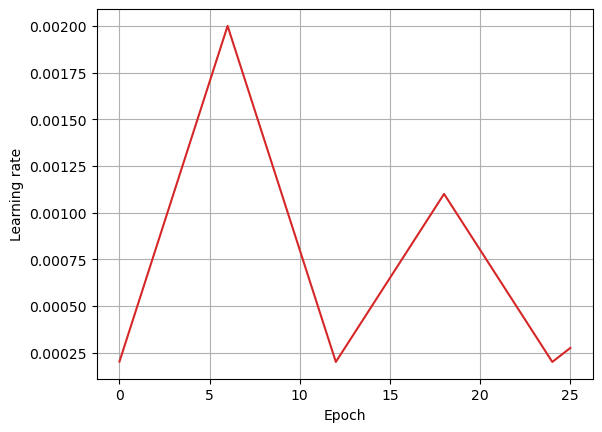

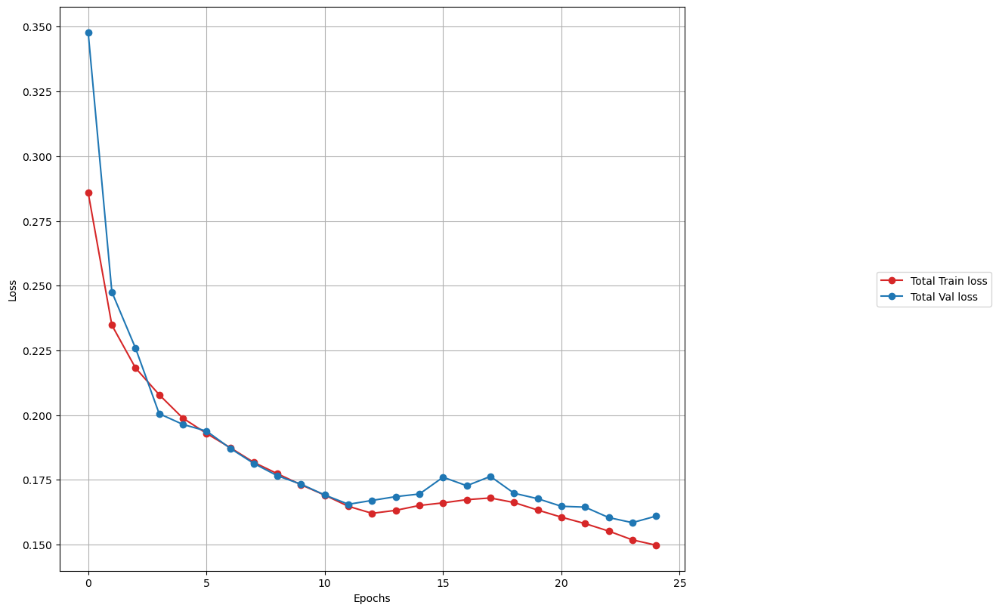

In [ ]:
batches = np.linspace(0,len(metrics['lrs']),len(metrics['lrs'])+1)
epoch_list = batches/iterations_per_epoch

plt.plot(epoch_list[1:],metrics['lrs'], 'C3-')
plt.grid()
plt.ylabel("Learning rate")
plt.xlabel("Epoch")


losses_arr = np.array(metrics['losses'])
val_losses_arr = np.array(metrics['val_losses'])
losses_arr.shape
fig, ax = plt.subplots(1,sharex=True, figsize=(15, 8))
ax.plot(losses_arr[:,0], 'C3o-', label = "Total Train loss")
ax.plot(val_losses_arr[:,0], 'C0o-', label = "Total Val loss")
ax.set(ylabel='Loss')
ax.grid()
ax.legend(loc='center right', bbox_to_anchor=(1.5, 0.5))
plt.tight_layout()
plt.xlabel("Epochs")
plt.show()

<Figure size 640x480 with 0 Axes>

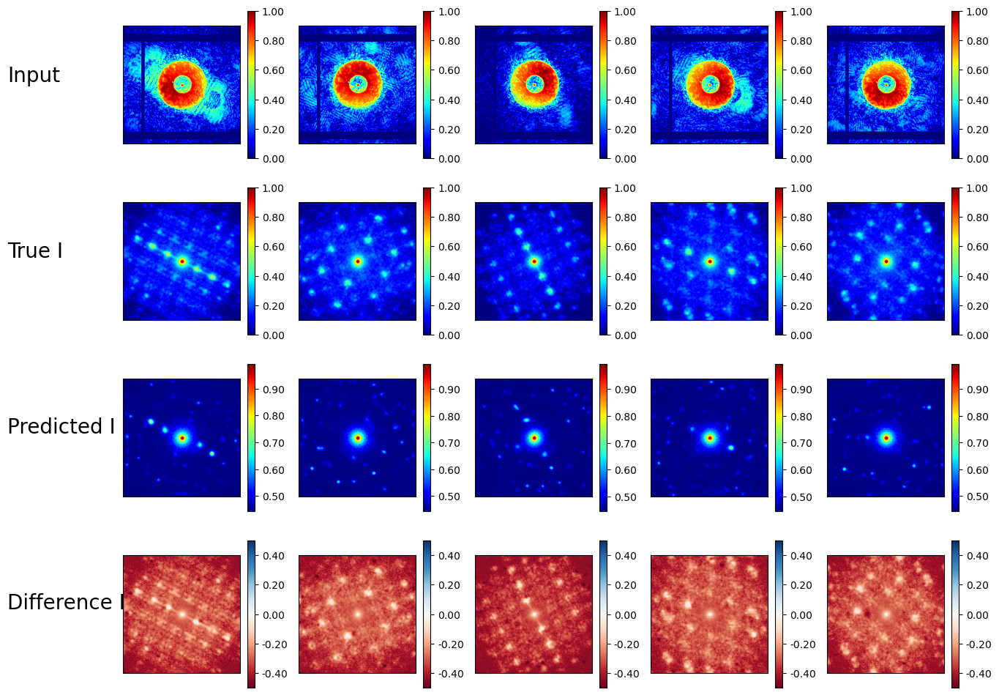

In [ ]:
model.eval()
#model_new.eval() #imp when have dropout etc
results = []
for i, test in enumerate(testloader):
    tests = test[0].to(device)
    testsp = test[1].to(device)
    result = model(tests)
    for j in range(tests.shape[0]):
        results.append(result[j].detach().to("cpu").numpy())
        
results = np.array(results).squeeze()



h,w = H,W
ntest=results.shape[0]
plt.figure()
n = 5
f,ax=plt.subplots(4,n,figsize=(15, 12))
plt.gcf().text(0.02, 0.8, "Input", fontsize=20)
plt.gcf().text(0.02, 0.6, "True I", fontsize=20)
plt.gcf().text(0.02, 0.4, "Predicted I", fontsize=20)
plt.gcf().text(0.02, 0.2, "Difference I", fontsize=20)

for i in range(0,n):
    j=int(round(np.random.rand()*ntest))

    # display FT
    im=ax[0,i].imshow(X_test[j].reshape(h, w), vmin=0, vmax=1)
    plt.colorbar(im, ax=ax[0,i], format='%.2f')
    ax[0,i].get_xaxis().set_visible(False)
    ax[0,i].get_yaxis().set_visible(False)

    # display original intens
    im=ax[1,i].imshow(Y_I_test[j].reshape(h, w))#, vmin=0, vmax=1)
    plt.colorbar(im, ax=ax[1,i], format='%.2f')
    ax[1,i].get_xaxis().set_visible(False)
    ax[1,i].get_yaxis().set_visible(False)
    
    # display predicted intens
    im=ax[2,i].imshow(results[j].reshape(h, w))#, vmin=0.0, vmax=1)
    plt.colorbar(im, ax=ax[2,i], format='%.2f')
    ax[2,i].get_xaxis().set_visible(False)
    ax[2,i].get_yaxis().set_visible(False)

    #Difference in amplitude
    im=ax[3,i].imshow(Y_I_test[j].reshape(h, w)-results[j].reshape(h, w), 
                      vmin=-0.5, vmax=0.5, cmap='RdBu')
    plt.colorbar(im, ax=ax[3,i], format='%.2f')
    ax[3,i].get_xaxis().set_visible(False)
    ax[3,i].get_yaxis().set_visible(False)
plt.show()

/net/micdata/data2/12IDC/ptychosaxs/batch_mode/trained_model
GPUs: 2 Batch size: 32 Learning rate: 0.002
LatticeClathII_Probe128x128_ZCB_9_3D__Noise_sim_ZCB_9_3D_S5065_N600_steps4_dp256
Loading data from: /net/micdata/data2/12IDC/ptychosaxs/batch_mode/preprocessed/preprocessed_sim_LatticeClathII_Probe128x128_ZCB_9_3D__Noise_sim_ZCB_9_3D_S5065_N600_steps4_dp256.npz
7200 2400 1200
256 256
torch.Size([7200, 1, 256, 256]) torch.Size([7200, 1, 256, 256]) torch.Size([7200, 1, 256, 256])
6000 2 1200 2400
Successfully imported recon_model_no_Unet
batch size: torch.Size([32, 1, 256, 256])
torch.Size([32, 1, 256, 256])
torch.float32
Let's use 2 GPUs!
DataParallel(
  (module): recon_model(
    (encoder1): Sequential(
      (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d

188it [00:23,  8.01it/s]


Saving improved model after Val Loss improved from inf to 0.52896
Saving best model for epoch interval 2 at epoch 0
Saving best model for epoch interval 10 at epoch 0
Saving best model for epoch interval 25 at epoch 0
Epoch: 0 | Total  | Train Loss: 0.25320 | Val Loss: 0.52896
Epoch: 0 | Amp | Train Loss: 0.25320 | Val Loss: 0.52896
Epoch: 0 | Symmetry | Train Loss: 0.01739 | Val Loss: 0.01526
Epoch: 0 | Ending LR: 0.000500 


188it [00:23,  8.06it/s]


Saving improved model after Val Loss improved from 0.52896 to 0.20111
Saving best model for epoch interval 2 at epoch 1
Saving best model for epoch interval 10 at epoch 1
Saving best model for epoch interval 25 at epoch 1
Epoch: 1 | Total  | Train Loss: 0.19689 | Val Loss: 0.20111
Epoch: 1 | Amp | Train Loss: 0.19689 | Val Loss: 0.20111
Epoch: 1 | Symmetry | Train Loss: 0.01235 | Val Loss: 0.01132
Epoch: 1 | Ending LR: 0.000800 


188it [00:23,  8.02it/s]


Saving improved model after Val Loss improved from 0.20111 to 0.18850
Updating best model for epoch interval 2 at epoch 2
Updating best model for epoch interval 10 at epoch 2
Updating best model for epoch interval 25 at epoch 2
Epoch: 2 | Total  | Train Loss: 0.18640 | Val Loss: 0.18850
Epoch: 2 | Amp | Train Loss: 0.18640 | Val Loss: 0.18850
Epoch: 2 | Symmetry | Train Loss: 0.01224 | Val Loss: 0.01230
Epoch: 2 | Ending LR: 0.001100 


188it [00:23,  8.00it/s]


Saving improved model after Val Loss improved from 0.18850 to 0.18022
Updating best model for epoch interval 10 at epoch 3
Updating best model for epoch interval 25 at epoch 3
Epoch: 3 | Total  | Train Loss: 0.18085 | Val Loss: 0.18022
Epoch: 3 | Amp | Train Loss: 0.18085 | Val Loss: 0.18022
Epoch: 3 | Symmetry | Train Loss: 0.01201 | Val Loss: 0.01035
Epoch: 3 | Ending LR: 0.001400 


188it [00:23,  7.98it/s]


Epoch: 4 | Total  | Train Loss: 0.17725 | Val Loss: 0.18081
Epoch: 4 | Amp | Train Loss: 0.17725 | Val Loss: 0.18081
Epoch: 4 | Symmetry | Train Loss: 0.01223 | Val Loss: 0.01188
Epoch: 4 | Ending LR: 0.001700 


188it [00:23,  7.94it/s]


Saving improved model after Val Loss improved from 0.18022 to 0.18020
Updating best model for epoch interval 10 at epoch 5
Updating best model for epoch interval 25 at epoch 5
Epoch: 5 | Total  | Train Loss: 0.17398 | Val Loss: 0.18020
Epoch: 5 | Amp | Train Loss: 0.17398 | Val Loss: 0.18020
Epoch: 5 | Symmetry | Train Loss: 0.01228 | Val Loss: 0.01218
Epoch: 5 | Ending LR: 0.002000 


188it [00:23,  8.01it/s]


Saving improved model after Val Loss improved from 0.18020 to 0.16973
Updating best model for epoch interval 10 at epoch 6
Updating best model for epoch interval 25 at epoch 6
Epoch: 6 | Total  | Train Loss: 0.17034 | Val Loss: 0.16973
Epoch: 6 | Amp | Train Loss: 0.17034 | Val Loss: 0.16973
Epoch: 6 | Symmetry | Train Loss: 0.01199 | Val Loss: 0.01149
Epoch: 6 | Ending LR: 0.001700 


188it [00:23,  7.99it/s]


Saving improved model after Val Loss improved from 0.16973 to 0.16636
Updating best model for epoch interval 10 at epoch 7
Updating best model for epoch interval 25 at epoch 7
Epoch: 7 | Total  | Train Loss: 0.16660 | Val Loss: 0.16636
Epoch: 7 | Amp | Train Loss: 0.16660 | Val Loss: 0.16636
Epoch: 7 | Symmetry | Train Loss: 0.01192 | Val Loss: 0.01197
Epoch: 7 | Ending LR: 0.001400 


188it [00:23,  7.98it/s]


Saving improved model after Val Loss improved from 0.16636 to 0.16489
Updating best model for epoch interval 10 at epoch 8
Updating best model for epoch interval 25 at epoch 8
Epoch: 8 | Total  | Train Loss: 0.16340 | Val Loss: 0.16489
Epoch: 8 | Amp | Train Loss: 0.16340 | Val Loss: 0.16489
Epoch: 8 | Symmetry | Train Loss: 0.01179 | Val Loss: 0.01240
Epoch: 8 | Ending LR: 0.001100 


188it [00:23,  7.98it/s]


Saving improved model after Val Loss improved from 0.16489 to 0.16164
Updating best model for epoch interval 10 at epoch 9
Updating best model for epoch interval 25 at epoch 9
Epoch: 9 | Total  | Train Loss: 0.16010 | Val Loss: 0.16164
Epoch: 9 | Amp | Train Loss: 0.16010 | Val Loss: 0.16164
Epoch: 9 | Symmetry | Train Loss: 0.01150 | Val Loss: 0.01020
Epoch: 9 | Ending LR: 0.000800 


188it [00:23,  7.99it/s]


Saving improved model after Val Loss improved from 0.16164 to 0.15807
Updating best model for epoch interval 10 at epoch 10
Updating best model for epoch interval 25 at epoch 10
Epoch: 10 | Total  | Train Loss: 0.15733 | Val Loss: 0.15807
Epoch: 10 | Amp | Train Loss: 0.15733 | Val Loss: 0.15807
Epoch: 10 | Symmetry | Train Loss: 0.01141 | Val Loss: 0.01108
Epoch: 10 | Ending LR: 0.000500 


188it [00:23,  7.94it/s]


Saving improved model after Val Loss improved from 0.15807 to 0.15639
Updating best model for epoch interval 25 at epoch 11
Epoch: 11 | Total  | Train Loss: 0.15435 | Val Loss: 0.15639
Epoch: 11 | Amp | Train Loss: 0.15435 | Val Loss: 0.15639
Epoch: 11 | Symmetry | Train Loss: 0.01124 | Val Loss: 0.01065
Epoch: 11 | Ending LR: 0.000200 


188it [00:23,  7.97it/s]


Epoch: 12 | Total  | Train Loss: 0.15249 | Val Loss: 0.15663
Epoch: 12 | Amp | Train Loss: 0.15249 | Val Loss: 0.15663
Epoch: 12 | Symmetry | Train Loss: 0.01119 | Val Loss: 0.01080
Epoch: 12 | Ending LR: 0.000350 


188it [00:23,  7.98it/s]


Epoch: 13 | Total  | Train Loss: 0.15370 | Val Loss: 0.15879
Epoch: 13 | Amp | Train Loss: 0.15370 | Val Loss: 0.15879
Epoch: 13 | Symmetry | Train Loss: 0.01138 | Val Loss: 0.01164
Epoch: 13 | Ending LR: 0.000500 


188it [00:23,  7.98it/s]


Epoch: 14 | Total  | Train Loss: 0.15490 | Val Loss: 0.15865
Epoch: 14 | Amp | Train Loss: 0.15490 | Val Loss: 0.15865
Epoch: 14 | Symmetry | Train Loss: 0.01154 | Val Loss: 0.01138
Epoch: 14 | Ending LR: 0.000650 


188it [00:23,  7.96it/s]


Epoch: 15 | Total  | Train Loss: 0.15588 | Val Loss: 0.15945
Epoch: 15 | Amp | Train Loss: 0.15588 | Val Loss: 0.15945
Epoch: 15 | Symmetry | Train Loss: 0.01172 | Val Loss: 0.01182
Epoch: 15 | Ending LR: 0.000800 


188it [00:23,  7.92it/s]


Epoch: 16 | Total  | Train Loss: 0.15651 | Val Loss: 0.16091
Epoch: 16 | Amp | Train Loss: 0.15651 | Val Loss: 0.16091
Epoch: 16 | Symmetry | Train Loss: 0.01193 | Val Loss: 0.01128
Epoch: 16 | Ending LR: 0.000950 


188it [00:23,  7.99it/s]


Epoch: 17 | Total  | Train Loss: 0.15671 | Val Loss: 0.15949
Epoch: 17 | Amp | Train Loss: 0.15671 | Val Loss: 0.15949
Epoch: 17 | Symmetry | Train Loss: 0.01196 | Val Loss: 0.01134
Epoch: 17 | Ending LR: 0.001100 


188it [00:23,  7.98it/s]


Epoch: 18 | Total  | Train Loss: 0.15523 | Val Loss: 0.15936
Epoch: 18 | Amp | Train Loss: 0.15523 | Val Loss: 0.15936
Epoch: 18 | Symmetry | Train Loss: 0.01194 | Val Loss: 0.01330
Epoch: 18 | Ending LR: 0.000950 


188it [00:23,  7.98it/s]


Epoch: 19 | Total  | Train Loss: 0.15321 | Val Loss: 0.15720
Epoch: 19 | Amp | Train Loss: 0.15321 | Val Loss: 0.15720
Epoch: 19 | Symmetry | Train Loss: 0.01181 | Val Loss: 0.01263
Epoch: 19 | Ending LR: 0.000800 


188it [00:23,  7.99it/s]


Epoch: 20 | Total  | Train Loss: 0.15092 | Val Loss: 0.15667
Epoch: 20 | Amp | Train Loss: 0.15092 | Val Loss: 0.15667
Epoch: 20 | Symmetry | Train Loss: 0.01161 | Val Loss: 0.01217
Epoch: 20 | Ending LR: 0.000650 


188it [00:23,  8.00it/s]


Saving improved model after Val Loss improved from 0.15639 to 0.15487
Updating best model for epoch interval 25 at epoch 21
Epoch: 21 | Total  | Train Loss: 0.14878 | Val Loss: 0.15487
Epoch: 21 | Amp | Train Loss: 0.14878 | Val Loss: 0.15487
Epoch: 21 | Symmetry | Train Loss: 0.01153 | Val Loss: 0.01204
Epoch: 21 | Ending LR: 0.000500 


188it [00:23,  7.94it/s]


Saving improved model after Val Loss improved from 0.15487 to 0.15162
Updating best model for epoch interval 25 at epoch 22
Epoch: 22 | Total  | Train Loss: 0.14647 | Val Loss: 0.15162
Epoch: 22 | Amp | Train Loss: 0.14647 | Val Loss: 0.15162
Epoch: 22 | Symmetry | Train Loss: 0.01146 | Val Loss: 0.01070
Epoch: 22 | Ending LR: 0.000350 


188it [00:23,  7.99it/s]


Saving improved model after Val Loss improved from 0.15162 to 0.14939
Updating best model for epoch interval 25 at epoch 23
Epoch: 23 | Total  | Train Loss: 0.14389 | Val Loss: 0.14939
Epoch: 23 | Amp | Train Loss: 0.14389 | Val Loss: 0.14939
Epoch: 23 | Symmetry | Train Loss: 0.01121 | Val Loss: 0.01111
Epoch: 23 | Ending LR: 0.000200 


188it [00:23,  7.97it/s]


Epoch: 24 | Total  | Train Loss: 0.14222 | Val Loss: 0.15053
Epoch: 24 | Amp | Train Loss: 0.14222 | Val Loss: 0.15053
Epoch: 24 | Symmetry | Train Loss: 0.01113 | Val Loss: 0.01140
Epoch: 24 | Ending LR: 0.000275 


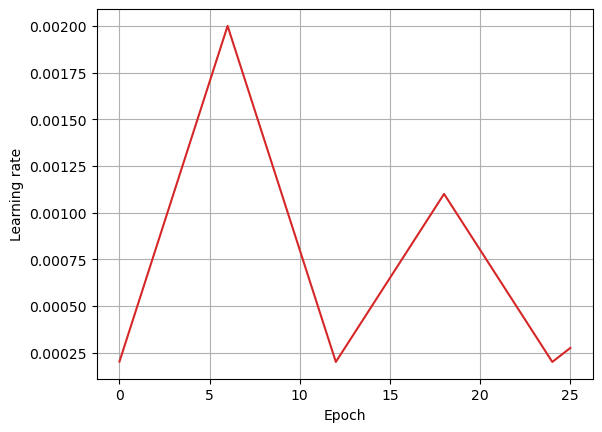

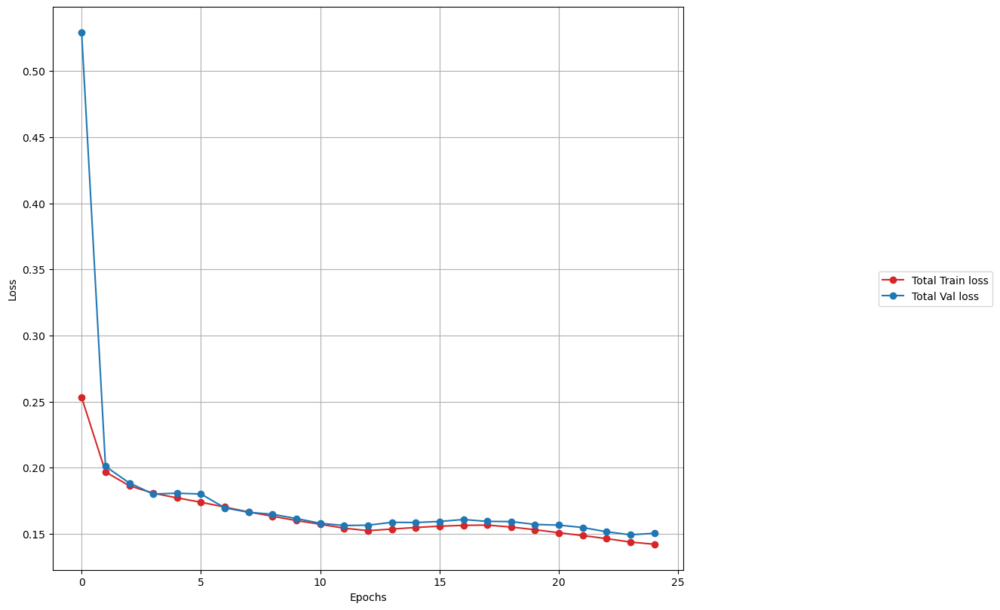

<Figure size 640x480 with 0 Axes>

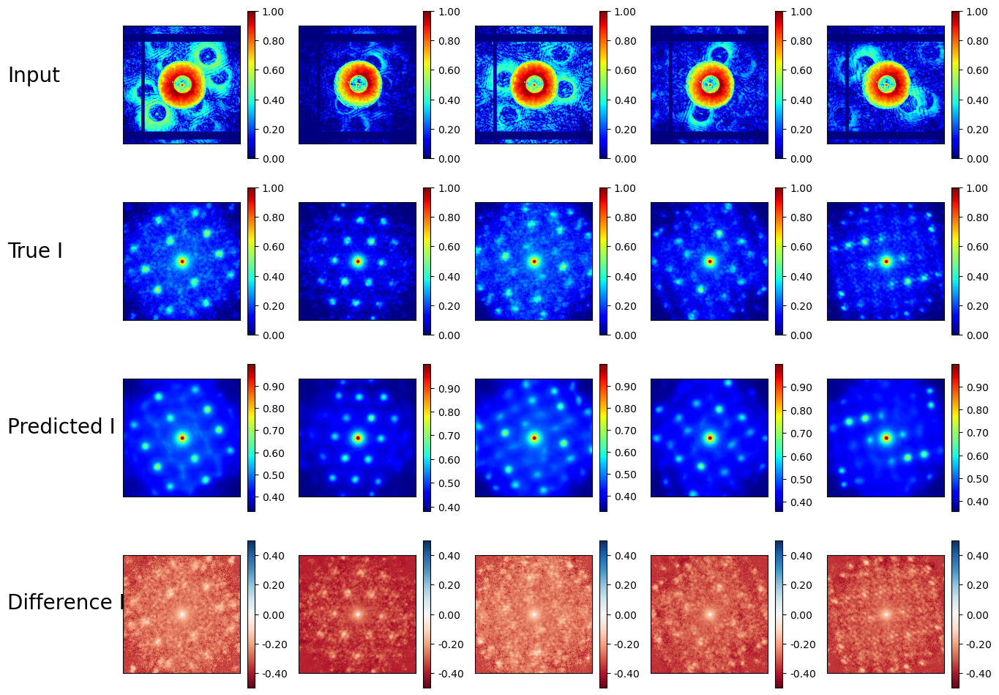

Successfully imported recon_model_no_Unet
batch size: torch.Size([32, 1, 256, 256])
torch.Size([32, 1, 256, 256])
torch.float32
Let's use 2 GPUs!
DataParallel(
  (module): recon_model(
    (encoder1): Sequential(
      (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU()
    )
    (encoder2): Sequential(
      (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU()
    )

188it [00:23,  8.13it/s]


Saving improved model after Val Loss improved from inf to 0.00672
Saving best model for epoch interval 2 at epoch 0
Saving best model for epoch interval 10 at epoch 0
Saving best model for epoch interval 25 at epoch 0
Epoch: 0 | Total  | Train Loss: 0.00695 | Val Loss: 0.00672
Epoch: 0 | Ending LR: 0.000500 


188it [00:23,  8.14it/s]


Saving improved model after Val Loss improved from 0.00672 to 0.00448
Saving best model for epoch interval 2 at epoch 1
Saving best model for epoch interval 10 at epoch 1
Saving best model for epoch interval 25 at epoch 1
Epoch: 1 | Total  | Train Loss: 0.00301 | Val Loss: 0.00448
Epoch: 1 | Ending LR: 0.000800 


188it [00:23,  8.14it/s]


Saving improved model after Val Loss improved from 0.00448 to 0.00338
Updating best model for epoch interval 2 at epoch 2
Updating best model for epoch interval 10 at epoch 2
Updating best model for epoch interval 25 at epoch 2
Epoch: 2 | Total  | Train Loss: 0.00282 | Val Loss: 0.00338
Epoch: 2 | Ending LR: 0.001100 


188it [00:23,  8.08it/s]


Epoch: 3 | Total  | Train Loss: 0.00280 | Val Loss: 0.00421
Epoch: 3 | Ending LR: 0.001400 


188it [00:23,  8.14it/s]


Saving improved model after Val Loss improved from 0.00338 to 0.00306
Updating best model for epoch interval 10 at epoch 4
Updating best model for epoch interval 25 at epoch 4
Epoch: 4 | Total  | Train Loss: 0.00279 | Val Loss: 0.00306
Epoch: 4 | Ending LR: 0.001700 


188it [00:23,  8.14it/s]


Epoch: 5 | Total  | Train Loss: 0.00278 | Val Loss: 0.00356
Epoch: 5 | Ending LR: 0.002000 


188it [00:23,  8.14it/s]


Epoch: 6 | Total  | Train Loss: 0.00276 | Val Loss: 0.00314
Epoch: 6 | Ending LR: 0.001700 


188it [00:23,  8.14it/s]


Epoch: 7 | Total  | Train Loss: 0.00273 | Val Loss: 0.00346
Epoch: 7 | Ending LR: 0.001400 


188it [00:23,  8.14it/s]


Saving improved model after Val Loss improved from 0.00306 to 0.00279
Updating best model for epoch interval 10 at epoch 8
Updating best model for epoch interval 25 at epoch 8
Epoch: 8 | Total  | Train Loss: 0.00265 | Val Loss: 0.00279
Epoch: 8 | Ending LR: 0.001100 


188it [00:23,  8.14it/s]


Saving improved model after Val Loss improved from 0.00279 to 0.00251
Updating best model for epoch interval 10 at epoch 9
Updating best model for epoch interval 25 at epoch 9
Epoch: 9 | Total  | Train Loss: 0.00258 | Val Loss: 0.00251
Epoch: 9 | Ending LR: 0.000800 


188it [00:23,  8.09it/s]


Epoch: 10 | Total  | Train Loss: 0.00251 | Val Loss: 0.00261
Epoch: 10 | Ending LR: 0.000500 


188it [00:23,  8.14it/s]


Saving improved model after Val Loss improved from 0.00251 to 0.00240
Updating best model for epoch interval 25 at epoch 11
Epoch: 11 | Total  | Train Loss: 0.00243 | Val Loss: 0.00240
Epoch: 11 | Ending LR: 0.000200 


188it [00:23,  8.14it/s]


Epoch: 12 | Total  | Train Loss: 0.00238 | Val Loss: 0.00241
Epoch: 12 | Ending LR: 0.000350 


188it [00:23,  8.15it/s]


Epoch: 13 | Total  | Train Loss: 0.00246 | Val Loss: 0.00263
Epoch: 13 | Ending LR: 0.000500 


188it [00:23,  8.15it/s]


Epoch: 14 | Total  | Train Loss: 0.00246 | Val Loss: 0.00267
Epoch: 14 | Ending LR: 0.000650 


188it [00:23,  8.15it/s]


Epoch: 15 | Total  | Train Loss: 0.00251 | Val Loss: 0.00278
Epoch: 15 | Ending LR: 0.000800 


188it [00:23,  8.13it/s]


Epoch: 16 | Total  | Train Loss: 0.00251 | Val Loss: 0.00300
Epoch: 16 | Ending LR: 0.000950 


188it [00:23,  8.10it/s]


Epoch: 17 | Total  | Train Loss: 0.00253 | Val Loss: 0.00296
Epoch: 17 | Ending LR: 0.001100 


188it [00:23,  8.13it/s]


Epoch: 18 | Total  | Train Loss: 0.00254 | Val Loss: 0.00301
Epoch: 18 | Ending LR: 0.000950 


188it [00:23,  8.14it/s]


Epoch: 19 | Total  | Train Loss: 0.00248 | Val Loss: 0.00268
Epoch: 19 | Ending LR: 0.000800 


188it [00:23,  8.14it/s]


Epoch: 20 | Total  | Train Loss: 0.00246 | Val Loss: 0.00245
Epoch: 20 | Ending LR: 0.000650 


188it [00:23,  8.17it/s]


Epoch: 21 | Total  | Train Loss: 0.00241 | Val Loss: 0.00245
Epoch: 21 | Ending LR: 0.000500 


188it [00:23,  8.15it/s]


Saving improved model after Val Loss improved from 0.00240 to 0.00236
Updating best model for epoch interval 25 at epoch 22
Epoch: 22 | Total  | Train Loss: 0.00239 | Val Loss: 0.00236
Epoch: 22 | Ending LR: 0.000350 


188it [00:23,  8.15it/s]


Saving improved model after Val Loss improved from 0.00236 to 0.00233
Updating best model for epoch interval 25 at epoch 23
Epoch: 23 | Total  | Train Loss: 0.00233 | Val Loss: 0.00233
Epoch: 23 | Ending LR: 0.000200 


188it [00:23,  8.11it/s]


Saving improved model after Val Loss improved from 0.00233 to 0.00231
Updating best model for epoch interval 25 at epoch 24
Epoch: 24 | Total  | Train Loss: 0.00230 | Val Loss: 0.00231
Epoch: 24 | Ending LR: 0.000275 


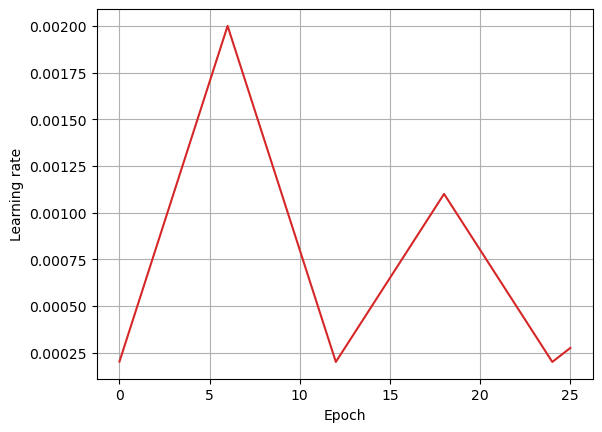

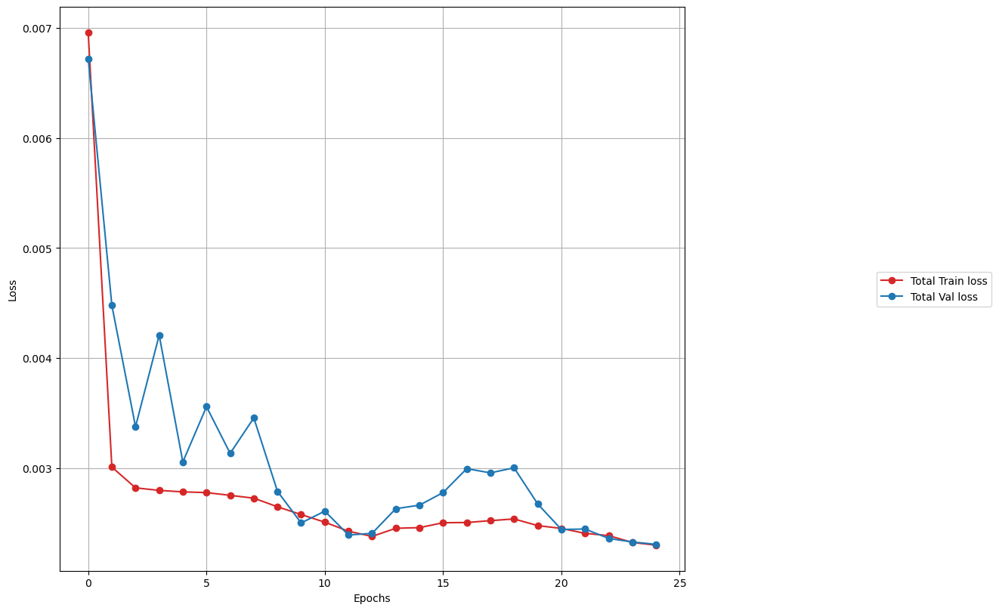

<Figure size 640x480 with 0 Axes>

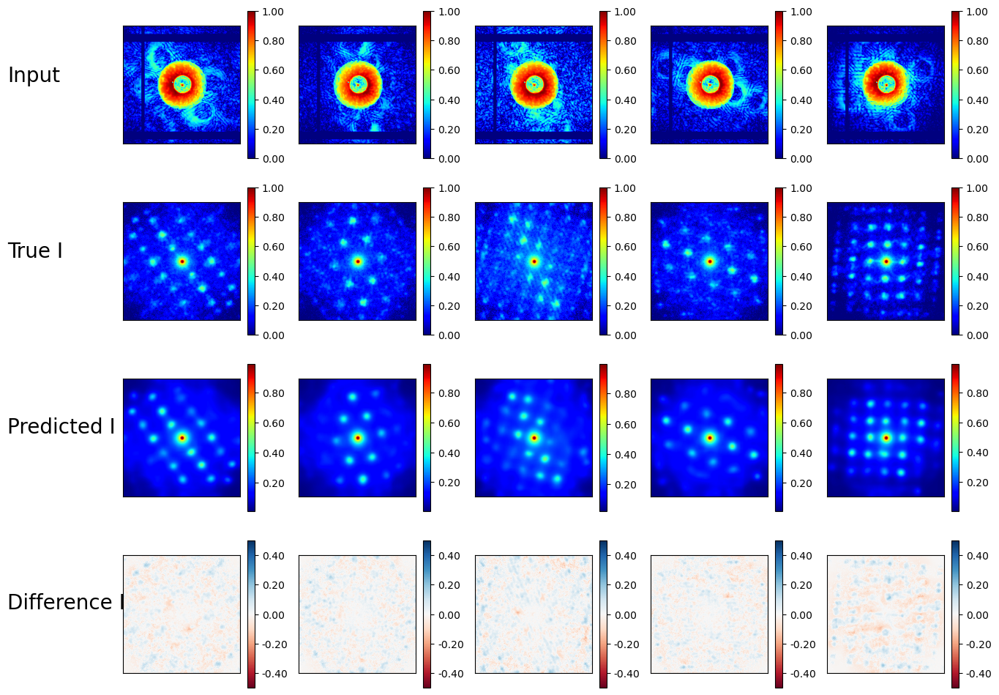

Successfully imported recon_model_no_Unet
batch size: torch.Size([32, 1, 256, 256])
torch.Size([32, 1, 256, 256])
torch.float32
Let's use 2 GPUs!
DataParallel(
  (module): recon_model(
    (encoder1): Sequential(
      (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU()
    )
    (encoder2): Sequential(
      (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU()
    )

188it [00:23,  8.08it/s]


Saving improved model after Val Loss improved from inf to 0.07280
Saving best model for epoch interval 2 at epoch 0
Saving best model for epoch interval 10 at epoch 0
Saving best model for epoch interval 25 at epoch 0
Epoch: 0 | Total  | Train Loss: 0.06818 | Val Loss: 0.07280
Epoch: 0 | Ending LR: 0.000500 


188it [00:23,  8.14it/s]


Saving improved model after Val Loss improved from 0.07280 to 0.04875
Saving best model for epoch interval 2 at epoch 1
Saving best model for epoch interval 10 at epoch 1
Saving best model for epoch interval 25 at epoch 1
Epoch: 1 | Total  | Train Loss: 0.04147 | Val Loss: 0.04875
Epoch: 1 | Ending LR: 0.000800 


188it [00:23,  8.14it/s]


Saving improved model after Val Loss improved from 0.04875 to 0.04377
Updating best model for epoch interval 2 at epoch 2
Updating best model for epoch interval 10 at epoch 2
Updating best model for epoch interval 25 at epoch 2
Epoch: 2 | Total  | Train Loss: 0.04004 | Val Loss: 0.04377
Epoch: 2 | Ending LR: 0.001100 


188it [00:23,  8.14it/s]


Saving improved model after Val Loss improved from 0.04377 to 0.04167
Updating best model for epoch interval 10 at epoch 3
Updating best model for epoch interval 25 at epoch 3
Epoch: 3 | Total  | Train Loss: 0.03942 | Val Loss: 0.04167
Epoch: 3 | Ending LR: 0.001400 


188it [00:23,  8.13it/s]


Saving improved model after Val Loss improved from 0.04167 to 0.03993
Updating best model for epoch interval 10 at epoch 4
Updating best model for epoch interval 25 at epoch 4
Epoch: 4 | Total  | Train Loss: 0.03916 | Val Loss: 0.03993
Epoch: 4 | Ending LR: 0.001700 


188it [00:23,  8.14it/s]


Epoch: 5 | Total  | Train Loss: 0.03919 | Val Loss: 0.04029
Epoch: 5 | Ending LR: 0.002000 


188it [00:23,  8.13it/s]


Saving improved model after Val Loss improved from 0.03993 to 0.03962
Updating best model for epoch interval 10 at epoch 6
Updating best model for epoch interval 25 at epoch 6
Epoch: 6 | Total  | Train Loss: 0.03880 | Val Loss: 0.03962
Epoch: 6 | Ending LR: 0.001700 


188it [00:23,  8.07it/s]


Epoch: 7 | Total  | Train Loss: 0.03820 | Val Loss: 0.04030
Epoch: 7 | Ending LR: 0.001400 


188it [00:23,  8.13it/s]


Saving improved model after Val Loss improved from 0.03962 to 0.03811
Updating best model for epoch interval 10 at epoch 8
Updating best model for epoch interval 25 at epoch 8
Epoch: 8 | Total  | Train Loss: 0.03780 | Val Loss: 0.03811
Epoch: 8 | Ending LR: 0.001100 


188it [00:23,  8.13it/s]


Epoch: 9 | Total  | Train Loss: 0.03729 | Val Loss: 0.04350
Epoch: 9 | Ending LR: 0.000800 


188it [00:23,  8.13it/s]


Saving improved model after Val Loss improved from 0.03811 to 0.03708
Updating best model for epoch interval 10 at epoch 10
Updating best model for epoch interval 25 at epoch 10
Epoch: 10 | Total  | Train Loss: 0.03683 | Val Loss: 0.03708
Epoch: 10 | Ending LR: 0.000500 


188it [00:23,  8.14it/s]


Saving improved model after Val Loss improved from 0.03708 to 0.03633
Updating best model for epoch interval 25 at epoch 11
Epoch: 11 | Total  | Train Loss: 0.03625 | Val Loss: 0.03633
Epoch: 11 | Ending LR: 0.000200 


188it [00:23,  8.13it/s]


Epoch: 12 | Total  | Train Loss: 0.03595 | Val Loss: 0.03693
Epoch: 12 | Ending LR: 0.000350 


188it [00:23,  8.14it/s]


Epoch: 13 | Total  | Train Loss: 0.03617 | Val Loss: 0.03715
Epoch: 13 | Ending LR: 0.000500 


188it [00:23,  8.07it/s]


Epoch: 14 | Total  | Train Loss: 0.03631 | Val Loss: 0.03722
Epoch: 14 | Ending LR: 0.000650 


188it [00:23,  8.14it/s]


Epoch: 15 | Total  | Train Loss: 0.03669 | Val Loss: 0.03860
Epoch: 15 | Ending LR: 0.000800 


188it [00:23,  8.13it/s]


Epoch: 16 | Total  | Train Loss: 0.03677 | Val Loss: 0.03783
Epoch: 16 | Ending LR: 0.000950 


188it [00:23,  8.13it/s]


Epoch: 17 | Total  | Train Loss: 0.03676 | Val Loss: 0.03887
Epoch: 17 | Ending LR: 0.001100 


188it [00:23,  8.13it/s]


Epoch: 18 | Total  | Train Loss: 0.03669 | Val Loss: 0.03774
Epoch: 18 | Ending LR: 0.000950 


188it [00:23,  8.13it/s]


Epoch: 19 | Total  | Train Loss: 0.03649 | Val Loss: 0.03713
Epoch: 19 | Ending LR: 0.000800 


188it [00:23,  8.13it/s]


Epoch: 20 | Total  | Train Loss: 0.03603 | Val Loss: 0.03652
Epoch: 20 | Ending LR: 0.000650 


188it [00:23,  8.14it/s]


Epoch: 21 | Total  | Train Loss: 0.03579 | Val Loss: 0.03674
Epoch: 21 | Ending LR: 0.000500 


188it [00:23,  8.14it/s]


Saving improved model after Val Loss improved from 0.03633 to 0.03588
Updating best model for epoch interval 25 at epoch 22
Epoch: 22 | Total  | Train Loss: 0.03552 | Val Loss: 0.03588
Epoch: 22 | Ending LR: 0.000350 


188it [00:23,  8.14it/s]


Saving improved model after Val Loss improved from 0.03588 to 0.03562
Updating best model for epoch interval 25 at epoch 23
Epoch: 23 | Total  | Train Loss: 0.03522 | Val Loss: 0.03562
Epoch: 23 | Ending LR: 0.000200 


188it [00:23,  8.14it/s]


Epoch: 24 | Total  | Train Loss: 0.03499 | Val Loss: 0.03570
Epoch: 24 | Ending LR: 0.000275 


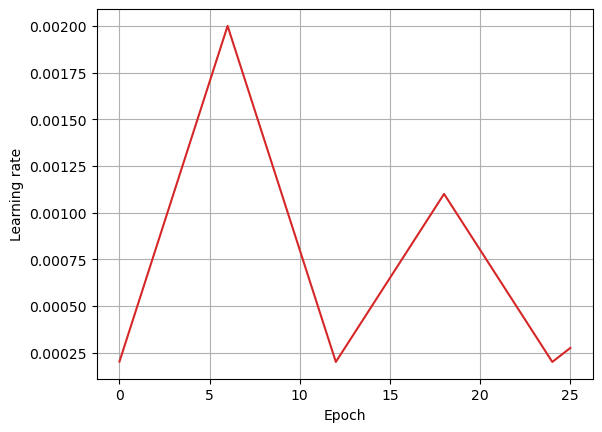

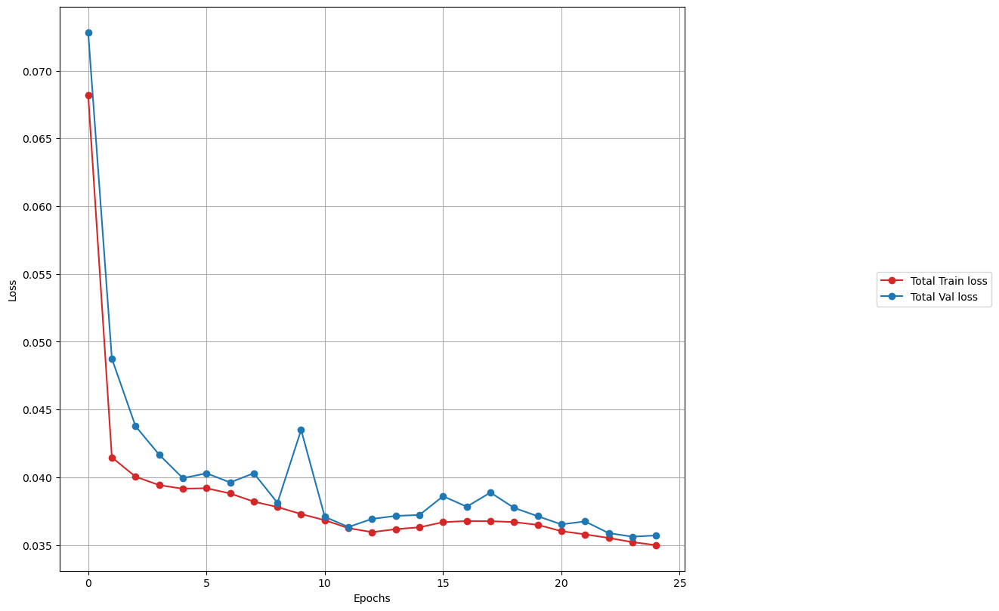

<Figure size 640x480 with 0 Axes>

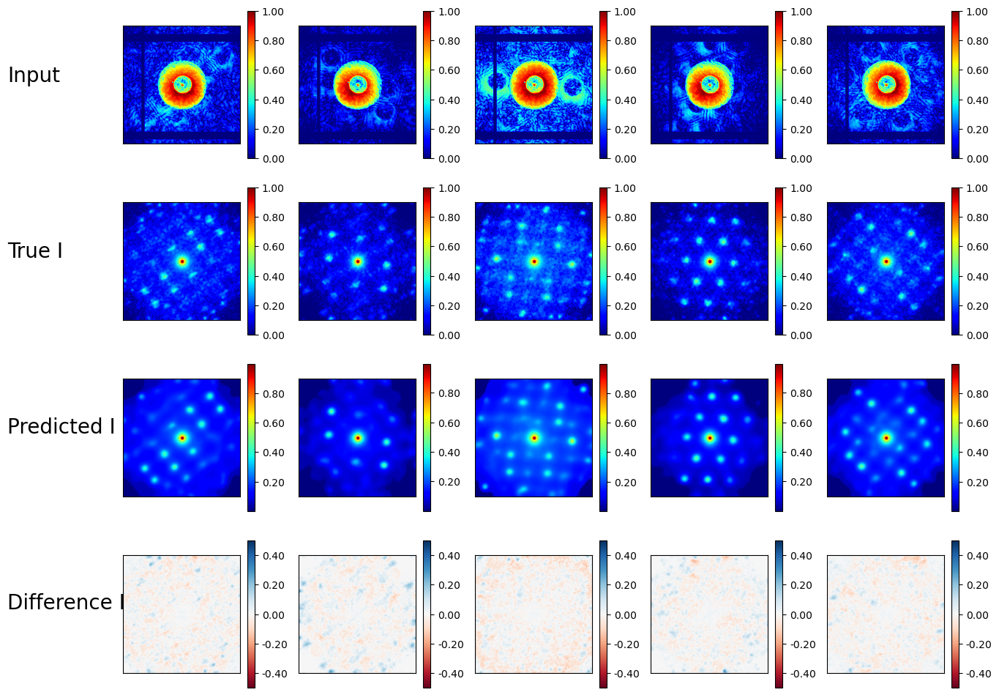

Successfully imported recon_model_Unet
batch size: torch.Size([32, 1, 256, 256])
torch.Size([32, 1, 256, 256])
torch.float32
Let's use 2 GPUs!
DataParallel(
  (module): recon_model(
    (encoder1): Sequential(
      (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU()
    )
    (encoder2): Sequential(
      (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU()
    )
  

188it [00:25,  7.28it/s]


Saving improved model after Val Loss improved from inf to 0.36788
Saving best model for epoch interval 2 at epoch 0
Saving best model for epoch interval 10 at epoch 0
Saving best model for epoch interval 25 at epoch 0
Epoch: 0 | Total  | Train Loss: 0.25744 | Val Loss: 0.36788
Epoch: 0 | Amp | Train Loss: 0.25744 | Val Loss: 0.36788
Epoch: 0 | Symmetry | Train Loss: 0.02062 | Val Loss: 0.01600
Epoch: 0 | Ending LR: 0.000500 


188it [00:25,  7.28it/s]


Saving improved model after Val Loss improved from 0.36788 to 0.19562
Saving best model for epoch interval 2 at epoch 1
Saving best model for epoch interval 10 at epoch 1
Saving best model for epoch interval 25 at epoch 1
Epoch: 1 | Total  | Train Loss: 0.19552 | Val Loss: 0.19562
Epoch: 1 | Amp | Train Loss: 0.19552 | Val Loss: 0.19562
Epoch: 1 | Symmetry | Train Loss: 0.01276 | Val Loss: 0.01212
Epoch: 1 | Ending LR: 0.000800 


188it [00:25,  7.28it/s]


Saving improved model after Val Loss improved from 0.19562 to 0.18951
Updating best model for epoch interval 2 at epoch 2
Updating best model for epoch interval 10 at epoch 2
Updating best model for epoch interval 25 at epoch 2
Epoch: 2 | Total  | Train Loss: 0.18496 | Val Loss: 0.18951
Epoch: 2 | Amp | Train Loss: 0.18496 | Val Loss: 0.18951
Epoch: 2 | Symmetry | Train Loss: 0.01236 | Val Loss: 0.01276
Epoch: 2 | Ending LR: 0.001100 


188it [00:26,  7.23it/s]


Saving improved model after Val Loss improved from 0.18951 to 0.18765
Updating best model for epoch interval 10 at epoch 3
Updating best model for epoch interval 25 at epoch 3
Epoch: 3 | Total  | Train Loss: 0.17939 | Val Loss: 0.18765
Epoch: 3 | Amp | Train Loss: 0.17939 | Val Loss: 0.18765
Epoch: 3 | Symmetry | Train Loss: 0.01246 | Val Loss: 0.01087
Epoch: 3 | Ending LR: 0.001400 


188it [00:25,  7.26it/s]


Saving improved model after Val Loss improved from 0.18765 to 0.17841
Updating best model for epoch interval 10 at epoch 4
Updating best model for epoch interval 25 at epoch 4
Epoch: 4 | Total  | Train Loss: 0.17552 | Val Loss: 0.17841
Epoch: 4 | Amp | Train Loss: 0.17552 | Val Loss: 0.17841
Epoch: 4 | Symmetry | Train Loss: 0.01211 | Val Loss: 0.01077
Epoch: 4 | Ending LR: 0.001700 


188it [00:25,  7.27it/s]


Saving improved model after Val Loss improved from 0.17841 to 0.17656
Updating best model for epoch interval 10 at epoch 5
Updating best model for epoch interval 25 at epoch 5
Epoch: 5 | Total  | Train Loss: 0.17688 | Val Loss: 0.17656
Epoch: 5 | Amp | Train Loss: 0.17688 | Val Loss: 0.17656
Epoch: 5 | Symmetry | Train Loss: 0.01348 | Val Loss: 0.01281
Epoch: 5 | Ending LR: 0.002000 


188it [00:25,  7.29it/s]


Saving improved model after Val Loss improved from 0.17656 to 0.16959
Updating best model for epoch interval 10 at epoch 6
Updating best model for epoch interval 25 at epoch 6
Epoch: 6 | Total  | Train Loss: 0.16962 | Val Loss: 0.16959
Epoch: 6 | Amp | Train Loss: 0.16962 | Val Loss: 0.16959
Epoch: 6 | Symmetry | Train Loss: 0.01204 | Val Loss: 0.01087
Epoch: 6 | Ending LR: 0.001700 


188it [00:25,  7.28it/s]


Saving improved model after Val Loss improved from 0.16959 to 0.16622
Updating best model for epoch interval 10 at epoch 7
Updating best model for epoch interval 25 at epoch 7
Epoch: 7 | Total  | Train Loss: 0.16558 | Val Loss: 0.16622
Epoch: 7 | Amp | Train Loss: 0.16558 | Val Loss: 0.16622
Epoch: 7 | Symmetry | Train Loss: 0.01187 | Val Loss: 0.01240
Epoch: 7 | Ending LR: 0.001400 


188it [00:25,  7.28it/s]


Saving improved model after Val Loss improved from 0.16622 to 0.16225
Updating best model for epoch interval 10 at epoch 8
Updating best model for epoch interval 25 at epoch 8
Epoch: 8 | Total  | Train Loss: 0.16232 | Val Loss: 0.16225
Epoch: 8 | Amp | Train Loss: 0.16232 | Val Loss: 0.16225
Epoch: 8 | Symmetry | Train Loss: 0.01161 | Val Loss: 0.01161
Epoch: 8 | Ending LR: 0.001100 


188it [00:25,  7.27it/s]


Saving improved model after Val Loss improved from 0.16225 to 0.16029
Updating best model for epoch interval 10 at epoch 9
Updating best model for epoch interval 25 at epoch 9
Epoch: 9 | Total  | Train Loss: 0.15933 | Val Loss: 0.16029
Epoch: 9 | Amp | Train Loss: 0.15933 | Val Loss: 0.16029
Epoch: 9 | Symmetry | Train Loss: 0.01147 | Val Loss: 0.01069
Epoch: 9 | Ending LR: 0.000800 


188it [00:25,  7.24it/s]


Saving improved model after Val Loss improved from 0.16029 to 0.15718
Updating best model for epoch interval 10 at epoch 10
Updating best model for epoch interval 25 at epoch 10
Epoch: 10 | Total  | Train Loss: 0.15662 | Val Loss: 0.15718
Epoch: 10 | Amp | Train Loss: 0.15662 | Val Loss: 0.15718
Epoch: 10 | Symmetry | Train Loss: 0.01126 | Val Loss: 0.01125
Epoch: 10 | Ending LR: 0.000500 


188it [00:25,  7.29it/s]


Saving improved model after Val Loss improved from 0.15718 to 0.15502
Updating best model for epoch interval 25 at epoch 11
Epoch: 11 | Total  | Train Loss: 0.15335 | Val Loss: 0.15502
Epoch: 11 | Amp | Train Loss: 0.15335 | Val Loss: 0.15502
Epoch: 11 | Symmetry | Train Loss: 0.01119 | Val Loss: 0.01117
Epoch: 11 | Ending LR: 0.000200 


188it [00:25,  7.26it/s]


Epoch: 12 | Total  | Train Loss: 0.15164 | Val Loss: 0.15608
Epoch: 12 | Amp | Train Loss: 0.15164 | Val Loss: 0.15608
Epoch: 12 | Symmetry | Train Loss: 0.01107 | Val Loss: 0.01155
Epoch: 12 | Ending LR: 0.000350 


188it [00:25,  7.28it/s]


Epoch: 13 | Total  | Train Loss: 0.15253 | Val Loss: 0.15831
Epoch: 13 | Amp | Train Loss: 0.15253 | Val Loss: 0.15831
Epoch: 13 | Symmetry | Train Loss: 0.01126 | Val Loss: 0.01224
Epoch: 13 | Ending LR: 0.000500 


188it [00:25,  7.27it/s]


Epoch: 14 | Total  | Train Loss: 0.15364 | Val Loss: 0.15808
Epoch: 14 | Amp | Train Loss: 0.15364 | Val Loss: 0.15808
Epoch: 14 | Symmetry | Train Loss: 0.01142 | Val Loss: 0.01184
Epoch: 14 | Ending LR: 0.000650 


188it [00:25,  7.28it/s]


Epoch: 15 | Total  | Train Loss: 0.15452 | Val Loss: 0.15893
Epoch: 15 | Amp | Train Loss: 0.15452 | Val Loss: 0.15893
Epoch: 15 | Symmetry | Train Loss: 0.01162 | Val Loss: 0.01191
Epoch: 15 | Ending LR: 0.000800 


188it [00:25,  7.28it/s]


Epoch: 16 | Total  | Train Loss: 0.15533 | Val Loss: 0.15989
Epoch: 16 | Amp | Train Loss: 0.15533 | Val Loss: 0.15989
Epoch: 16 | Symmetry | Train Loss: 0.01166 | Val Loss: 0.01303
Epoch: 16 | Ending LR: 0.000950 


188it [00:25,  7.24it/s]


Epoch: 17 | Total  | Train Loss: 0.15532 | Val Loss: 0.16111
Epoch: 17 | Amp | Train Loss: 0.15532 | Val Loss: 0.16111
Epoch: 17 | Symmetry | Train Loss: 0.01180 | Val Loss: 0.01069
Epoch: 17 | Ending LR: 0.001100 


188it [00:25,  7.27it/s]


Epoch: 18 | Total  | Train Loss: 0.15443 | Val Loss: 0.15816
Epoch: 18 | Amp | Train Loss: 0.15443 | Val Loss: 0.15816
Epoch: 18 | Symmetry | Train Loss: 0.01172 | Val Loss: 0.01211
Epoch: 18 | Ending LR: 0.000950 


188it [00:25,  7.27it/s]


Epoch: 19 | Total  | Train Loss: 0.15198 | Val Loss: 0.15685
Epoch: 19 | Amp | Train Loss: 0.15198 | Val Loss: 0.15685
Epoch: 19 | Symmetry | Train Loss: 0.01163 | Val Loss: 0.01191
Epoch: 19 | Ending LR: 0.000800 


188it [00:25,  7.30it/s]


Saving improved model after Val Loss improved from 0.15502 to 0.15327
Updating best model for epoch interval 25 at epoch 20
Epoch: 20 | Total  | Train Loss: 0.14991 | Val Loss: 0.15327
Epoch: 20 | Amp | Train Loss: 0.14991 | Val Loss: 0.15327
Epoch: 20 | Symmetry | Train Loss: 0.01162 | Val Loss: 0.01238
Epoch: 20 | Ending LR: 0.000650 


188it [00:25,  7.29it/s]


Saving improved model after Val Loss improved from 0.15327 to 0.15156
Updating best model for epoch interval 25 at epoch 21
Epoch: 21 | Total  | Train Loss: 0.14754 | Val Loss: 0.15156
Epoch: 21 | Amp | Train Loss: 0.14754 | Val Loss: 0.15156
Epoch: 21 | Symmetry | Train Loss: 0.01145 | Val Loss: 0.01115
Epoch: 21 | Ending LR: 0.000500 


188it [00:25,  7.28it/s]


Saving improved model after Val Loss improved from 0.15156 to 0.15027
Updating best model for epoch interval 25 at epoch 22
Epoch: 22 | Total  | Train Loss: 0.14507 | Val Loss: 0.15027
Epoch: 22 | Amp | Train Loss: 0.14507 | Val Loss: 0.15027
Epoch: 22 | Symmetry | Train Loss: 0.01126 | Val Loss: 0.01129
Epoch: 22 | Ending LR: 0.000350 


188it [00:25,  7.29it/s]


Saving improved model after Val Loss improved from 0.15027 to 0.14863
Updating best model for epoch interval 25 at epoch 23
Epoch: 23 | Total  | Train Loss: 0.14243 | Val Loss: 0.14863
Epoch: 23 | Amp | Train Loss: 0.14243 | Val Loss: 0.14863
Epoch: 23 | Symmetry | Train Loss: 0.01114 | Val Loss: 0.01114
Epoch: 23 | Ending LR: 0.000200 


188it [00:25,  7.25it/s]


Epoch: 24 | Total  | Train Loss: 0.14068 | Val Loss: 0.14942
Epoch: 24 | Amp | Train Loss: 0.14068 | Val Loss: 0.14942
Epoch: 24 | Symmetry | Train Loss: 0.01110 | Val Loss: 0.01112
Epoch: 24 | Ending LR: 0.000275 


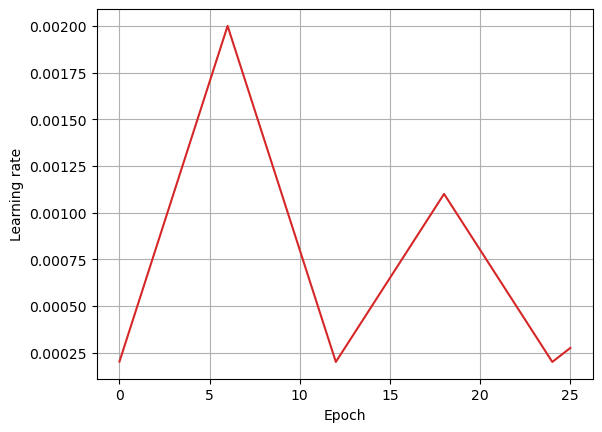

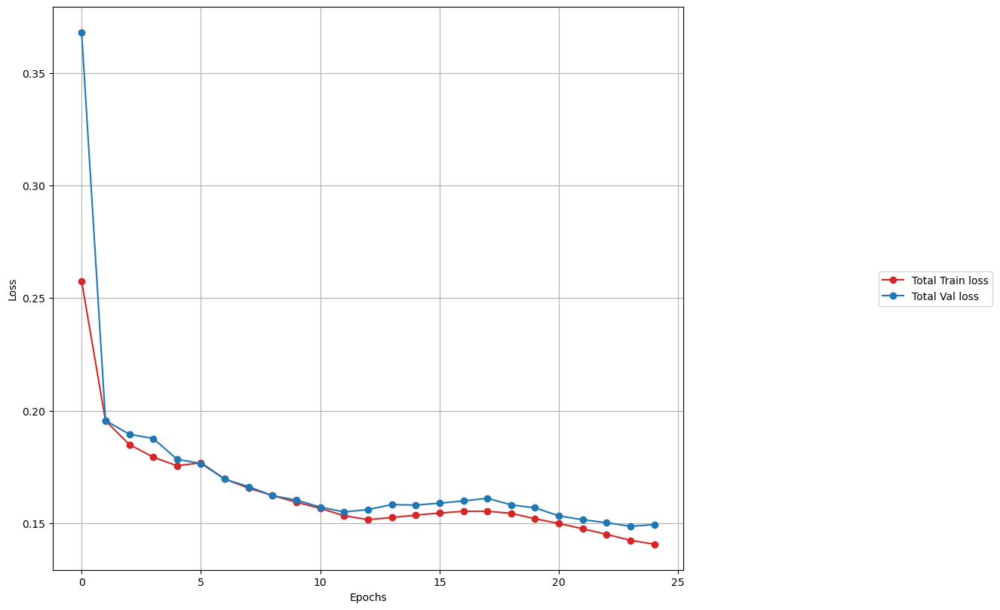

<Figure size 640x480 with 0 Axes>

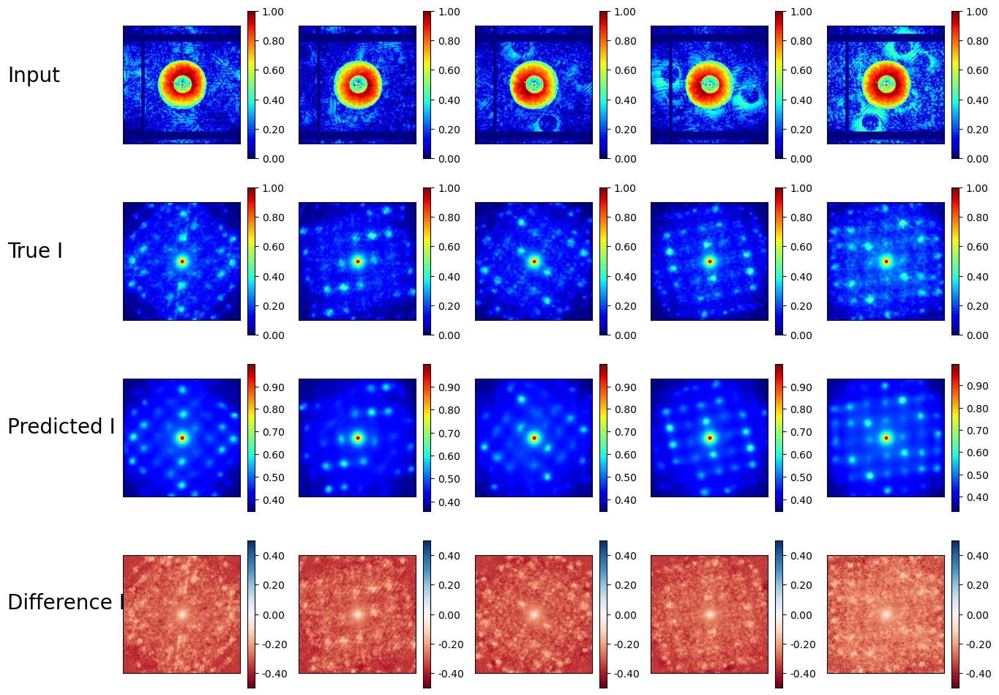

Successfully imported recon_model_Unet
batch size: torch.Size([32, 1, 256, 256])
torch.Size([32, 1, 256, 256])
torch.float32
Let's use 2 GPUs!
DataParallel(
  (module): recon_model(
    (encoder1): Sequential(
      (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU()
    )
    (encoder2): Sequential(
      (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU()
    )
  

188it [00:25,  7.39it/s]


Saving improved model after Val Loss improved from inf to 0.00806
Saving best model for epoch interval 2 at epoch 0
Saving best model for epoch interval 10 at epoch 0
Saving best model for epoch interval 25 at epoch 0
Epoch: 0 | Total  | Train Loss: 0.01169 | Val Loss: 0.00806
Epoch: 0 | Ending LR: 0.000500 


188it [00:25,  7.44it/s]


Saving improved model after Val Loss improved from 0.00806 to 0.00604
Saving best model for epoch interval 2 at epoch 1
Saving best model for epoch interval 10 at epoch 1
Saving best model for epoch interval 25 at epoch 1
Epoch: 1 | Total  | Train Loss: 0.00326 | Val Loss: 0.00604
Epoch: 1 | Ending LR: 0.000800 


188it [00:25,  7.44it/s]


Saving improved model after Val Loss improved from 0.00604 to 0.00449
Updating best model for epoch interval 2 at epoch 2
Updating best model for epoch interval 10 at epoch 2
Updating best model for epoch interval 25 at epoch 2
Epoch: 2 | Total  | Train Loss: 0.00287 | Val Loss: 0.00449
Epoch: 2 | Ending LR: 0.001100 


188it [00:25,  7.43it/s]


Epoch: 3 | Total  | Train Loss: 0.00278 | Val Loss: 0.00465
Epoch: 3 | Ending LR: 0.001400 


188it [00:25,  7.44it/s]


Saving improved model after Val Loss improved from 0.00449 to 0.00297
Updating best model for epoch interval 10 at epoch 4
Updating best model for epoch interval 25 at epoch 4
Epoch: 4 | Total  | Train Loss: 0.00273 | Val Loss: 0.00297
Epoch: 4 | Ending LR: 0.001700 


188it [00:25,  7.43it/s]


Epoch: 5 | Total  | Train Loss: 0.00275 | Val Loss: 0.00311
Epoch: 5 | Ending LR: 0.002000 


188it [00:25,  7.42it/s]


Saving improved model after Val Loss improved from 0.00297 to 0.00290
Updating best model for epoch interval 10 at epoch 6
Updating best model for epoch interval 25 at epoch 6
Epoch: 6 | Total  | Train Loss: 0.00270 | Val Loss: 0.00290
Epoch: 6 | Ending LR: 0.001700 


188it [00:25,  7.39it/s]


Saving improved model after Val Loss improved from 0.00290 to 0.00266
Updating best model for epoch interval 10 at epoch 7
Updating best model for epoch interval 25 at epoch 7
Epoch: 7 | Total  | Train Loss: 0.00266 | Val Loss: 0.00266
Epoch: 7 | Ending LR: 0.001400 


188it [00:25,  7.43it/s]


Saving improved model after Val Loss improved from 0.00266 to 0.00264
Updating best model for epoch interval 10 at epoch 8
Updating best model for epoch interval 25 at epoch 8
Epoch: 8 | Total  | Train Loss: 0.00258 | Val Loss: 0.00264
Epoch: 8 | Ending LR: 0.001100 


188it [00:25,  7.43it/s]


Saving improved model after Val Loss improved from 0.00264 to 0.00257
Updating best model for epoch interval 10 at epoch 9
Updating best model for epoch interval 25 at epoch 9
Epoch: 9 | Total  | Train Loss: 0.00253 | Val Loss: 0.00257
Epoch: 9 | Ending LR: 0.000800 


188it [00:25,  7.44it/s]


Saving improved model after Val Loss improved from 0.00257 to 0.00253
Updating best model for epoch interval 10 at epoch 10
Updating best model for epoch interval 25 at epoch 10
Epoch: 10 | Total  | Train Loss: 0.00246 | Val Loss: 0.00253
Epoch: 10 | Ending LR: 0.000500 


188it [00:25,  7.44it/s]


Saving improved model after Val Loss improved from 0.00253 to 0.00233
Updating best model for epoch interval 25 at epoch 11
Epoch: 11 | Total  | Train Loss: 0.00238 | Val Loss: 0.00233
Epoch: 11 | Ending LR: 0.000200 


188it [00:25,  7.46it/s]


Epoch: 12 | Total  | Train Loss: 0.00234 | Val Loss: 0.00239
Epoch: 12 | Ending LR: 0.000350 


188it [00:25,  7.44it/s]


Epoch: 13 | Total  | Train Loss: 0.00239 | Val Loss: 0.00244
Epoch: 13 | Ending LR: 0.000500 


188it [00:25,  7.39it/s]


Epoch: 14 | Total  | Train Loss: 0.00244 | Val Loss: 0.00257
Epoch: 14 | Ending LR: 0.000650 


188it [00:25,  7.45it/s]


Epoch: 15 | Total  | Train Loss: 0.00245 | Val Loss: 0.00271
Epoch: 15 | Ending LR: 0.000800 


188it [00:25,  7.45it/s]


Epoch: 16 | Total  | Train Loss: 0.00247 | Val Loss: 0.00252
Epoch: 16 | Ending LR: 0.000950 


188it [00:25,  7.45it/s]


Epoch: 17 | Total  | Train Loss: 0.00248 | Val Loss: 0.00254
Epoch: 17 | Ending LR: 0.001100 


188it [00:25,  7.46it/s]


Epoch: 18 | Total  | Train Loss: 0.00257 | Val Loss: 0.00279
Epoch: 18 | Ending LR: 0.000950 


188it [00:25,  7.46it/s]


Epoch: 19 | Total  | Train Loss: 0.00246 | Val Loss: 0.00251
Epoch: 19 | Ending LR: 0.000800 


188it [00:25,  7.46it/s]


Epoch: 20 | Total  | Train Loss: 0.00242 | Val Loss: 0.00242
Epoch: 20 | Ending LR: 0.000650 


188it [00:25,  7.42it/s]


Epoch: 21 | Total  | Train Loss: 0.00238 | Val Loss: 0.00248
Epoch: 21 | Ending LR: 0.000500 


188it [00:25,  7.46it/s]


Epoch: 22 | Total  | Train Loss: 0.00235 | Val Loss: 0.00236
Epoch: 22 | Ending LR: 0.000350 


188it [00:25,  7.46it/s]


Saving improved model after Val Loss improved from 0.00233 to 0.00229
Updating best model for epoch interval 25 at epoch 23
Epoch: 23 | Total  | Train Loss: 0.00230 | Val Loss: 0.00229
Epoch: 23 | Ending LR: 0.000200 


188it [00:25,  7.47it/s]


Epoch: 24 | Total  | Train Loss: 0.00228 | Val Loss: 0.00232
Epoch: 24 | Ending LR: 0.000275 


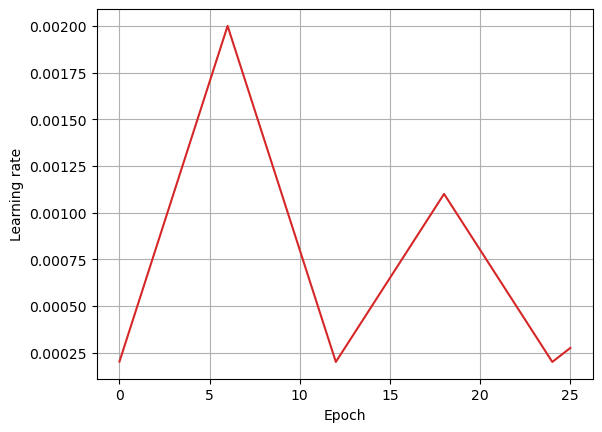

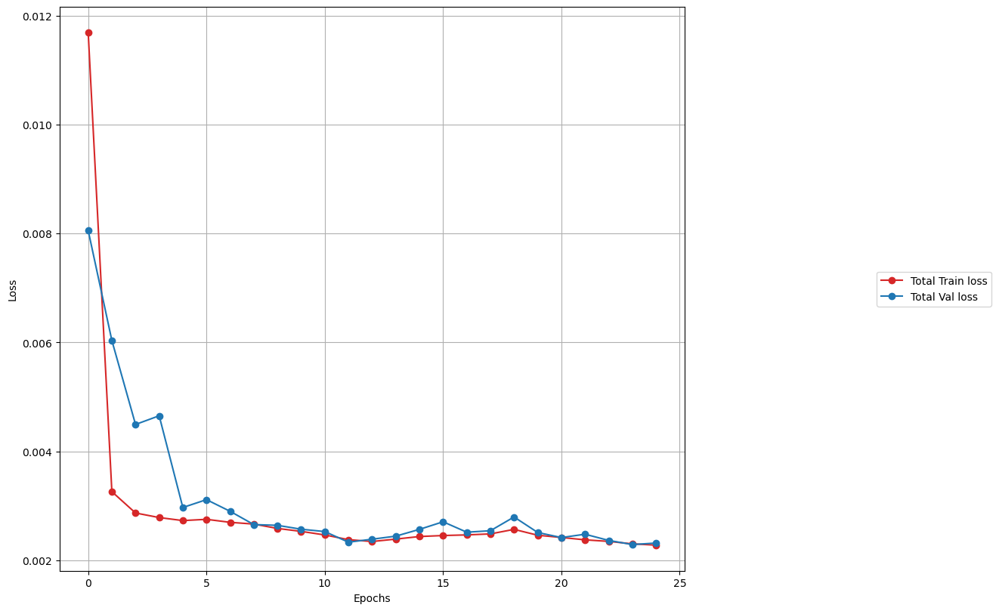

<Figure size 640x480 with 0 Axes>

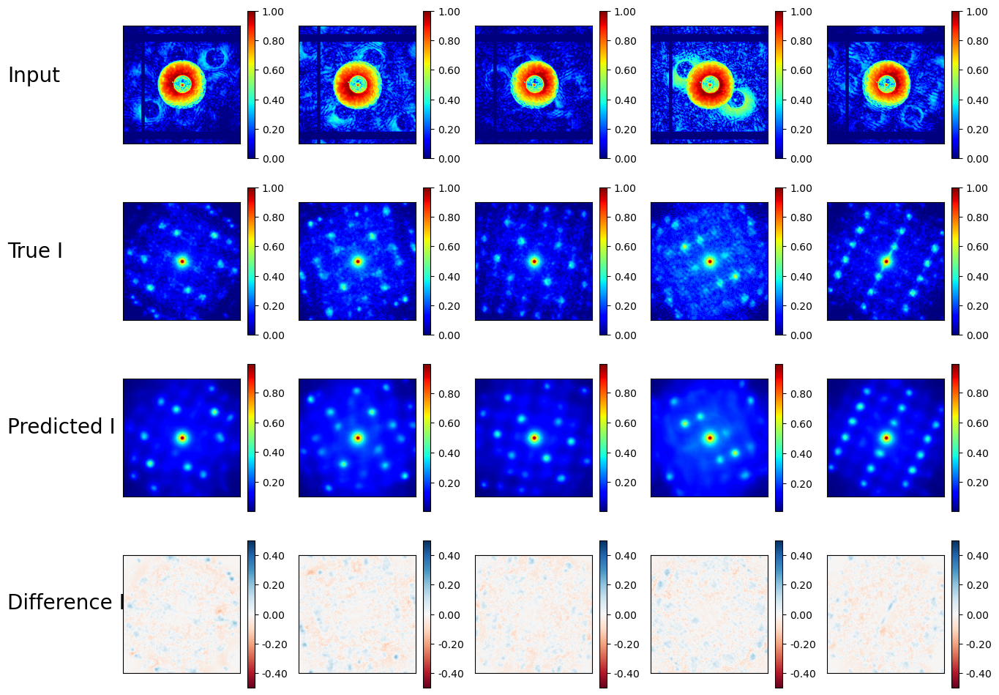

Successfully imported recon_model_Unet
batch size: torch.Size([32, 1, 256, 256])
torch.Size([32, 1, 256, 256])
torch.float32
Let's use 2 GPUs!
DataParallel(
  (module): recon_model(
    (encoder1): Sequential(
      (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU()
    )
    (encoder2): Sequential(
      (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU()
    )
  

188it [00:25,  7.43it/s]


Saving improved model after Val Loss improved from inf to 0.05301
Saving best model for epoch interval 2 at epoch 0
Saving best model for epoch interval 10 at epoch 0
Saving best model for epoch interval 25 at epoch 0
Epoch: 0 | Total  | Train Loss: 0.05391 | Val Loss: 0.05301
Epoch: 0 | Ending LR: 0.000500 


188it [00:25,  7.47it/s]


Saving improved model after Val Loss improved from 0.05301 to 0.04167
Saving best model for epoch interval 2 at epoch 1
Saving best model for epoch interval 10 at epoch 1
Saving best model for epoch interval 25 at epoch 1
Epoch: 1 | Total  | Train Loss: 0.04072 | Val Loss: 0.04167
Epoch: 1 | Ending LR: 0.000800 


188it [00:25,  7.42it/s]


Epoch: 2 | Total  | Train Loss: 0.03965 | Val Loss: 0.04198
Epoch: 2 | Ending LR: 0.001100 


188it [00:25,  7.43it/s]


Saving improved model after Val Loss improved from 0.04167 to 0.04101
Updating best model for epoch interval 10 at epoch 3
Updating best model for epoch interval 25 at epoch 3
Epoch: 3 | Total  | Train Loss: 0.03898 | Val Loss: 0.04101
Epoch: 3 | Ending LR: 0.001400 


188it [00:25,  7.39it/s]


Epoch: 4 | Total  | Train Loss: 0.03880 | Val Loss: 0.04184
Epoch: 4 | Ending LR: 0.001700 


188it [00:25,  7.43it/s]


Saving improved model after Val Loss improved from 0.04101 to 0.03929
Updating best model for epoch interval 10 at epoch 5
Updating best model for epoch interval 25 at epoch 5
Epoch: 5 | Total  | Train Loss: 0.03874 | Val Loss: 0.03929
Epoch: 5 | Ending LR: 0.002000 


188it [00:25,  7.42it/s]


Epoch: 6 | Total  | Train Loss: 0.03843 | Val Loss: 0.03944
Epoch: 6 | Ending LR: 0.001700 


188it [00:25,  7.42it/s]


Saving improved model after Val Loss improved from 0.03929 to 0.03840
Updating best model for epoch interval 10 at epoch 7
Updating best model for epoch interval 25 at epoch 7
Epoch: 7 | Total  | Train Loss: 0.03781 | Val Loss: 0.03840
Epoch: 7 | Ending LR: 0.001400 


188it [00:25,  7.43it/s]


Epoch: 8 | Total  | Train Loss: 0.03745 | Val Loss: 0.03890
Epoch: 8 | Ending LR: 0.001100 


188it [00:25,  7.42it/s]


Saving improved model after Val Loss improved from 0.03840 to 0.03776
Updating best model for epoch interval 10 at epoch 9
Updating best model for epoch interval 25 at epoch 9
Epoch: 9 | Total  | Train Loss: 0.03700 | Val Loss: 0.03776
Epoch: 9 | Ending LR: 0.000800 


188it [00:25,  7.44it/s]


Saving improved model after Val Loss improved from 0.03776 to 0.03660
Updating best model for epoch interval 10 at epoch 10
Updating best model for epoch interval 25 at epoch 10
Epoch: 10 | Total  | Train Loss: 0.03657 | Val Loss: 0.03660
Epoch: 10 | Ending LR: 0.000500 


188it [00:25,  7.38it/s]


Saving improved model after Val Loss improved from 0.03660 to 0.03623
Updating best model for epoch interval 25 at epoch 11
Epoch: 11 | Total  | Train Loss: 0.03606 | Val Loss: 0.03623
Epoch: 11 | Ending LR: 0.000200 


188it [00:25,  7.43it/s]


Epoch: 12 | Total  | Train Loss: 0.03579 | Val Loss: 0.03664
Epoch: 12 | Ending LR: 0.000350 


188it [00:25,  7.43it/s]


Epoch: 13 | Total  | Train Loss: 0.03597 | Val Loss: 0.03670
Epoch: 13 | Ending LR: 0.000500 


188it [00:25,  7.43it/s]


Epoch: 14 | Total  | Train Loss: 0.03614 | Val Loss: 0.03678
Epoch: 14 | Ending LR: 0.000650 


188it [00:25,  7.44it/s]


Epoch: 15 | Total  | Train Loss: 0.03647 | Val Loss: 0.03785
Epoch: 15 | Ending LR: 0.000800 


188it [00:25,  7.44it/s]


Epoch: 16 | Total  | Train Loss: 0.03650 | Val Loss: 0.03739
Epoch: 16 | Ending LR: 0.000950 


188it [00:25,  7.45it/s]


Epoch: 17 | Total  | Train Loss: 0.03644 | Val Loss: 0.03860
Epoch: 17 | Ending LR: 0.001100 


188it [00:25,  7.40it/s]


Epoch: 18 | Total  | Train Loss: 0.03643 | Val Loss: 0.03701
Epoch: 18 | Ending LR: 0.000950 


188it [00:25,  7.46it/s]


Epoch: 19 | Total  | Train Loss: 0.03613 | Val Loss: 0.03656
Epoch: 19 | Ending LR: 0.000800 


188it [00:25,  7.46it/s]


Saving improved model after Val Loss improved from 0.03623 to 0.03616
Updating best model for epoch interval 25 at epoch 20
Epoch: 20 | Total  | Train Loss: 0.03588 | Val Loss: 0.03616
Epoch: 20 | Ending LR: 0.000650 


188it [00:25,  7.46it/s]


Saving improved model after Val Loss improved from 0.03616 to 0.03612
Updating best model for epoch interval 25 at epoch 21
Epoch: 21 | Total  | Train Loss: 0.03570 | Val Loss: 0.03612
Epoch: 21 | Ending LR: 0.000500 


188it [00:25,  7.47it/s]


Saving improved model after Val Loss improved from 0.03612 to 0.03563
Updating best model for epoch interval 25 at epoch 22
Epoch: 22 | Total  | Train Loss: 0.03536 | Val Loss: 0.03563
Epoch: 22 | Ending LR: 0.000350 


188it [00:25,  7.47it/s]


Saving improved model after Val Loss improved from 0.03563 to 0.03530
Updating best model for epoch interval 25 at epoch 23
Epoch: 23 | Total  | Train Loss: 0.03505 | Val Loss: 0.03530
Epoch: 23 | Ending LR: 0.000200 


188it [00:25,  7.45it/s]


Epoch: 24 | Total  | Train Loss: 0.03489 | Val Loss: 0.03574
Epoch: 24 | Ending LR: 0.000275 


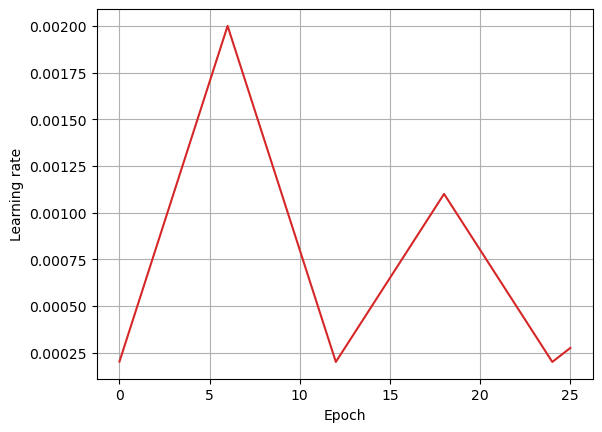

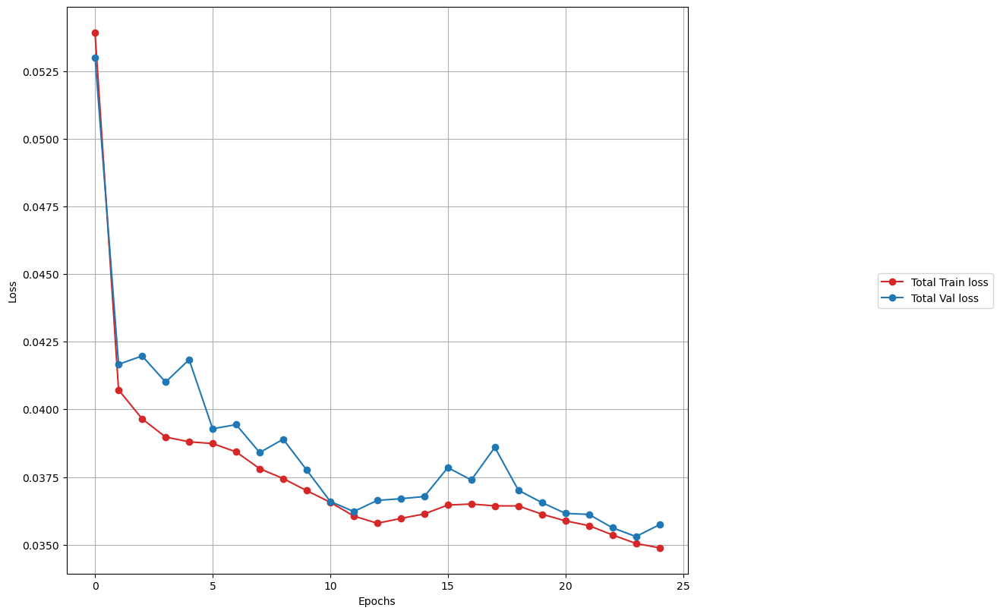

<Figure size 640x480 with 0 Axes>

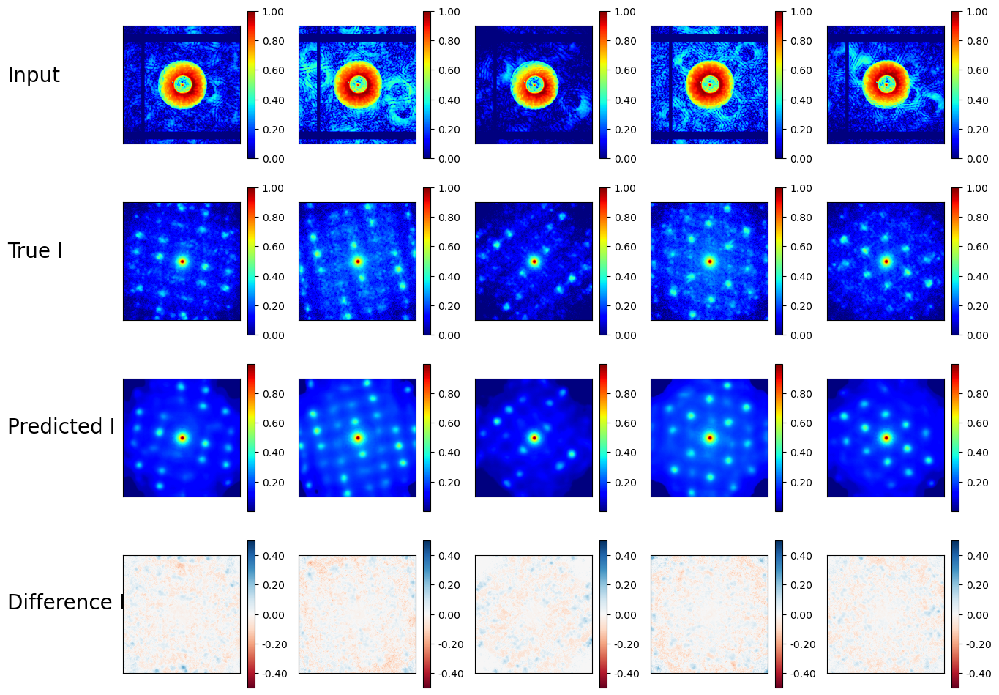

LatticeClathII_Probe128x128_ZCB_9_3D__noNoise_sim_ZCB_9_3D_S5065_N600_steps4_dp256
Loading data from: /net/micdata/data2/12IDC/ptychosaxs/batch_mode/preprocessed/preprocessed_sim_LatticeClathII_Probe128x128_ZCB_9_3D__noNoise_sim_ZCB_9_3D_S5065_N600_steps4_dp256.npz
7200 2400 1200
256 256
torch.Size([7200, 1, 256, 256]) torch.Size([7200, 1, 256, 256]) torch.Size([7200, 1, 256, 256])
6000 2 1200 2400
Successfully imported recon_model_no_Unet
batch size: torch.Size([32, 1, 256, 256])
torch.Size([32, 1, 256, 256])
torch.float32
Let's use 2 GPUs!
DataParallel(
  (module): recon_model(
    (encoder1): Sequential(
      (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU()
    )
    (enc

188it [00:23,  8.01it/s]


Saving improved model after Val Loss improved from inf to 0.21703
Saving best model for epoch interval 2 at epoch 0
Saving best model for epoch interval 10 at epoch 0
Saving best model for epoch interval 25 at epoch 0
Epoch: 0 | Total  | Train Loss: 0.19708 | Val Loss: 0.21703
Epoch: 0 | Amp | Train Loss: 0.19708 | Val Loss: 0.21703
Epoch: 0 | Symmetry | Train Loss: 0.01723 | Val Loss: 0.01931
Epoch: 0 | Ending LR: 0.000500 


188it [00:23,  7.92it/s]


Saving improved model after Val Loss improved from 0.21703 to 0.15903
Saving best model for epoch interval 2 at epoch 1
Saving best model for epoch interval 10 at epoch 1
Saving best model for epoch interval 25 at epoch 1
Epoch: 1 | Total  | Train Loss: 0.13258 | Val Loss: 0.15903
Epoch: 1 | Amp | Train Loss: 0.13258 | Val Loss: 0.15903
Epoch: 1 | Symmetry | Train Loss: 0.01169 | Val Loss: 0.00935
Epoch: 1 | Ending LR: 0.000800 


188it [00:23,  8.01it/s]


Saving improved model after Val Loss improved from 0.15903 to 0.12491
Updating best model for epoch interval 2 at epoch 2
Updating best model for epoch interval 10 at epoch 2
Updating best model for epoch interval 25 at epoch 2
Epoch: 2 | Total  | Train Loss: 0.12087 | Val Loss: 0.12491
Epoch: 2 | Amp | Train Loss: 0.12087 | Val Loss: 0.12491
Epoch: 2 | Symmetry | Train Loss: 0.01153 | Val Loss: 0.00975
Epoch: 2 | Ending LR: 0.001100 


188it [00:23,  7.96it/s]


Saving improved model after Val Loss improved from 0.12491 to 0.11831
Updating best model for epoch interval 10 at epoch 3
Updating best model for epoch interval 25 at epoch 3
Epoch: 3 | Total  | Train Loss: 0.11503 | Val Loss: 0.11831
Epoch: 3 | Amp | Train Loss: 0.11503 | Val Loss: 0.11831
Epoch: 3 | Symmetry | Train Loss: 0.01157 | Val Loss: 0.00998
Epoch: 3 | Ending LR: 0.001400 


188it [00:23,  7.95it/s]


Saving improved model after Val Loss improved from 0.11831 to 0.11503
Updating best model for epoch interval 10 at epoch 4
Updating best model for epoch interval 25 at epoch 4
Epoch: 4 | Total  | Train Loss: 0.11064 | Val Loss: 0.11503
Epoch: 4 | Amp | Train Loss: 0.11064 | Val Loss: 0.11503
Epoch: 4 | Symmetry | Train Loss: 0.01156 | Val Loss: 0.01158
Epoch: 4 | Ending LR: 0.001700 


188it [00:23,  7.94it/s]


Epoch: 5 | Total  | Train Loss: 0.10738 | Val Loss: 0.11692
Epoch: 5 | Amp | Train Loss: 0.10738 | Val Loss: 0.11692
Epoch: 5 | Symmetry | Train Loss: 0.01152 | Val Loss: 0.01253
Epoch: 5 | Ending LR: 0.002000 


188it [00:23,  7.96it/s]


Saving improved model after Val Loss improved from 0.11503 to 0.10232
Updating best model for epoch interval 10 at epoch 6
Updating best model for epoch interval 25 at epoch 6
Epoch: 6 | Total  | Train Loss: 0.10410 | Val Loss: 0.10232
Epoch: 6 | Amp | Train Loss: 0.10410 | Val Loss: 0.10232
Epoch: 6 | Symmetry | Train Loss: 0.01177 | Val Loss: 0.01041
Epoch: 6 | Ending LR: 0.001700 


188it [00:23,  7.94it/s]


Saving improved model after Val Loss improved from 0.10232 to 0.10045
Updating best model for epoch interval 10 at epoch 7
Updating best model for epoch interval 25 at epoch 7
Epoch: 7 | Total  | Train Loss: 0.09986 | Val Loss: 0.10045
Epoch: 7 | Amp | Train Loss: 0.09986 | Val Loss: 0.10045
Epoch: 7 | Symmetry | Train Loss: 0.01147 | Val Loss: 0.00979
Epoch: 7 | Ending LR: 0.001400 


188it [00:23,  7.91it/s]


Saving improved model after Val Loss improved from 0.10045 to 0.09698
Updating best model for epoch interval 10 at epoch 8
Updating best model for epoch interval 25 at epoch 8
Epoch: 8 | Total  | Train Loss: 0.09689 | Val Loss: 0.09698
Epoch: 8 | Amp | Train Loss: 0.09689 | Val Loss: 0.09698
Epoch: 8 | Symmetry | Train Loss: 0.01146 | Val Loss: 0.01028
Epoch: 8 | Ending LR: 0.001100 


188it [00:23,  7.95it/s]


Saving improved model after Val Loss improved from 0.09698 to 0.09482
Updating best model for epoch interval 10 at epoch 9
Updating best model for epoch interval 25 at epoch 9
Epoch: 9 | Total  | Train Loss: 0.09413 | Val Loss: 0.09482
Epoch: 9 | Amp | Train Loss: 0.09413 | Val Loss: 0.09482
Epoch: 9 | Symmetry | Train Loss: 0.01135 | Val Loss: 0.01171
Epoch: 9 | Ending LR: 0.000800 


188it [00:23,  7.95it/s]


Saving improved model after Val Loss improved from 0.09482 to 0.09237
Updating best model for epoch interval 10 at epoch 10
Updating best model for epoch interval 25 at epoch 10
Epoch: 10 | Total  | Train Loss: 0.09155 | Val Loss: 0.09237
Epoch: 10 | Amp | Train Loss: 0.09155 | Val Loss: 0.09237
Epoch: 10 | Symmetry | Train Loss: 0.01126 | Val Loss: 0.01029
Epoch: 10 | Ending LR: 0.000500 


188it [00:23,  7.94it/s]


Saving improved model after Val Loss improved from 0.09237 to 0.08891
Updating best model for epoch interval 25 at epoch 11
Epoch: 11 | Total  | Train Loss: 0.08844 | Val Loss: 0.08891
Epoch: 11 | Amp | Train Loss: 0.08844 | Val Loss: 0.08891
Epoch: 11 | Symmetry | Train Loss: 0.01111 | Val Loss: 0.01015
Epoch: 11 | Ending LR: 0.000200 


188it [00:23,  7.96it/s]


Epoch: 12 | Total  | Train Loss: 0.08695 | Val Loss: 0.09078
Epoch: 12 | Amp | Train Loss: 0.08695 | Val Loss: 0.09078
Epoch: 12 | Symmetry | Train Loss: 0.01108 | Val Loss: 0.00926
Epoch: 12 | Ending LR: 0.000350 


188it [00:23,  7.93it/s]


Epoch: 13 | Total  | Train Loss: 0.08790 | Val Loss: 0.09056
Epoch: 13 | Amp | Train Loss: 0.08790 | Val Loss: 0.09056
Epoch: 13 | Symmetry | Train Loss: 0.01125 | Val Loss: 0.01057
Epoch: 13 | Ending LR: 0.000500 


188it [00:23,  7.93it/s]


Epoch: 14 | Total  | Train Loss: 0.08885 | Val Loss: 0.09135
Epoch: 14 | Amp | Train Loss: 0.08885 | Val Loss: 0.09135
Epoch: 14 | Symmetry | Train Loss: 0.01140 | Val Loss: 0.01047
Epoch: 14 | Ending LR: 0.000650 


188it [00:23,  7.88it/s]


Epoch: 15 | Total  | Train Loss: 0.08944 | Val Loss: 0.09271
Epoch: 15 | Amp | Train Loss: 0.08944 | Val Loss: 0.09271
Epoch: 15 | Symmetry | Train Loss: 0.01154 | Val Loss: 0.01290
Epoch: 15 | Ending LR: 0.000800 


188it [00:23,  7.94it/s]


Epoch: 16 | Total  | Train Loss: 0.08983 | Val Loss: 0.09526
Epoch: 16 | Amp | Train Loss: 0.08983 | Val Loss: 0.09526
Epoch: 16 | Symmetry | Train Loss: 0.01179 | Val Loss: 0.01191
Epoch: 16 | Ending LR: 0.000950 


188it [00:23,  7.96it/s]


Epoch: 17 | Total  | Train Loss: 0.08978 | Val Loss: 0.09441
Epoch: 17 | Amp | Train Loss: 0.08978 | Val Loss: 0.09441
Epoch: 17 | Symmetry | Train Loss: 0.01194 | Val Loss: 0.01345
Epoch: 17 | Ending LR: 0.001100 


188it [00:23,  7.94it/s]


Epoch: 18 | Total  | Train Loss: 0.08845 | Val Loss: 0.09060
Epoch: 18 | Amp | Train Loss: 0.08845 | Val Loss: 0.09060
Epoch: 18 | Symmetry | Train Loss: 0.01196 | Val Loss: 0.01063
Epoch: 18 | Ending LR: 0.000950 


188it [00:23,  7.93it/s]


Epoch: 19 | Total  | Train Loss: 0.08588 | Val Loss: 0.08919
Epoch: 19 | Amp | Train Loss: 0.08588 | Val Loss: 0.08919
Epoch: 19 | Symmetry | Train Loss: 0.01187 | Val Loss: 0.01190
Epoch: 19 | Ending LR: 0.000800 


188it [00:23,  7.94it/s]


Epoch: 20 | Total  | Train Loss: 0.08389 | Val Loss: 0.08955
Epoch: 20 | Amp | Train Loss: 0.08389 | Val Loss: 0.08955
Epoch: 20 | Symmetry | Train Loss: 0.01181 | Val Loss: 0.01496
Epoch: 20 | Ending LR: 0.000650 


188it [00:23,  7.94it/s]


Saving improved model after Val Loss improved from 0.08891 to 0.08422
Updating best model for epoch interval 25 at epoch 21
Epoch: 21 | Total  | Train Loss: 0.08198 | Val Loss: 0.08422
Epoch: 21 | Amp | Train Loss: 0.08198 | Val Loss: 0.08422
Epoch: 21 | Symmetry | Train Loss: 0.01179 | Val Loss: 0.01003
Epoch: 21 | Ending LR: 0.000500 


188it [00:23,  7.90it/s]


Saving improved model after Val Loss improved from 0.08422 to 0.08280
Updating best model for epoch interval 25 at epoch 22
Epoch: 22 | Total  | Train Loss: 0.07963 | Val Loss: 0.08280
Epoch: 22 | Amp | Train Loss: 0.07963 | Val Loss: 0.08280
Epoch: 22 | Symmetry | Train Loss: 0.01169 | Val Loss: 0.01107
Epoch: 22 | Ending LR: 0.000350 


188it [00:23,  7.98it/s]


Saving improved model after Val Loss improved from 0.08280 to 0.07981
Updating best model for epoch interval 25 at epoch 23
Epoch: 23 | Total  | Train Loss: 0.07724 | Val Loss: 0.07981
Epoch: 23 | Amp | Train Loss: 0.07724 | Val Loss: 0.07981
Epoch: 23 | Symmetry | Train Loss: 0.01157 | Val Loss: 0.01081
Epoch: 23 | Ending LR: 0.000200 


188it [00:23,  7.94it/s]


Epoch: 24 | Total  | Train Loss: 0.07596 | Val Loss: 0.08016
Epoch: 24 | Amp | Train Loss: 0.07596 | Val Loss: 0.08016
Epoch: 24 | Symmetry | Train Loss: 0.01155 | Val Loss: 0.01085
Epoch: 24 | Ending LR: 0.000275 


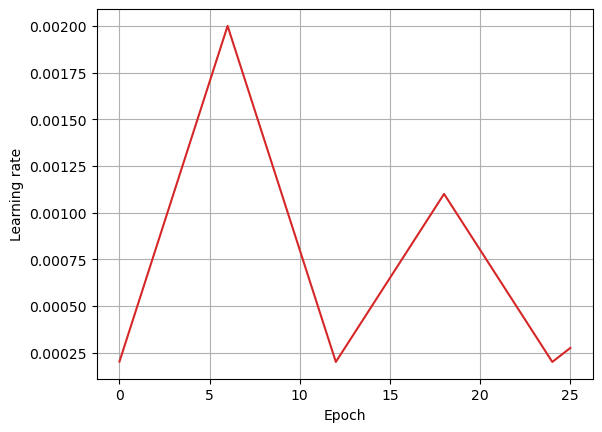

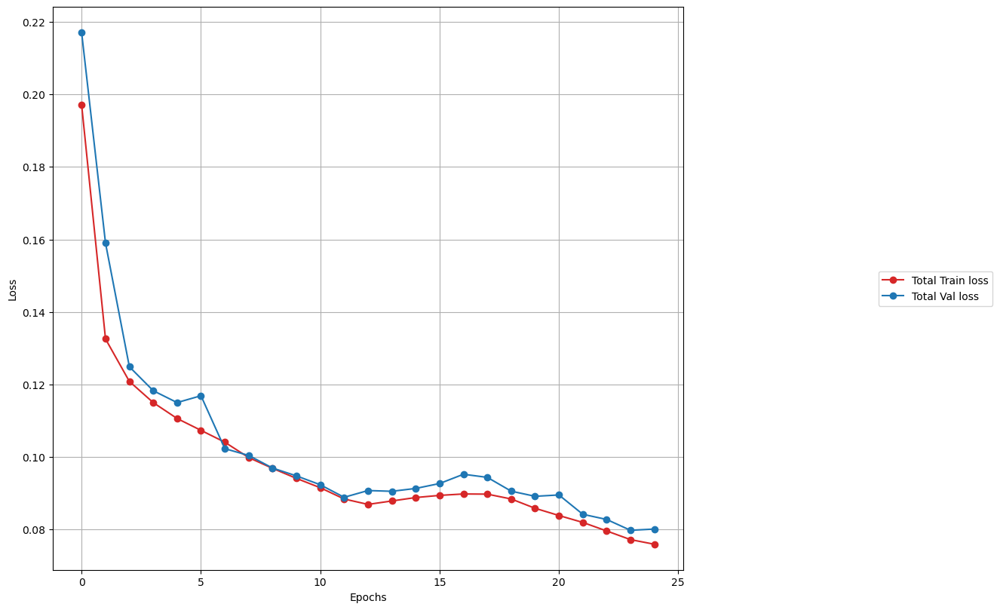

<Figure size 640x480 with 0 Axes>

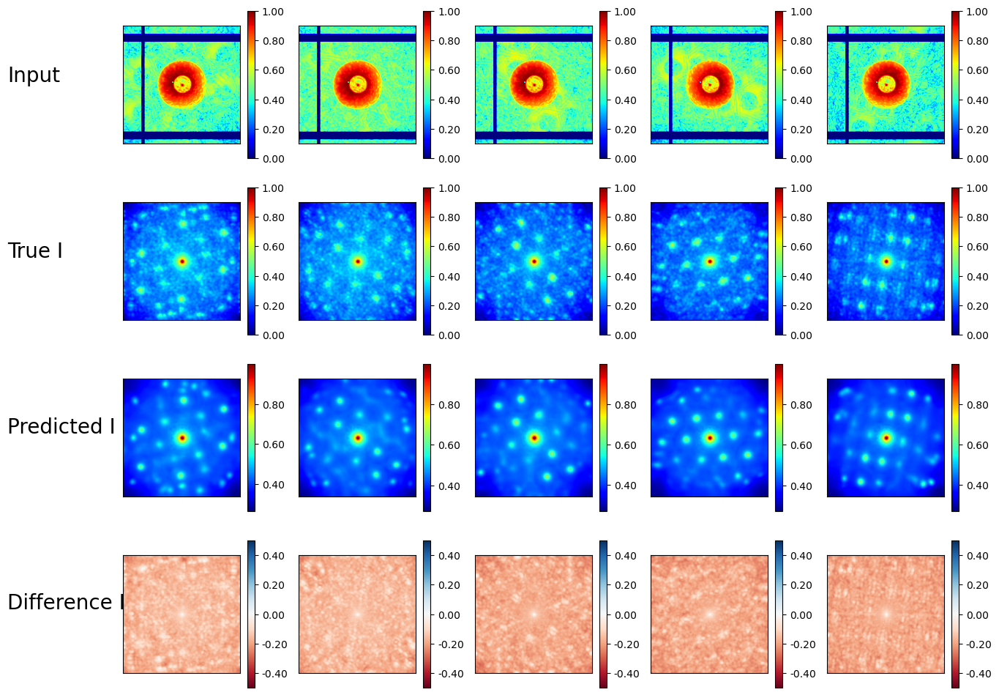

Successfully imported recon_model_no_Unet
batch size: torch.Size([32, 1, 256, 256])
torch.Size([32, 1, 256, 256])
torch.float32
Let's use 2 GPUs!
DataParallel(
  (module): recon_model(
    (encoder1): Sequential(
      (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU()
    )
    (encoder2): Sequential(
      (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU()
    )

188it [00:23,  8.12it/s]


Saving improved model after Val Loss improved from inf to 0.01350
Saving best model for epoch interval 2 at epoch 0
Saving best model for epoch interval 10 at epoch 0
Saving best model for epoch interval 25 at epoch 0
Epoch: 0 | Total  | Train Loss: 0.00436 | Val Loss: 0.01350
Epoch: 0 | Ending LR: 0.000500 


188it [00:23,  8.15it/s]


Saving improved model after Val Loss improved from 0.01350 to 0.00409
Saving best model for epoch interval 2 at epoch 1
Saving best model for epoch interval 10 at epoch 1
Saving best model for epoch interval 25 at epoch 1
Epoch: 1 | Total  | Train Loss: 0.00194 | Val Loss: 0.00409
Epoch: 1 | Ending LR: 0.000800 


188it [00:23,  8.12it/s]


Saving improved model after Val Loss improved from 0.00409 to 0.00296
Updating best model for epoch interval 2 at epoch 2
Updating best model for epoch interval 10 at epoch 2
Updating best model for epoch interval 25 at epoch 2
Epoch: 2 | Total  | Train Loss: 0.00170 | Val Loss: 0.00296
Epoch: 2 | Ending LR: 0.001100 


188it [00:23,  8.12it/s]


Saving improved model after Val Loss improved from 0.00296 to 0.00199
Updating best model for epoch interval 10 at epoch 3
Updating best model for epoch interval 25 at epoch 3
Epoch: 3 | Total  | Train Loss: 0.00165 | Val Loss: 0.00199
Epoch: 3 | Ending LR: 0.001400 


188it [00:23,  8.12it/s]


Epoch: 4 | Total  | Train Loss: 0.00304 | Val Loss: 0.00509
Epoch: 4 | Ending LR: 0.001700 


188it [00:23,  8.06it/s]


Epoch: 5 | Total  | Train Loss: 0.00226 | Val Loss: 0.00552
Epoch: 5 | Ending LR: 0.002000 


188it [00:23,  8.10it/s]


Epoch: 6 | Total  | Train Loss: 0.00185 | Val Loss: 0.00239
Epoch: 6 | Ending LR: 0.001700 


188it [00:23,  8.12it/s]


Saving improved model after Val Loss improved from 0.00199 to 0.00190
Updating best model for epoch interval 10 at epoch 7
Updating best model for epoch interval 25 at epoch 7
Epoch: 7 | Total  | Train Loss: 0.00169 | Val Loss: 0.00190
Epoch: 7 | Ending LR: 0.001400 


188it [00:23,  8.13it/s]


Epoch: 8 | Total  | Train Loss: 0.00161 | Val Loss: 0.00190
Epoch: 8 | Ending LR: 0.001100 


188it [00:23,  8.12it/s]


Saving improved model after Val Loss improved from 0.00190 to 0.00160
Updating best model for epoch interval 10 at epoch 9
Updating best model for epoch interval 25 at epoch 9
Epoch: 9 | Total  | Train Loss: 0.00155 | Val Loss: 0.00160
Epoch: 9 | Ending LR: 0.000800 


188it [00:23,  8.12it/s]


Saving improved model after Val Loss improved from 0.00160 to 0.00155
Updating best model for epoch interval 10 at epoch 10
Updating best model for epoch interval 25 at epoch 10
Epoch: 10 | Total  | Train Loss: 0.00150 | Val Loss: 0.00155
Epoch: 10 | Ending LR: 0.000500 


188it [00:23,  8.12it/s]


Saving improved model after Val Loss improved from 0.00155 to 0.00146
Updating best model for epoch interval 25 at epoch 11
Epoch: 11 | Total  | Train Loss: 0.00143 | Val Loss: 0.00146
Epoch: 11 | Ending LR: 0.000200 


188it [00:23,  8.06it/s]


Epoch: 12 | Total  | Train Loss: 0.00139 | Val Loss: 0.00151
Epoch: 12 | Ending LR: 0.000350 


188it [00:23,  8.11it/s]


Epoch: 13 | Total  | Train Loss: 0.00142 | Val Loss: 0.00149
Epoch: 13 | Ending LR: 0.000500 


188it [00:23,  8.11it/s]


Epoch: 14 | Total  | Train Loss: 0.00144 | Val Loss: 0.00159
Epoch: 14 | Ending LR: 0.000650 


188it [00:23,  8.11it/s]


Epoch: 15 | Total  | Train Loss: 0.00146 | Val Loss: 0.00177
Epoch: 15 | Ending LR: 0.000800 


188it [00:23,  8.12it/s]


Epoch: 16 | Total  | Train Loss: 0.00146 | Val Loss: 0.00175
Epoch: 16 | Ending LR: 0.000950 


188it [00:23,  8.13it/s]


Epoch: 17 | Total  | Train Loss: 0.00147 | Val Loss: 0.00173
Epoch: 17 | Ending LR: 0.001100 


188it [00:23,  8.12it/s]


Epoch: 18 | Total  | Train Loss: 0.00147 | Val Loss: 0.00153
Epoch: 18 | Ending LR: 0.000950 


188it [00:23,  8.08it/s]


Epoch: 19 | Total  | Train Loss: 0.00144 | Val Loss: 0.00161
Epoch: 19 | Ending LR: 0.000800 


188it [00:23,  8.13it/s]


Epoch: 20 | Total  | Train Loss: 0.00141 | Val Loss: 0.00170
Epoch: 20 | Ending LR: 0.000650 


188it [00:23,  8.13it/s]


Saving improved model after Val Loss improved from 0.00146 to 0.00145
Updating best model for epoch interval 25 at epoch 21
Epoch: 21 | Total  | Train Loss: 0.00139 | Val Loss: 0.00145
Epoch: 21 | Ending LR: 0.000500 


188it [00:23,  8.14it/s]


Epoch: 22 | Total  | Train Loss: 0.00136 | Val Loss: 0.00148
Epoch: 22 | Ending LR: 0.000350 


188it [00:23,  8.13it/s]


Saving improved model after Val Loss improved from 0.00145 to 0.00141
Updating best model for epoch interval 25 at epoch 23
Epoch: 23 | Total  | Train Loss: 0.00132 | Val Loss: 0.00141
Epoch: 23 | Ending LR: 0.000200 


188it [00:23,  8.12it/s]


Epoch: 24 | Total  | Train Loss: 0.00130 | Val Loss: 0.00152
Epoch: 24 | Ending LR: 0.000275 


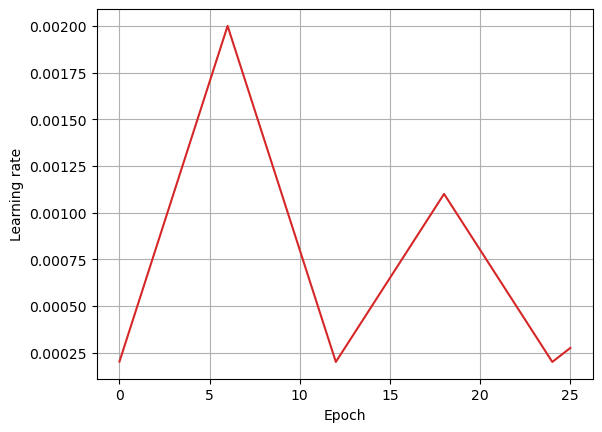

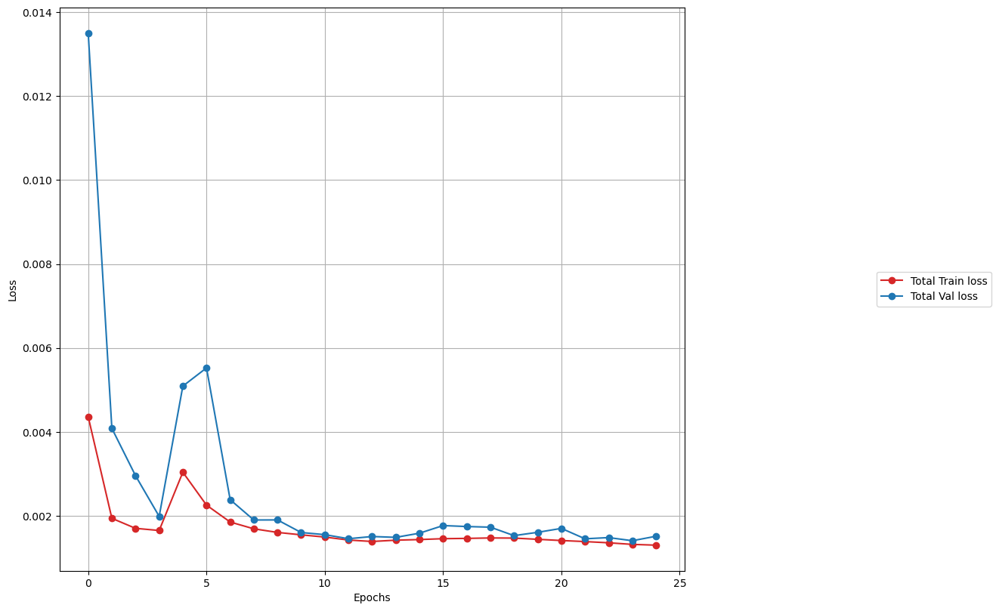

<Figure size 640x480 with 0 Axes>

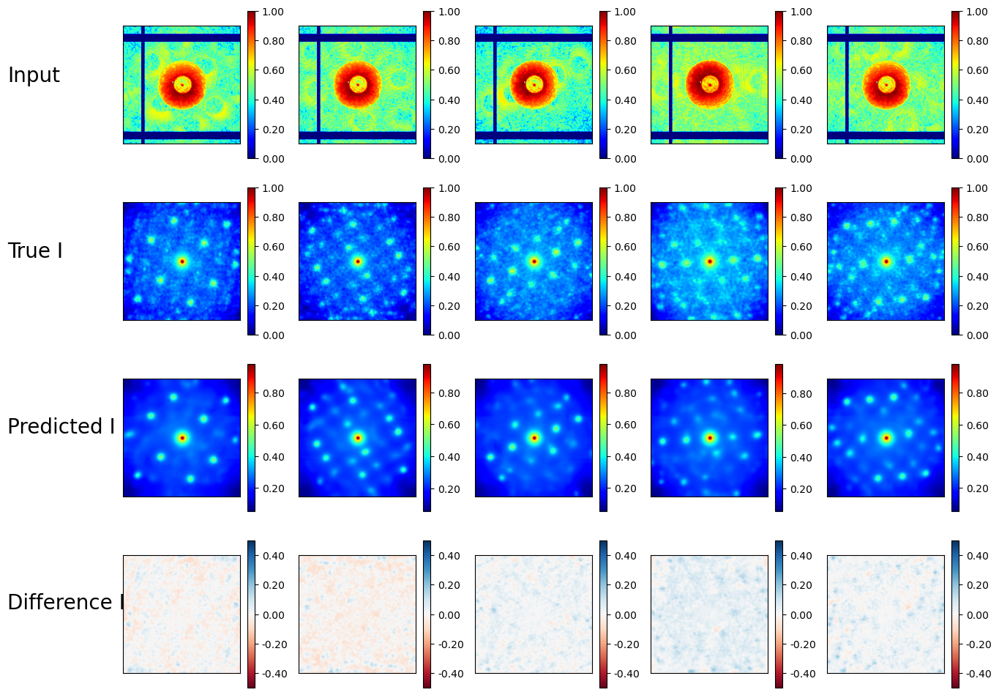

Successfully imported recon_model_no_Unet
batch size: torch.Size([32, 1, 256, 256])
torch.Size([32, 1, 256, 256])
torch.float32
Let's use 2 GPUs!
DataParallel(
  (module): recon_model(
    (encoder1): Sequential(
      (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU()
    )
    (encoder2): Sequential(
      (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU()
    )

188it [00:23,  8.14it/s]


Saving improved model after Val Loss improved from inf to 0.04755
Saving best model for epoch interval 2 at epoch 0
Saving best model for epoch interval 10 at epoch 0
Saving best model for epoch interval 25 at epoch 0
Epoch: 0 | Total  | Train Loss: 0.04261 | Val Loss: 0.04755
Epoch: 0 | Ending LR: 0.000500 


188it [00:23,  8.16it/s]


Saving improved model after Val Loss improved from 0.04755 to 0.03536
Saving best model for epoch interval 2 at epoch 1
Saving best model for epoch interval 10 at epoch 1
Saving best model for epoch interval 25 at epoch 1
Epoch: 1 | Total  | Train Loss: 0.03221 | Val Loss: 0.03536
Epoch: 1 | Ending LR: 0.000800 


188it [00:23,  8.13it/s]


Saving improved model after Val Loss improved from 0.03536 to 0.03211
Updating best model for epoch interval 2 at epoch 2
Updating best model for epoch interval 10 at epoch 2
Updating best model for epoch interval 25 at epoch 2
Epoch: 2 | Total  | Train Loss: 0.03095 | Val Loss: 0.03211
Epoch: 2 | Ending LR: 0.001100 


188it [00:23,  8.12it/s]


Saving improved model after Val Loss improved from 0.03211 to 0.03190
Updating best model for epoch interval 10 at epoch 3
Updating best model for epoch interval 25 at epoch 3
Epoch: 3 | Total  | Train Loss: 0.03055 | Val Loss: 0.03190
Epoch: 3 | Ending LR: 0.001400 


188it [00:23,  8.12it/s]


Epoch: 4 | Total  | Train Loss: 0.03870 | Val Loss: 0.06961
Epoch: 4 | Ending LR: 0.001700 


188it [00:23,  8.11it/s]


Epoch: 5 | Total  | Train Loss: 0.03542 | Val Loss: 0.03734
Epoch: 5 | Ending LR: 0.002000 


188it [00:23,  8.10it/s]


Epoch: 6 | Total  | Train Loss: 0.03260 | Val Loss: 0.03501
Epoch: 6 | Ending LR: 0.001700 


188it [00:23,  8.09it/s]


Saving improved model after Val Loss improved from 0.03190 to 0.03133
Updating best model for epoch interval 10 at epoch 7
Updating best model for epoch interval 25 at epoch 7
Epoch: 7 | Total  | Train Loss: 0.03098 | Val Loss: 0.03133
Epoch: 7 | Ending LR: 0.001400 


188it [00:23,  8.11it/s]


Saving improved model after Val Loss improved from 0.03133 to 0.03085
Updating best model for epoch interval 10 at epoch 8
Updating best model for epoch interval 25 at epoch 8
Epoch: 8 | Total  | Train Loss: 0.03033 | Val Loss: 0.03085
Epoch: 8 | Ending LR: 0.001100 


188it [00:23,  8.11it/s]


Epoch: 9 | Total  | Train Loss: 0.02969 | Val Loss: 0.03117
Epoch: 9 | Ending LR: 0.000800 


188it [00:23,  8.10it/s]


Saving improved model after Val Loss improved from 0.03085 to 0.03002
Updating best model for epoch interval 10 at epoch 10
Updating best model for epoch interval 25 at epoch 10
Epoch: 10 | Total  | Train Loss: 0.02933 | Val Loss: 0.03002
Epoch: 10 | Ending LR: 0.000500 


188it [00:23,  8.11it/s]


Saving improved model after Val Loss improved from 0.03002 to 0.02917
Updating best model for epoch interval 25 at epoch 11
Epoch: 11 | Total  | Train Loss: 0.02874 | Val Loss: 0.02917
Epoch: 11 | Ending LR: 0.000200 


188it [00:23,  8.11it/s]


Epoch: 12 | Total  | Train Loss: 0.02844 | Val Loss: 0.02942
Epoch: 12 | Ending LR: 0.000350 


188it [00:23,  8.11it/s]


Epoch: 13 | Total  | Train Loss: 0.02862 | Val Loss: 0.03178
Epoch: 13 | Ending LR: 0.000500 


188it [00:23,  8.11it/s]


Epoch: 14 | Total  | Train Loss: 0.02873 | Val Loss: 0.02933
Epoch: 14 | Ending LR: 0.000650 


188it [00:23,  8.10it/s]


Epoch: 15 | Total  | Train Loss: 0.02879 | Val Loss: 0.02949
Epoch: 15 | Ending LR: 0.000800 


188it [00:23,  8.06it/s]


Epoch: 16 | Total  | Train Loss: 0.02875 | Val Loss: 0.03108
Epoch: 16 | Ending LR: 0.000950 


188it [00:23,  8.11it/s]


Epoch: 17 | Total  | Train Loss: 0.02886 | Val Loss: 0.02979
Epoch: 17 | Ending LR: 0.001100 


188it [00:23,  8.12it/s]


Epoch: 18 | Total  | Train Loss: 0.02880 | Val Loss: 0.02969
Epoch: 18 | Ending LR: 0.000950 


188it [00:23,  8.12it/s]


Epoch: 19 | Total  | Train Loss: 0.02833 | Val Loss: 0.02968
Epoch: 19 | Ending LR: 0.000800 


188it [00:23,  8.11it/s]


Epoch: 20 | Total  | Train Loss: 0.02810 | Val Loss: 0.02917
Epoch: 20 | Ending LR: 0.000650 


188it [00:23,  8.12it/s]


Epoch: 21 | Total  | Train Loss: 0.02780 | Val Loss: 0.02939
Epoch: 21 | Ending LR: 0.000500 


188it [00:23,  8.12it/s]


Saving improved model after Val Loss improved from 0.02917 to 0.02778
Updating best model for epoch interval 25 at epoch 22
Epoch: 22 | Total  | Train Loss: 0.02753 | Val Loss: 0.02778
Epoch: 22 | Ending LR: 0.000350 


188it [00:23,  8.07it/s]


Saving improved model after Val Loss improved from 0.02778 to 0.02757
Updating best model for epoch interval 25 at epoch 23
Epoch: 23 | Total  | Train Loss: 0.02712 | Val Loss: 0.02757
Epoch: 23 | Ending LR: 0.000200 


188it [00:23,  8.15it/s]


Epoch: 24 | Total  | Train Loss: 0.02687 | Val Loss: 0.02762
Epoch: 24 | Ending LR: 0.000275 


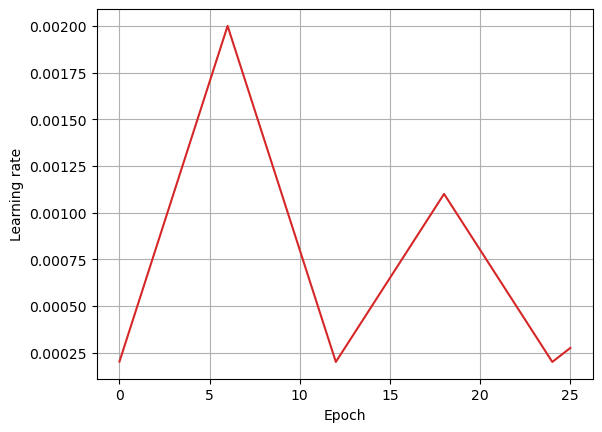

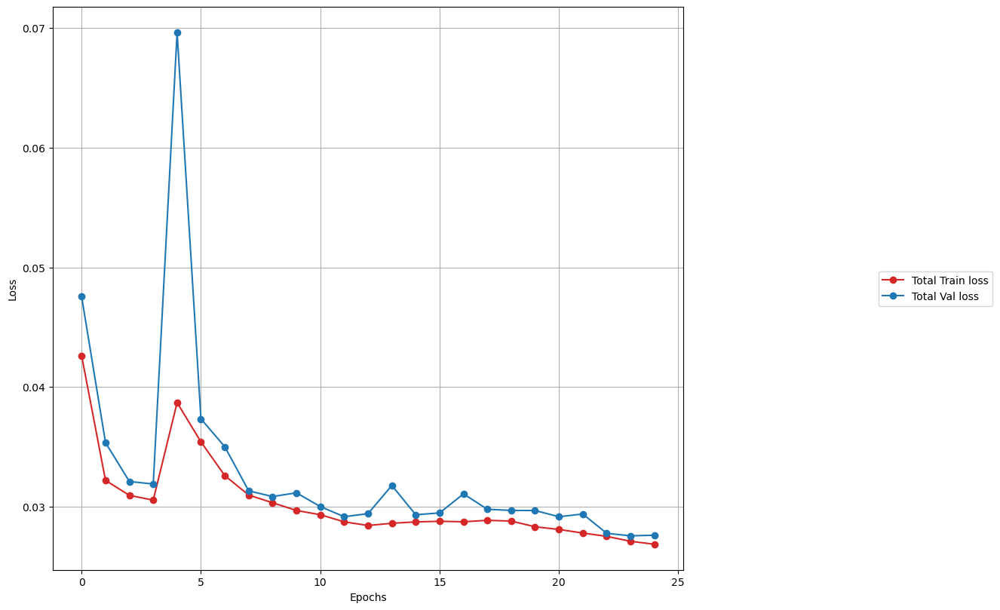

<Figure size 640x480 with 0 Axes>

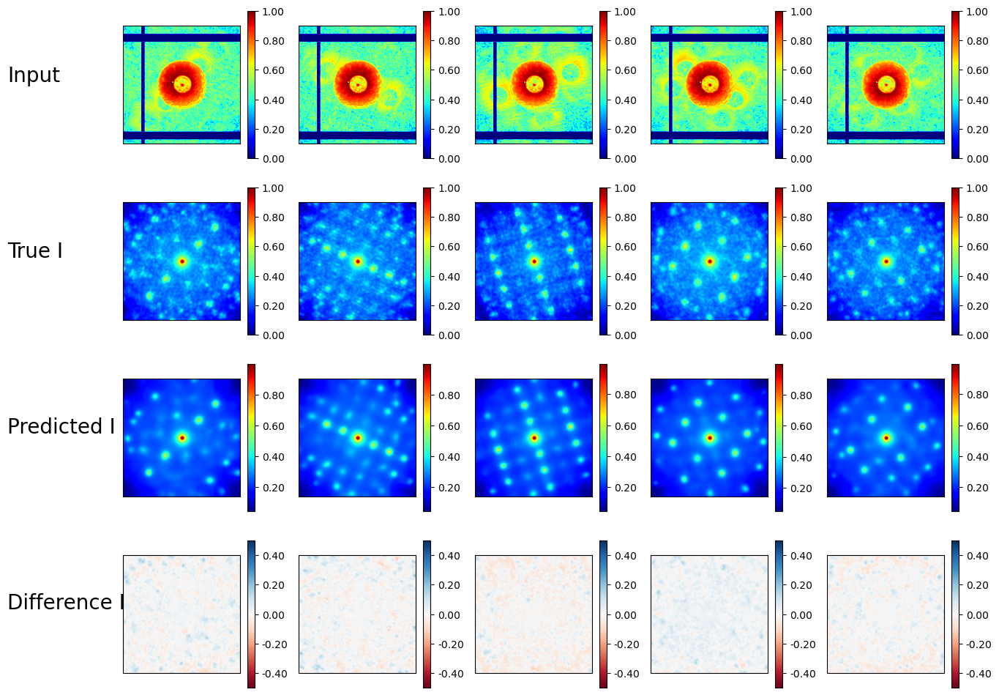

Successfully imported recon_model_Unet
batch size: torch.Size([32, 1, 256, 256])
torch.Size([32, 1, 256, 256])
torch.float32
Let's use 2 GPUs!
DataParallel(
  (module): recon_model(
    (encoder1): Sequential(
      (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU()
    )
    (encoder2): Sequential(
      (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU()
    )
  

188it [00:26,  7.21it/s]


Saving improved model after Val Loss improved from inf to 0.18422
Saving best model for epoch interval 2 at epoch 0
Saving best model for epoch interval 10 at epoch 0
Saving best model for epoch interval 25 at epoch 0
Epoch: 0 | Total  | Train Loss: 0.18859 | Val Loss: 0.18422
Epoch: 0 | Amp | Train Loss: 0.18859 | Val Loss: 0.18422
Epoch: 0 | Symmetry | Train Loss: 0.02207 | Val Loss: 0.01916
Epoch: 0 | Ending LR: 0.000500 


188it [00:25,  7.29it/s]


Saving improved model after Val Loss improved from 0.18422 to 0.15832
Saving best model for epoch interval 2 at epoch 1
Saving best model for epoch interval 10 at epoch 1
Saving best model for epoch interval 25 at epoch 1
Epoch: 1 | Total  | Train Loss: 0.13056 | Val Loss: 0.15832
Epoch: 1 | Amp | Train Loss: 0.13056 | Val Loss: 0.15832
Epoch: 1 | Symmetry | Train Loss: 0.01593 | Val Loss: 0.02009
Epoch: 1 | Ending LR: 0.000800 


188it [00:25,  7.27it/s]


Saving improved model after Val Loss improved from 0.15832 to 0.12460
Updating best model for epoch interval 2 at epoch 2
Updating best model for epoch interval 10 at epoch 2
Updating best model for epoch interval 25 at epoch 2
Epoch: 2 | Total  | Train Loss: 0.11894 | Val Loss: 0.12460
Epoch: 2 | Amp | Train Loss: 0.11894 | Val Loss: 0.12460
Epoch: 2 | Symmetry | Train Loss: 0.01630 | Val Loss: 0.01632
Epoch: 2 | Ending LR: 0.001100 


188it [00:25,  7.27it/s]


Saving improved model after Val Loss improved from 0.12460 to 0.11476
Updating best model for epoch interval 10 at epoch 3
Updating best model for epoch interval 25 at epoch 3
Epoch: 3 | Total  | Train Loss: 0.11247 | Val Loss: 0.11476
Epoch: 3 | Amp | Train Loss: 0.11247 | Val Loss: 0.11476
Epoch: 3 | Symmetry | Train Loss: 0.01685 | Val Loss: 0.01768
Epoch: 3 | Ending LR: 0.001400 


188it [00:25,  7.27it/s]


Saving improved model after Val Loss improved from 0.11476 to 0.11187
Updating best model for epoch interval 10 at epoch 4
Updating best model for epoch interval 25 at epoch 4
Epoch: 4 | Total  | Train Loss: 0.10826 | Val Loss: 0.11187
Epoch: 4 | Amp | Train Loss: 0.10826 | Val Loss: 0.11187
Epoch: 4 | Symmetry | Train Loss: 0.01688 | Val Loss: 0.01913
Epoch: 4 | Ending LR: 0.001700 


188it [00:25,  7.26it/s]


Saving improved model after Val Loss improved from 0.11187 to 0.10910
Updating best model for epoch interval 10 at epoch 5
Updating best model for epoch interval 25 at epoch 5
Epoch: 5 | Total  | Train Loss: 0.10521 | Val Loss: 0.10910
Epoch: 5 | Amp | Train Loss: 0.10521 | Val Loss: 0.10910
Epoch: 5 | Symmetry | Train Loss: 0.01672 | Val Loss: 0.01494
Epoch: 5 | Ending LR: 0.002000 


188it [00:25,  7.27it/s]


Saving improved model after Val Loss improved from 0.10910 to 0.10149
Updating best model for epoch interval 10 at epoch 6
Updating best model for epoch interval 25 at epoch 6
Epoch: 6 | Total  | Train Loss: 0.10142 | Val Loss: 0.10149
Epoch: 6 | Amp | Train Loss: 0.10142 | Val Loss: 0.10149
Epoch: 6 | Symmetry | Train Loss: 0.01668 | Val Loss: 0.01558
Epoch: 6 | Ending LR: 0.001700 


188it [00:25,  7.27it/s]


Saving improved model after Val Loss improved from 0.10149 to 0.09775
Updating best model for epoch interval 10 at epoch 7
Updating best model for epoch interval 25 at epoch 7
Epoch: 7 | Total  | Train Loss: 0.09790 | Val Loss: 0.09775
Epoch: 7 | Amp | Train Loss: 0.09790 | Val Loss: 0.09775
Epoch: 7 | Symmetry | Train Loss: 0.01648 | Val Loss: 0.01543
Epoch: 7 | Ending LR: 0.001400 


188it [00:25,  7.27it/s]


Saving improved model after Val Loss improved from 0.09775 to 0.09548
Updating best model for epoch interval 10 at epoch 8
Updating best model for epoch interval 25 at epoch 8
Epoch: 8 | Total  | Train Loss: 0.09501 | Val Loss: 0.09548
Epoch: 8 | Amp | Train Loss: 0.09501 | Val Loss: 0.09548
Epoch: 8 | Symmetry | Train Loss: 0.01628 | Val Loss: 0.01490
Epoch: 8 | Ending LR: 0.001100 


188it [00:25,  7.27it/s]


Saving improved model after Val Loss improved from 0.09548 to 0.09389
Updating best model for epoch interval 10 at epoch 9
Updating best model for epoch interval 25 at epoch 9
Epoch: 9 | Total  | Train Loss: 0.09248 | Val Loss: 0.09389
Epoch: 9 | Amp | Train Loss: 0.09248 | Val Loss: 0.09389
Epoch: 9 | Symmetry | Train Loss: 0.01616 | Val Loss: 0.01573
Epoch: 9 | Ending LR: 0.000800 


188it [00:25,  7.27it/s]


Saving improved model after Val Loss improved from 0.09389 to 0.08974
Updating best model for epoch interval 10 at epoch 10
Updating best model for epoch interval 25 at epoch 10
Epoch: 10 | Total  | Train Loss: 0.08942 | Val Loss: 0.08974
Epoch: 10 | Amp | Train Loss: 0.08942 | Val Loss: 0.08974
Epoch: 10 | Symmetry | Train Loss: 0.01600 | Val Loss: 0.01506
Epoch: 10 | Ending LR: 0.000500 


188it [00:25,  7.27it/s]


Saving improved model after Val Loss improved from 0.08974 to 0.08737
Updating best model for epoch interval 25 at epoch 11
Epoch: 11 | Total  | Train Loss: 0.08608 | Val Loss: 0.08737
Epoch: 11 | Amp | Train Loss: 0.08608 | Val Loss: 0.08737
Epoch: 11 | Symmetry | Train Loss: 0.01576 | Val Loss: 0.01517
Epoch: 11 | Ending LR: 0.000200 


188it [00:25,  7.27it/s]


Epoch: 12 | Total  | Train Loss: 0.08447 | Val Loss: 0.08748
Epoch: 12 | Amp | Train Loss: 0.08447 | Val Loss: 0.08748
Epoch: 12 | Symmetry | Train Loss: 0.01569 | Val Loss: 0.01541
Epoch: 12 | Ending LR: 0.000350 


188it [00:25,  7.25it/s]


Epoch: 13 | Total  | Train Loss: 0.08548 | Val Loss: 0.08947
Epoch: 13 | Amp | Train Loss: 0.08548 | Val Loss: 0.08947
Epoch: 13 | Symmetry | Train Loss: 0.01590 | Val Loss: 0.01723
Epoch: 13 | Ending LR: 0.000500 


188it [00:25,  7.27it/s]


Epoch: 14 | Total  | Train Loss: 0.08666 | Val Loss: 0.09061
Epoch: 14 | Amp | Train Loss: 0.08666 | Val Loss: 0.09061
Epoch: 14 | Symmetry | Train Loss: 0.01618 | Val Loss: 0.01471
Epoch: 14 | Ending LR: 0.000650 


188it [00:25,  7.25it/s]


Epoch: 15 | Total  | Train Loss: 0.08730 | Val Loss: 0.09251
Epoch: 15 | Amp | Train Loss: 0.08730 | Val Loss: 0.09251
Epoch: 15 | Symmetry | Train Loss: 0.01633 | Val Loss: 0.01801
Epoch: 15 | Ending LR: 0.000800 


188it [00:25,  7.30it/s]


Epoch: 16 | Total  | Train Loss: 0.08770 | Val Loss: 0.09195
Epoch: 16 | Amp | Train Loss: 0.08770 | Val Loss: 0.09195
Epoch: 16 | Symmetry | Train Loss: 0.01655 | Val Loss: 0.01698
Epoch: 16 | Ending LR: 0.000950 


188it [00:25,  7.26it/s]


Epoch: 17 | Total  | Train Loss: 0.08800 | Val Loss: 0.09304
Epoch: 17 | Amp | Train Loss: 0.08800 | Val Loss: 0.09304
Epoch: 17 | Symmetry | Train Loss: 0.01662 | Val Loss: 0.01638
Epoch: 17 | Ending LR: 0.001100 


188it [00:25,  7.26it/s]


Epoch: 18 | Total  | Train Loss: 0.08651 | Val Loss: 0.09188
Epoch: 18 | Amp | Train Loss: 0.08651 | Val Loss: 0.09188
Epoch: 18 | Symmetry | Train Loss: 0.01656 | Val Loss: 0.01707
Epoch: 18 | Ending LR: 0.000950 


188it [00:25,  7.25it/s]


Epoch: 19 | Total  | Train Loss: 0.08446 | Val Loss: 0.08738
Epoch: 19 | Amp | Train Loss: 0.08446 | Val Loss: 0.08738
Epoch: 19 | Symmetry | Train Loss: 0.01636 | Val Loss: 0.01613
Epoch: 19 | Ending LR: 0.000800 


188it [00:26,  7.22it/s]


Saving improved model after Val Loss improved from 0.08737 to 0.08571
Updating best model for epoch interval 25 at epoch 20
Epoch: 20 | Total  | Train Loss: 0.08225 | Val Loss: 0.08571
Epoch: 20 | Amp | Train Loss: 0.08225 | Val Loss: 0.08571
Epoch: 20 | Symmetry | Train Loss: 0.01627 | Val Loss: 0.01537
Epoch: 20 | Ending LR: 0.000650 


188it [00:25,  7.28it/s]


Saving improved model after Val Loss improved from 0.08571 to 0.08266
Updating best model for epoch interval 25 at epoch 21
Epoch: 21 | Total  | Train Loss: 0.08028 | Val Loss: 0.08266
Epoch: 21 | Amp | Train Loss: 0.08028 | Val Loss: 0.08266
Epoch: 21 | Symmetry | Train Loss: 0.01615 | Val Loss: 0.01520
Epoch: 21 | Ending LR: 0.000500 


188it [00:25,  7.26it/s]


Saving improved model after Val Loss improved from 0.08266 to 0.07994
Updating best model for epoch interval 25 at epoch 22
Epoch: 22 | Total  | Train Loss: 0.07783 | Val Loss: 0.07994
Epoch: 22 | Amp | Train Loss: 0.07783 | Val Loss: 0.07994
Epoch: 22 | Symmetry | Train Loss: 0.01597 | Val Loss: 0.01537
Epoch: 22 | Ending LR: 0.000350 


188it [00:25,  7.26it/s]


Saving improved model after Val Loss improved from 0.07994 to 0.07835
Updating best model for epoch interval 25 at epoch 23
Epoch: 23 | Total  | Train Loss: 0.07529 | Val Loss: 0.07835
Epoch: 23 | Amp | Train Loss: 0.07529 | Val Loss: 0.07835
Epoch: 23 | Symmetry | Train Loss: 0.01581 | Val Loss: 0.01551
Epoch: 23 | Ending LR: 0.000200 


188it [00:25,  7.28it/s]


Epoch: 24 | Total  | Train Loss: 0.07375 | Val Loss: 0.07883
Epoch: 24 | Amp | Train Loss: 0.07375 | Val Loss: 0.07883
Epoch: 24 | Symmetry | Train Loss: 0.01579 | Val Loss: 0.01461
Epoch: 24 | Ending LR: 0.000275 


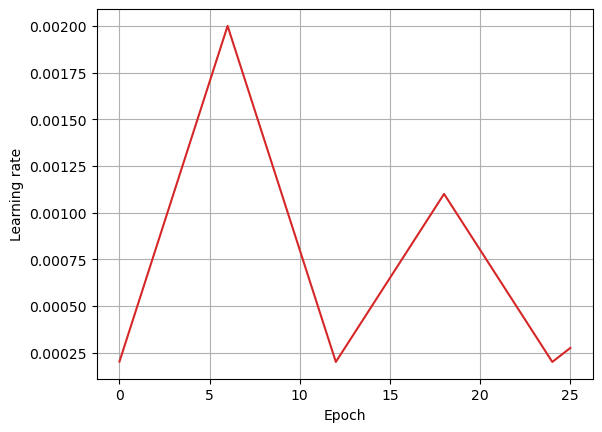

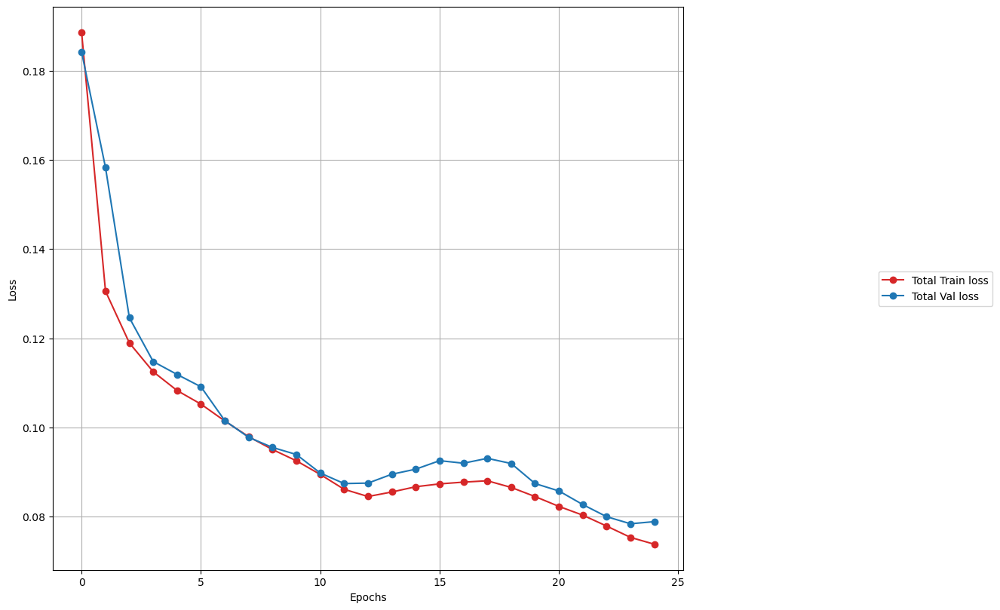

<Figure size 640x480 with 0 Axes>

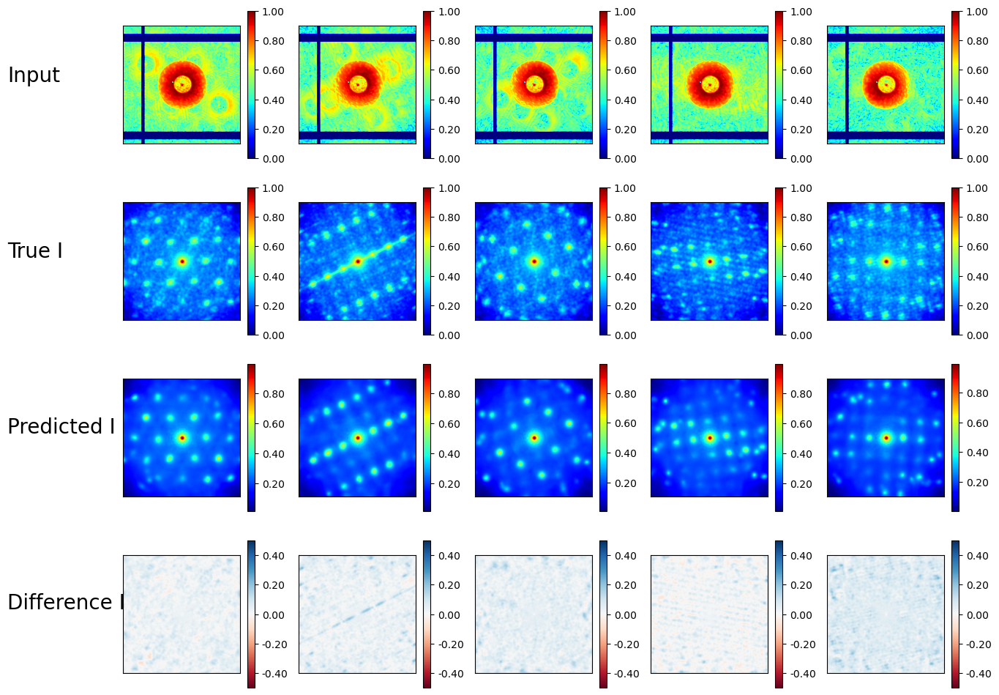

Successfully imported recon_model_Unet
batch size: torch.Size([32, 1, 256, 256])
torch.Size([32, 1, 256, 256])
torch.float32
Let's use 2 GPUs!
DataParallel(
  (module): recon_model(
    (encoder1): Sequential(
      (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU()
    )
    (encoder2): Sequential(
      (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU()
    )
  

188it [00:25,  7.42it/s]


Saving improved model after Val Loss improved from inf to 0.00394
Saving best model for epoch interval 2 at epoch 0
Saving best model for epoch interval 10 at epoch 0
Saving best model for epoch interval 25 at epoch 0
Epoch: 0 | Total  | Train Loss: 0.00465 | Val Loss: 0.00394
Epoch: 0 | Ending LR: 0.000500 


188it [00:25,  7.44it/s]


Saving improved model after Val Loss improved from 0.00394 to 0.00230
Saving best model for epoch interval 2 at epoch 1
Saving best model for epoch interval 10 at epoch 1
Saving best model for epoch interval 25 at epoch 1
Epoch: 1 | Total  | Train Loss: 0.00187 | Val Loss: 0.00230
Epoch: 1 | Ending LR: 0.000800 


188it [00:25,  7.45it/s]


Saving improved model after Val Loss improved from 0.00230 to 0.00176
Updating best model for epoch interval 2 at epoch 2
Updating best model for epoch interval 10 at epoch 2
Updating best model for epoch interval 25 at epoch 2
Epoch: 2 | Total  | Train Loss: 0.00171 | Val Loss: 0.00176
Epoch: 2 | Ending LR: 0.001100 


188it [00:25,  7.43it/s]


Epoch: 3 | Total  | Train Loss: 0.00231 | Val Loss: 0.00304
Epoch: 3 | Ending LR: 0.001400 


188it [00:25,  7.37it/s]


Epoch: 4 | Total  | Train Loss: 0.00188 | Val Loss: 0.00330
Epoch: 4 | Ending LR: 0.001700 


188it [00:25,  7.42it/s]


Epoch: 5 | Total  | Train Loss: 0.00180 | Val Loss: 0.00338
Epoch: 5 | Ending LR: 0.002000 


188it [00:25,  7.41it/s]


Epoch: 6 | Total  | Train Loss: 0.00172 | Val Loss: 0.00227
Epoch: 6 | Ending LR: 0.001700 


188it [00:25,  7.42it/s]


Epoch: 7 | Total  | Train Loss: 0.00165 | Val Loss: 0.00185
Epoch: 7 | Ending LR: 0.001400 


188it [00:25,  7.43it/s]


Epoch: 8 | Total  | Train Loss: 0.00160 | Val Loss: 0.00178
Epoch: 8 | Ending LR: 0.001100 


188it [00:25,  7.42it/s]


Epoch: 9 | Total  | Train Loss: 0.00154 | Val Loss: 0.00183
Epoch: 9 | Ending LR: 0.000800 


188it [00:25,  7.44it/s]


Saving improved model after Val Loss improved from 0.00176 to 0.00154
Updating best model for epoch interval 10 at epoch 10
Updating best model for epoch interval 25 at epoch 10
Epoch: 10 | Total  | Train Loss: 0.00148 | Val Loss: 0.00154
Epoch: 10 | Ending LR: 0.000500 


188it [00:25,  7.39it/s]


Saving improved model after Val Loss improved from 0.00154 to 0.00141
Updating best model for epoch interval 25 at epoch 11
Epoch: 11 | Total  | Train Loss: 0.00142 | Val Loss: 0.00141
Epoch: 11 | Ending LR: 0.000200 


188it [00:25,  7.44it/s]


Epoch: 12 | Total  | Train Loss: 0.00140 | Val Loss: 0.00153
Epoch: 12 | Ending LR: 0.000350 


188it [00:25,  7.45it/s]


Epoch: 13 | Total  | Train Loss: 0.00142 | Val Loss: 0.00148
Epoch: 13 | Ending LR: 0.000500 


188it [00:25,  7.45it/s]


Epoch: 14 | Total  | Train Loss: 0.00143 | Val Loss: 0.00147
Epoch: 14 | Ending LR: 0.000650 


188it [00:25,  7.47it/s]


Epoch: 15 | Total  | Train Loss: 0.00145 | Val Loss: 0.00163
Epoch: 15 | Ending LR: 0.000800 


188it [00:25,  7.47it/s]


Epoch: 16 | Total  | Train Loss: 0.00146 | Val Loss: 0.00158
Epoch: 16 | Ending LR: 0.000950 


188it [00:25,  7.48it/s]


Epoch: 17 | Total  | Train Loss: 0.00146 | Val Loss: 0.00161
Epoch: 17 | Ending LR: 0.001100 


188it [00:25,  7.43it/s]


Epoch: 18 | Total  | Train Loss: 0.00145 | Val Loss: 0.00167
Epoch: 18 | Ending LR: 0.000950 


188it [00:25,  7.48it/s]


Epoch: 19 | Total  | Train Loss: 0.00143 | Val Loss: 0.00159
Epoch: 19 | Ending LR: 0.000800 


188it [00:25,  7.49it/s]


Epoch: 20 | Total  | Train Loss: 0.00141 | Val Loss: 0.00149
Epoch: 20 | Ending LR: 0.000650 


188it [00:25,  7.47it/s]


Epoch: 21 | Total  | Train Loss: 0.00138 | Val Loss: 0.00144
Epoch: 21 | Ending LR: 0.000500 


188it [00:25,  7.48it/s]


Epoch: 22 | Total  | Train Loss: 0.00135 | Val Loss: 0.00144
Epoch: 22 | Ending LR: 0.000350 


188it [00:25,  7.50it/s]


Saving improved model after Val Loss improved from 0.00141 to 0.00131
Updating best model for epoch interval 25 at epoch 23
Epoch: 23 | Total  | Train Loss: 0.00132 | Val Loss: 0.00131
Epoch: 23 | Ending LR: 0.000200 


188it [00:25,  7.49it/s]


Epoch: 24 | Total  | Train Loss: 0.00130 | Val Loss: 0.00140
Epoch: 24 | Ending LR: 0.000275 


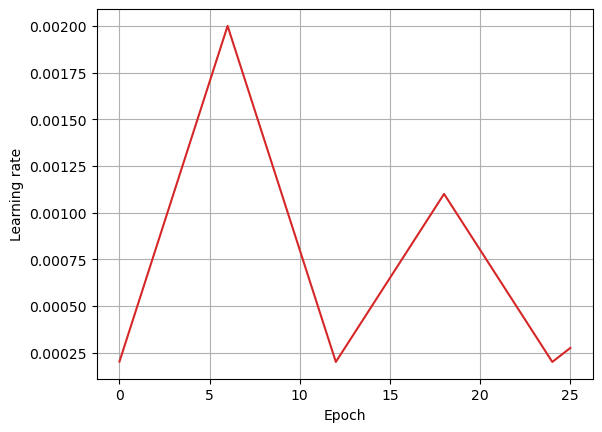

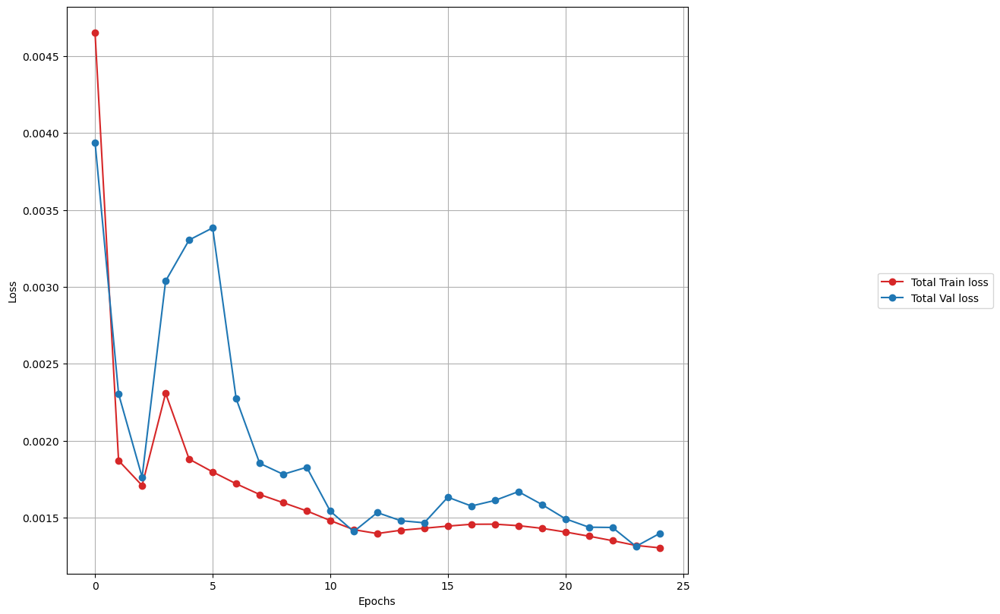

<Figure size 640x480 with 0 Axes>

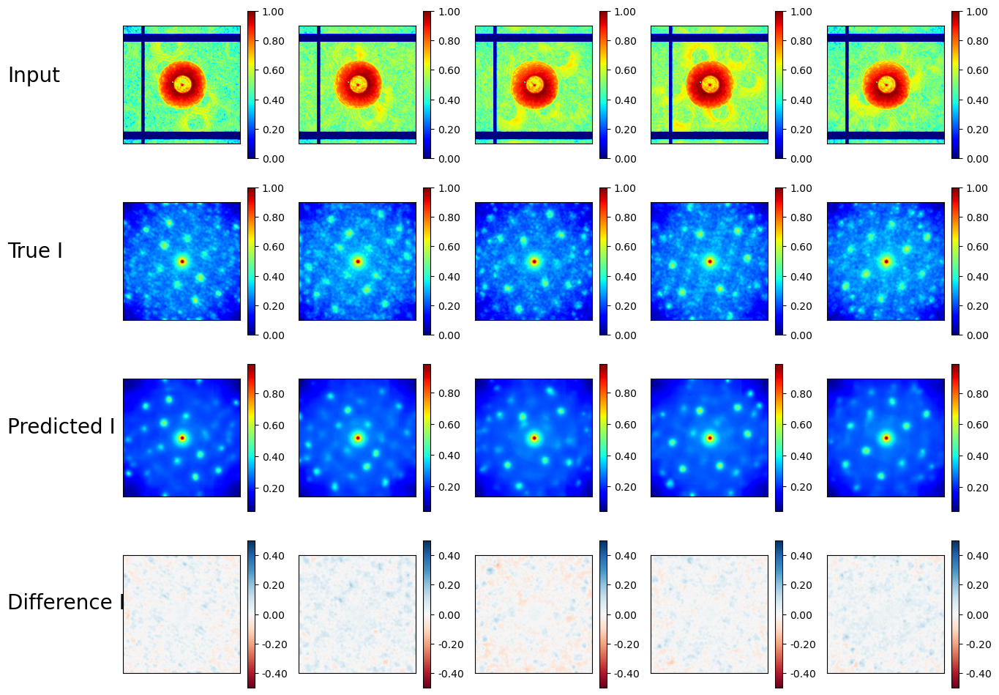

Successfully imported recon_model_Unet
batch size: torch.Size([32, 1, 256, 256])
torch.Size([32, 1, 256, 256])
torch.float32
Let's use 2 GPUs!
DataParallel(
  (module): recon_model(
    (encoder1): Sequential(
      (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU()
    )
    (encoder2): Sequential(
      (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU()
    )
  

188it [00:25,  7.43it/s]


Saving improved model after Val Loss improved from inf to 0.04312
Saving best model for epoch interval 2 at epoch 0
Saving best model for epoch interval 10 at epoch 0
Saving best model for epoch interval 25 at epoch 0
Epoch: 0 | Total  | Train Loss: 0.04198 | Val Loss: 0.04312
Epoch: 0 | Ending LR: 0.000500 


188it [00:25,  7.37it/s]


Saving improved model after Val Loss improved from 0.04312 to 0.03439
Saving best model for epoch interval 2 at epoch 1
Saving best model for epoch interval 10 at epoch 1
Saving best model for epoch interval 25 at epoch 1
Epoch: 1 | Total  | Train Loss: 0.03228 | Val Loss: 0.03439
Epoch: 1 | Ending LR: 0.000800 


188it [00:25,  7.43it/s]


Saving improved model after Val Loss improved from 0.03439 to 0.03317
Updating best model for epoch interval 2 at epoch 2
Updating best model for epoch interval 10 at epoch 2
Updating best model for epoch interval 25 at epoch 2
Epoch: 2 | Total  | Train Loss: 0.03100 | Val Loss: 0.03317
Epoch: 2 | Ending LR: 0.001100 


188it [00:25,  7.42it/s]


Saving improved model after Val Loss improved from 0.03317 to 0.03270
Updating best model for epoch interval 10 at epoch 3
Updating best model for epoch interval 25 at epoch 3
Epoch: 3 | Total  | Train Loss: 0.03062 | Val Loss: 0.03270
Epoch: 3 | Ending LR: 0.001400 


188it [00:25,  7.42it/s]


Saving improved model after Val Loss improved from 0.03270 to 0.03187
Updating best model for epoch interval 10 at epoch 4
Updating best model for epoch interval 25 at epoch 4
Epoch: 4 | Total  | Train Loss: 0.03027 | Val Loss: 0.03187
Epoch: 4 | Ending LR: 0.001700 


188it [00:25,  7.41it/s]


Epoch: 5 | Total  | Train Loss: 0.03025 | Val Loss: 0.03238
Epoch: 5 | Ending LR: 0.002000 


188it [00:25,  7.43it/s]


Epoch: 6 | Total  | Train Loss: 0.03013 | Val Loss: 0.03215
Epoch: 6 | Ending LR: 0.001700 


188it [00:25,  7.43it/s]


Saving improved model after Val Loss improved from 0.03187 to 0.03181
Updating best model for epoch interval 10 at epoch 7
Updating best model for epoch interval 25 at epoch 7
Epoch: 7 | Total  | Train Loss: 0.02965 | Val Loss: 0.03181
Epoch: 7 | Ending LR: 0.001400 


188it [00:25,  7.38it/s]


Saving improved model after Val Loss improved from 0.03181 to 0.02983
Updating best model for epoch interval 10 at epoch 8
Updating best model for epoch interval 25 at epoch 8
Epoch: 8 | Total  | Train Loss: 0.02929 | Val Loss: 0.02983
Epoch: 8 | Ending LR: 0.001100 


188it [00:25,  7.43it/s]


Saving improved model after Val Loss improved from 0.02983 to 0.02957
Updating best model for epoch interval 10 at epoch 9
Updating best model for epoch interval 25 at epoch 9
Epoch: 9 | Total  | Train Loss: 0.02880 | Val Loss: 0.02957
Epoch: 9 | Ending LR: 0.000800 


188it [00:25,  7.44it/s]


Saving improved model after Val Loss improved from 0.02957 to 0.02929
Updating best model for epoch interval 10 at epoch 10
Updating best model for epoch interval 25 at epoch 10
Epoch: 10 | Total  | Train Loss: 0.02851 | Val Loss: 0.02929
Epoch: 10 | Ending LR: 0.000500 


188it [00:25,  7.44it/s]


Saving improved model after Val Loss improved from 0.02929 to 0.02812
Updating best model for epoch interval 25 at epoch 11
Epoch: 11 | Total  | Train Loss: 0.02796 | Val Loss: 0.02812
Epoch: 11 | Ending LR: 0.000200 


188it [00:25,  7.43it/s]


Epoch: 12 | Total  | Train Loss: 0.02760 | Val Loss: 0.02859
Epoch: 12 | Ending LR: 0.000350 


188it [00:25,  7.44it/s]


Epoch: 13 | Total  | Train Loss: 0.02786 | Val Loss: 0.02890
Epoch: 13 | Ending LR: 0.000500 


188it [00:25,  7.43it/s]


Epoch: 14 | Total  | Train Loss: 0.02803 | Val Loss: 0.03003
Epoch: 14 | Ending LR: 0.000650 


188it [00:25,  7.41it/s]


Epoch: 15 | Total  | Train Loss: 0.02811 | Val Loss: 0.02898
Epoch: 15 | Ending LR: 0.000800 


188it [00:25,  7.45it/s]


Epoch: 16 | Total  | Train Loss: 0.02810 | Val Loss: 0.02948
Epoch: 16 | Ending LR: 0.000950 


188it [00:25,  7.45it/s]


Epoch: 17 | Total  | Train Loss: 0.02829 | Val Loss: 0.02901
Epoch: 17 | Ending LR: 0.001100 


188it [00:25,  7.46it/s]


Epoch: 18 | Total  | Train Loss: 0.02835 | Val Loss: 0.02885
Epoch: 18 | Ending LR: 0.000950 


188it [00:25,  7.46it/s]


Epoch: 19 | Total  | Train Loss: 0.02800 | Val Loss: 0.02843
Epoch: 19 | Ending LR: 0.000800 


188it [00:25,  7.46it/s]


Epoch: 20 | Total  | Train Loss: 0.02771 | Val Loss: 0.02858
Epoch: 20 | Ending LR: 0.000650 


188it [00:25,  7.46it/s]


Epoch: 21 | Total  | Train Loss: 0.02738 | Val Loss: 0.02847
Epoch: 21 | Ending LR: 0.000500 


188it [00:25,  7.40it/s]


Saving improved model after Val Loss improved from 0.02812 to 0.02748
Updating best model for epoch interval 25 at epoch 22
Epoch: 22 | Total  | Train Loss: 0.02711 | Val Loss: 0.02748
Epoch: 22 | Ending LR: 0.000350 


188it [00:25,  7.45it/s]


Saving improved model after Val Loss improved from 0.02748 to 0.02706
Updating best model for epoch interval 25 at epoch 23
Epoch: 23 | Total  | Train Loss: 0.02671 | Val Loss: 0.02706
Epoch: 23 | Ending LR: 0.000200 


188it [00:25,  7.48it/s]


Epoch: 24 | Total  | Train Loss: 0.02652 | Val Loss: 0.02730
Epoch: 24 | Ending LR: 0.000275 


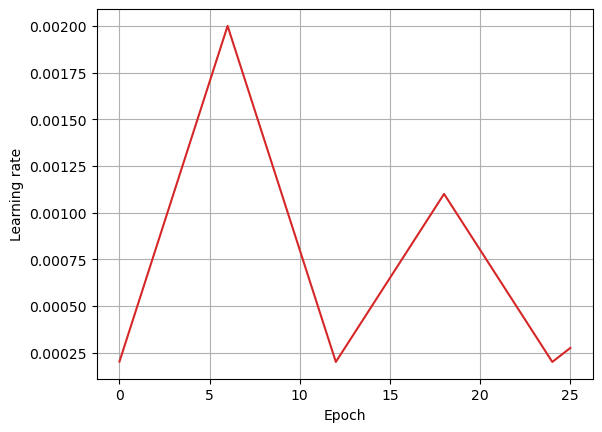

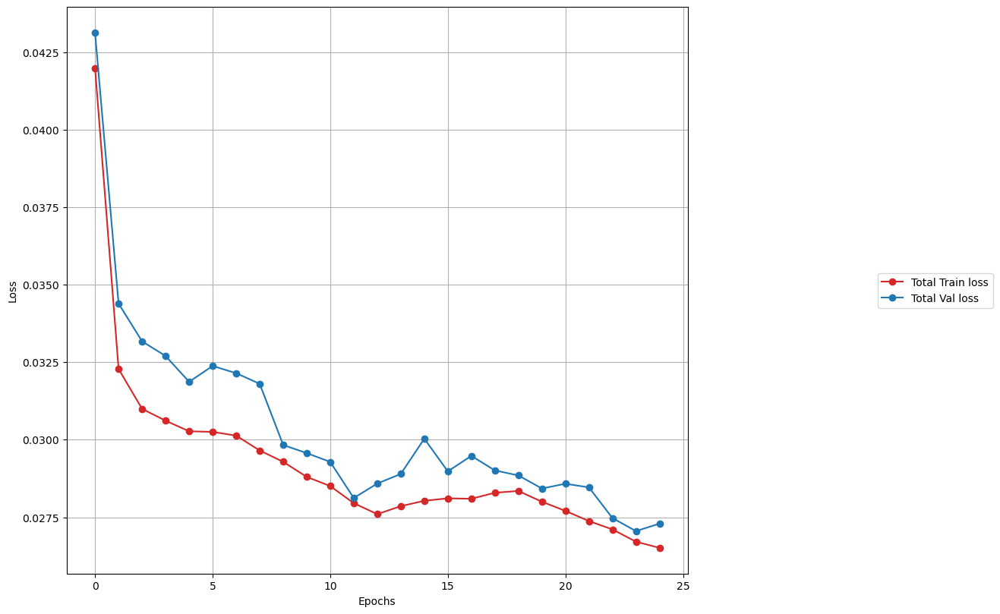

<Figure size 640x480 with 0 Axes>

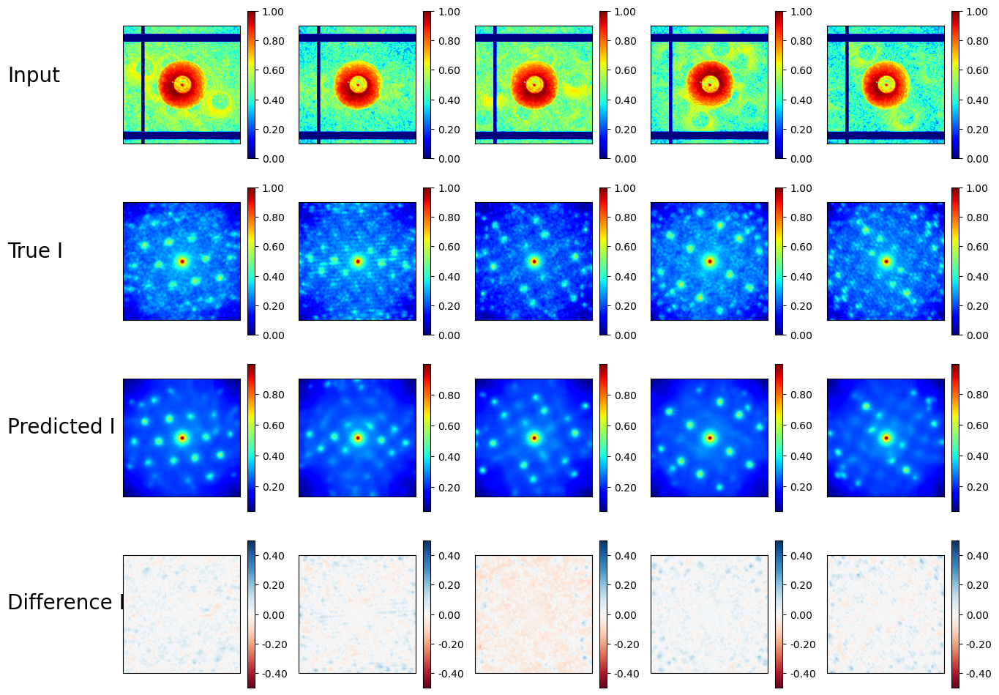

LatticeSC_Probe128x128_ZCB_9_3D__Noise_sim_ZCB_9_3D_S5065_N600_steps4_dp256
Loading data from: /net/micdata/data2/12IDC/ptychosaxs/batch_mode/preprocessed/preprocessed_sim_LatticeSC_Probe128x128_ZCB_9_3D__Noise_sim_ZCB_9_3D_S5065_N600_steps4_dp256.npz


In [ ]:
import os
import numpy as np
import torch, torchvision
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import TensorDataset, DataLoader
from pathlib import Path
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from matplotlib import colors
import sys
from tqdm import tqdm
import numpy as np
from numpy.fft import fft2, fftshift
import matplotlib.pyplot as plt
import sys
import os
import importlib

plt.rcParams["image.cmap"] = "jet"


# Setting path
# path = Path("Y:/ptychosaxs")  # /net/micdata/data2/12IDC mounted windows drive
path = Path("/net/micdata/data2/12IDC/ptychosaxs/")
#path = Path("/scratch/")
# Join paths
MODEL_SAVE_PATH = path / 'batch_mode_250/trained_model/' # Automatically adds the correct separator
if (not os.path.isdir(MODEL_SAVE_PATH)):
    os.mkdir(MODEL_SAVE_PATH)
print(MODEL_SAVE_PATH)


lattice_list=['ClathII','SC',]
noise_list=['Noise','noNoise']
unet_status_list=['no_Unet','Unet']
loss_function_list=['pearson_loss','L2','L1']
probe_size_list=[128,256]

numDPs_list=[9600]
symmetry_weight=0.0



# For full training
EPOCHS = 250
# Specify which GPUs to use (e.g. GPUs 1 and 2)
selected_gpus = [0,1]  # Select GPUs (0, 1, 2, or 3)
NGPUS = len(selected_gpus)
#NGPUS = torch.cuda.device_count() # if all GPUs are used
BATCH_SIZE = NGPUS*16
LR = NGPUS * 1e-3
print("GPUs:", NGPUS, "Batch size:", BATCH_SIZE, "Learning rate:", LR)
no_probe=True

# Add the models directory to the path
sys.path.append(os.path.abspath(os.path.join(os.getcwd(), '../../src/models/')))



def pearson_loss(output, target):
    """
    Compute 1 - Pearson correlation coefficient as a loss function, with additional
    penalty for breaking inversion symmetry outside central 64x64 circle.
    Args:
        output: Predicted values (B, C, H, W)
        target: Target values (B, C, H, W)
    Returns:
        loss: Combined loss of correlation and symmetry terms
    """
    # Create circular mask for central 64x64 region
    h, w = output.shape[2:]
    y, x = torch.meshgrid(torch.arange(h), torch.arange(w))
    center_y, center_x = h // 2, w // 2
    radius = 32  # 64/2 for 64x64 circle
    mask = ((y - center_y)**2 + (x - center_x)**2 <= radius**2).to(output.device)
    
    # Basic Pearson correlation loss
    output_flat = output.view(output.size(0), -1)
    target_flat = target.view(target.size(0), -1)
    
    output_mean = output_flat.mean(dim=1, keepdim=True)
    target_mean = target_flat.mean(dim=1, keepdim=True)
    
    output_centered = output_flat - output_mean
    target_centered = target_flat - target_mean
    
    numerator = (output_centered * target_centered).sum(dim=1)
    denominator = torch.sqrt((output_centered**2).sum(dim=1) * (target_centered**2).sum(dim=1))
    correlation = numerator / (denominator + 1e-8)
    pearson_loss = 1 - correlation.mean()
    
    # Symmetry loss for region outside circle
    output_flipped = torch.flip(output, dims=[-2, -1])  # Flip both height and width
    outside_mask = ~mask
    symmetry_loss = torch.mean(torch.abs(output[..., outside_mask] - output_flipped[..., outside_mask]))
    
    # Combine losses - can adjust weight of symmetry term
    #symmetry_weight = 0.5
    total_loss = pearson_loss + symmetry_weight * symmetry_loss
    
    return total_loss, pearson_loss, symmetry_loss



for probe_size in probe_size_list:
    for lattice in lattice_list:
        for noise in noise_list:
            directory=f'Lattice{lattice}_Probe{probe_size}x{probe_size}_ZCB_9_3D__{noise}_sim_ZCB_9_3D_S5065_N600_steps4_dp256'
            print(directory)
            # Load the data
            #data_path = os.path.abspath(os.path.join(os.getcwd(), f'/scratch/preprocessed_sim_{directory}.npz'))
            data_path = f'/net/micdata/data2/12IDC/ptychosaxs/batch_mode/preprocessed/preprocessed_sim_{directory}.npz'
            print('Loading data from:', data_path)
            data = np.load(data_path)

            # Extract the arrays
            amp_conv_red = data['amp_conv_red']
            amp_ideal_red = data['amp_ideal_red']
            amp_probe_red = data['amp_probe_red']
            
            # Set the number of patterns in test, train or validation set
            NTEST = amp_conv_red.shape[0]//4
            NTRAIN = amp_conv_red.shape[0]-NTEST
            NVALID = NTEST//2 # NTRAIN//

            print(NTRAIN,NTEST,NVALID)

            H,W=amp_ideal_red[0].shape[0],amp_ideal_red[0].shape[1]
            print(H,W)
            
            tst_start = amp_conv_red.shape[0]-NTEST

            #separate data and convert to tensors and shuf
            X_train = amp_conv_red[:NTRAIN].reshape(-1,H,W)[:,np.newaxis,:,:]
            X_test = amp_conv_red[tst_start:].reshape(-1,H,W)[:,np.newaxis,:,:]

            Xp_train = amp_probe_red[:NTRAIN].reshape(-1,H,W)[:,np.newaxis,:,:]
            Xp_test = amp_probe_red[tst_start:].reshape(-1,H,W)[:,np.newaxis,:,:]

            Y_I_train = amp_ideal_red[:NTRAIN].reshape(-1,H,W)[:,np.newaxis,:,:]
            Y_I_test = amp_ideal_red[tst_start:].reshape(-1,H,W)[:,np.newaxis,:,:]

            ntrain=X_train.shape[0]
            ntest=X_test.shape[0]

            X_train, Xp_train, Y_I_train = shuffle(X_train, Xp_train, Y_I_train, random_state=0)

            #Training data
            X_train_tensor = torch.Tensor(X_train)
            Xp_train_tensor = torch.Tensor(Xp_train) 
            Y_I_train_tensor = torch.Tensor(Y_I_train) 

            #Test data
            X_test_tensor = torch.Tensor(X_test)
            Xp_test_tensor = torch.Tensor(Xp_test) 
            Y_I_test_tensor = torch.Tensor(Y_I_test) 

            print(X_train_tensor.shape,Xp_train_tensor.shape, Y_I_train_tensor.shape)

            if no_probe:
                train_data = TensorDataset(X_train_tensor,Y_I_train_tensor)
                test_data = TensorDataset(X_test_tensor,Xp_test_tensor)
            else:
                train_data = TensorDataset(X_train_tensor,Xp_train_tensor,Y_I_train_tensor)
                test_data = TensorDataset(X_test_tensor,Xp_test_tensor)

            N_TRAIN = X_train_tensor.shape[0]

            train_data2, valid_data = torch.utils.data.random_split(train_data,[N_TRAIN-NVALID,NVALID])
            print(len(train_data2),len(train_data2[0]),len(valid_data),len(test_data))

            #download and load training data
            trainloader = DataLoader(train_data2, batch_size=BATCH_SIZE, shuffle=True, num_workers=4)

            validloader = DataLoader(valid_data, batch_size=BATCH_SIZE, shuffle=True, num_workers=4)

            #same for test
            #download and load training data
            testloader = DataLoader(test_data, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

            
            
            for unet_status in unet_status_list:
                    
                for loss_function in loss_function_list:
                    

                    # First, try to import the module
                    if unet_status=='no_Unet':
                        try:
                            import encoder1_no_Unet
                            # Force reload the module
                            importlib.reload(encoder1_no_Unet)
                            # Now import the class from the freshly reloaded module
                            from encoder1_no_Unet import recon_model
                            print("Successfully imported recon_model_no_Unet")
                        except Exception as e:
                            print(f"Import error: {e}")
                    else:
                        #First, try to import the module
                        try:
                            import encoder1
                            importlib.reload(encoder1)
                            # Now import the class from the freshly reloaded module
                            from encoder1 import recon_model
                            print("Successfully imported recon_model_Unet")
                        except Exception as e:
                            print(f"Import error: {e}")


                    model = recon_model()

                    
                    if no_probe:
                        for ampsI,ampsO in trainloader:
                            print("batch size:", ampsI.shape)
                            amp = model(ampsI)#,ampsP)
                            print(amp.shape)
                            print(amp.dtype)
                            break
                    else:
                        for ampsI,ampsP,ampsO in trainloader:
                            print("batch size:", ampsI.shape)
                            amp = model(ampsI,ampsP)
                            print(amp.shape)
                            print(amp.dtype)
                            break    

                    device = torch.device(f"cuda:{selected_gpus[0]}" if torch.cuda.is_available() else "cpu")
                    device_ids = selected_gpus  # This will use only the specified GPUs

                    if NGPUS > 1:
                        print("Let's use", NGPUS, "GPUs!")
                        model = nn.DataParallel(model, device_ids=device_ids)  # Explicitly specify which GPUs to use

                    model = model.to(device)
                    print(model)        
            
                    print(f'{directory}_{unet_status}_{loss_function}')
                    
                    #Optimizer details
                    iterations_per_epoch = np.floor((NTRAIN-NVALID)/BATCH_SIZE)+1 #Final batch will be less than batch size
                    step_size = 6*iterations_per_epoch 
                    print(iterations_per_epoch)
                    print("LR step size is:", step_size, "which is every %d epochs" %(step_size/iterations_per_epoch))



                    if loss_function=='L1':
                        criterion = nn.L1Loss()
                    elif loss_function=='L2':
                        criterion = nn.MSELoss()
                    else:
                        print('Using pearson_loss')
                        

                    optimizer = torch.optim.Adam(model.parameters(), lr = LR, weight_decay=1e-5)
                    scheduler = torch.optim.lr_scheduler.CyclicLR(optimizer, base_lr=LR/10, max_lr=LR, step_size_up=step_size,
                                                                cycle_momentum=False, mode='triangular2')
                                                                
                                                                
                    #Function to update saved model if validation loss is minimum
                    print('Model string path')
                    print(f'{directory}_{unet_status}_{loss_function}_symmetry_{symmetry_weight}.pth')
                    def update_saved_model(model, path, current_epoch, best_val_loss):
                        if not os.path.isdir(path):
                            os.mkdir(path)
                        
                        # Save the best overall model
                        if (NGPUS>1):    
                            torch.save(model.module.state_dict(), path / f'best_model_{directory}_{unet_status}_{loss_function}_symmetry_{symmetry_weight}.pth')
                        else:
                            torch.save(model.state_dict(), path / f'best_model_{directory}_{unet_status}_{loss_function}_symmetry_{symmetry_weight}.pth')
                        
                        # Define epoch intervals (50, 100, 150, etc.)
                        epoch_intervals = [2, 10, 25, 50, 100, 150, 200, 250]#, 300, 400, 500]
                        
                        # For each interval, save the best model within that interval
                        for interval in epoch_intervals:
                            if current_epoch <= interval:
                                # Create a filename that includes the epoch interval
                                interval_filename = f'best_model_{directory}_{unet_status}_epoch_{interval}_{loss_function}_symmetry_{symmetry_weight}.pth'
                                interval_path = path / interval_filename
                                
                                # If this is the first time we're saving for this interval, save the model
                                if not interval_path.exists():
                                    if (NGPUS>1):
                                        torch.save(model.module.state_dict(), interval_path)
                                    else:
                                        torch.save(model.state_dict(), interval_path)
                                    print(f"Saving best model for epoch interval {interval} at epoch {current_epoch}")
                                # If we already have a model for this interval, only update if the current loss is better
                                else:
                                    # Load the previous best loss for this interval
                                    prev_loss_path = path / f'best_loss_epoch_{directory}_{unet_status}_{interval}_{loss_function}_symmetry_{symmetry_weight}.txt'
                                    if prev_loss_path.exists():
                                        with open(prev_loss_path, 'r') as f:
                                            prev_best_loss = float(f.read().strip())
                                        
                                        # Update if current loss is better
                                        if best_val_loss < prev_best_loss:
                                            if (NGPUS>1):
                                                torch.save(model.module.state_dict(), interval_path)
                                            else:
                                                torch.save(model.state_dict(), interval_path)
                                            with open(prev_loss_path, 'w') as f:
                                                f.write(str(best_val_loss))
                                            print(f"Updating best model for epoch interval {interval} at epoch {current_epoch}")
                                    else:
                                        # First time saving for this interval
                                        if (NGPUS>1):
                                            torch.save(model.module.state_dict(), interval_path)
                                        else:
                                            torch.save(model.state_dict(), interval_path)
                                        with open(prev_loss_path, 'w') as f:
                                            f.write(str(best_val_loss))
                                        print(f"Saving best model for epoch interval {interval} at epoch {current_epoch}")



                    def train(trainloader,metrics):
                        tot_loss = 0.0
                        tot_loss_amp = 0.0
                        tot_loss_symmetry = 0.0
                        
                        for i, (ft_images,amps) in tqdm(enumerate(trainloader)):
                            ft_images = ft_images.to(device) #Move everything to device
                            amps = amps.to(device)
                            pred_amps = model(ft_images) #Forward pass
                            
                            #Compute losses
                            #loss_a = criterion(pred_amps,amps) #Monitor amplitude loss
                            if loss_function=='pearson_loss':
                                loss_a,loss_pearson,loss_symmetry = pearson_loss(pred_amps,amps)
                            else:
                                loss_a = criterion(pred_amps,amps)
                            loss = loss_a #Use equiweighted amps and phase

                            #Zero current grads and do backprop
                            optimizer.zero_grad() 
                            loss.backward()
                            optimizer.step()
                            
                            if loss_function=='pearson_loss':
                                tot_loss += loss.detach().item()
                                tot_loss_amp += loss_pearson.detach().item()
                                tot_loss_symmetry += loss_symmetry.detach().item()
                            else:
                                tot_loss += loss.detach().item()

                            #Update the LR according to the schedule -- CyclicLR updates each batch
                            scheduler.step() 
                            metrics['lrs'].append(scheduler.get_last_lr())
                            
                            
                        #Divide cumulative loss by number of batches-- sli inaccurate because last batch is different size
                        if loss_function=='pearson_loss':
                            metrics['losses'].append([tot_loss/i,tot_loss_amp/i,tot_loss_symmetry/i]) 
                        else:
                            metrics['losses'].append([tot_loss/i]) 
                        
                    def validate(validloader,metrics):
                        tot_val_loss = 0.0
                        tot_val_loss_amp = 0.0
                        tot_val_loss_symmetry = 0.0
                        for j, (ft_images,amps) in enumerate(validloader):
                            ft_images = ft_images.to(device)
                            amps = amps.to(device)
                            pred_amps = model(ft_images) #Forward pass
                            
                            if loss_function=='pearson_loss':   
                                val_loss_a,val_loss_pearson,val_loss_symmetry = pearson_loss(pred_amps,amps)
                            else:
                                val_loss_a = criterion(pred_amps,amps)
                            
                            val_loss = val_loss_a
                        
                            if loss_function=='pearson_loss':
                                tot_val_loss += val_loss.detach().item()
                                tot_val_loss_amp += val_loss_pearson.detach().item()
                                tot_val_loss_symmetry += val_loss_symmetry.detach().item()
                            else:
                                tot_val_loss += val_loss.detach().item()
                        
                        if loss_function=='pearson_loss':
                            metrics['val_losses'].append([tot_val_loss/j,tot_val_loss_amp/j,tot_val_loss_symmetry/j])
                        else:
                            metrics['val_losses'].append([tot_val_loss/j])
                    
                        #Update saved model if val loss is lower
                        if(tot_val_loss/j<metrics['best_val_loss']):
                            print("Saving improved model after Val Loss improved from %.5f to %.5f" %(metrics['best_val_loss'],tot_val_loss/j))
                            metrics['best_val_loss'] = tot_val_loss/j
                            update_saved_model(model, MODEL_SAVE_PATH, metrics['current_epoch'], tot_val_loss/j)
                        
                    # Initialize metrics dictionary with current_epoch
                    metrics = {
                        'losses': [],
                        'val_losses': [],
                        'lrs': [],
                        'best_val_loss': float('inf'),
                        'current_epoch': 0
                    }

                    for epoch in range(EPOCHS):
                        metrics['current_epoch'] = epoch  # Update current epoch in metrics
                        
                        #Set model to train mode
                        model.train() 
                        #Training loop
                        train(trainloader,metrics)
                        
                        #Switch model to eval mode
                        model.eval()
                        
                        #Validation loop
                        validate(validloader,metrics)
                        if loss_function=='pearson_loss':
                            print('Epoch: %d | Total  | Train Loss: %.5f | Val Loss: %.5f' %(epoch, metrics['losses'][-1][0], metrics['val_losses'][-1][0]))
                            print('Epoch: %d | Amp | Train Loss: %.5f | Val Loss: %.5f' %(epoch, metrics['losses'][-1][1], metrics['val_losses'][-1][1]))
                            print('Epoch: %d | Symmetry | Train Loss: %.5f | Val Loss: %.5f' %(epoch, metrics['losses'][-1][2], metrics['val_losses'][-1][2]))
                            print('Epoch: %d | Ending LR: %.6f ' %(epoch, metrics['lrs'][-1][0]))
                        else:
                            print('Epoch: %d | Total  | Train Loss: %.5f | Val Loss: %.5f' %(epoch, metrics['losses'][-1][0], metrics['val_losses'][-1][0]))
                            print('Epoch: %d | Ending LR: %.6f ' %(epoch, metrics['lrs'][-1][0]))
                            
                    batches = np.linspace(0,len(metrics['lrs']),len(metrics['lrs'])+1)
                    epoch_list = batches/iterations_per_epoch

                    plt.plot(epoch_list[1:],metrics['lrs'], 'C3-')
                    plt.grid()
                    plt.ylabel("Learning rate")
                    plt.xlabel("Epoch")

                    losses_arr = np.array(metrics['losses'])
                    val_losses_arr = np.array(metrics['val_losses'])
                    losses_arr.shape
                    fig, ax = plt.subplots(1,sharex=True, figsize=(15, 8))
                    ax.plot(losses_arr[:,0], 'C3o-', label = "Total Train loss")
                    ax.plot(val_losses_arr[:,0], 'C0o-', label = "Total Val loss")
                    ax.set(ylabel='Loss')
                    ax.grid()
                    ax.legend(loc='center right', bbox_to_anchor=(1.5, 0.5))
                    plt.tight_layout()
                    plt.xlabel("Epochs")
                    #plt.savefig(f'/scratch/plots/{directory}_{unet_status}_{loss_function}_symmetry_{symmetry_weight}_train_loss.png', bbox_inches='tight', dpi=300)
                    plt.savefig(f'/net/micdata/data2/12IDC/ptychosaxs/batch_mode_250/plots/{directory}_{unet_status}_{loss_function}_symmetry_{symmetry_weight}_train_loss.png', bbox_inches='tight', dpi=300)
                    plt.show()
                                            

                    model.eval()
                    results = []
                    for i, test in enumerate(testloader):
                        tests = test[0].to(device)
                        testsp = test[1].to(device)
                        result = model(tests)
                        for j in range(tests.shape[0]):
                            results.append(result[j].detach().to("cpu").numpy())
                            
                    results = np.array(results).squeeze()

                    h,w = H,W
                    ntest=results.shape[0]
                    plt.figure()
                    n = 5
                    f,ax=plt.subplots(4,n,figsize=(15, 12))
                    plt.gcf().text(0.02, 0.8, "Input", fontsize=20)
                    plt.gcf().text(0.02, 0.6, "True I", fontsize=20)
                    plt.gcf().text(0.02, 0.4, "Predicted I", fontsize=20)
                    plt.gcf().text(0.02, 0.2, "Difference I", fontsize=20)

                    for i in range(0,n):
                        j=int(round(np.random.rand()*ntest))

                        # display FT
                        im=ax[0,i].imshow(X_test[j].reshape(h, w), vmin=0, vmax=1)
                        plt.colorbar(im, ax=ax[0,i], format='%.2f')
                        ax[0,i].get_xaxis().set_visible(False)
                        ax[0,i].get_yaxis().set_visible(False)

                        # display original intens
                        im=ax[1,i].imshow(Y_I_test[j].reshape(h, w))#, vmin=0, vmax=1)
                        plt.colorbar(im, ax=ax[1,i], format='%.2f')
                        ax[1,i].get_xaxis().set_visible(False)
                        ax[1,i].get_yaxis().set_visible(False)
                        
                        # display predicted intens
                        im=ax[2,i].imshow(results[j].reshape(h, w))#, vmin=0.0, vmax=1)
                        plt.colorbar(im, ax=ax[2,i], format='%.2f')
                        ax[2,i].get_xaxis().set_visible(False)
                        ax[2,i].get_yaxis().set_visible(False)

                        #Difference in amplitude
                        im=ax[3,i].imshow(Y_I_test[j].reshape(h, w)-results[j].reshape(h, w), 
                                        vmin=-0.5, vmax=0.5, cmap='RdBu')
                        plt.colorbar(im, ax=ax[3,i], format='%.2f')
                        ax[3,i].get_xaxis().set_visible(False)
                        ax[3,i].get_yaxis().set_visible(False)
                    #plt.savefig(f'/scratch/plots/{directory}_{unet_status}_{loss_function}_symmetry_{symmetry_weight}_test.png', bbox_inches='tight', dpi=300)
                    plt.savefig(f'/net/micdata/data2/12IDC/ptychosaxs/batch_mode_250/plots/{directory}_{unet_status}_{loss_function}_symmetry_{symmetry_weight}_test.png', bbox_inches='tight', dpi=300)
                    plt.show()             